<a href="https://colab.research.google.com/github/amr1963/Chronic-Kidney-Disease-CKD-Prediction/blob/main/Freshh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Libraries**

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report , confusion_matrix
import joblib
from sklearn.inspection import permutation_importance
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.model_selection import learning_curve, validation_curve
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from google.colab import files
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset,Dataset
from sklearn.model_selection import learning_curve as skl_learning_curve
from torch.nn import functional as F
import pickle



# **Data Load**

In [ ]:
df = pd.read_csv('/content/40K_dataset combined_and_shuffled - 40K_dataset combined_and_shuffled (1).csv')

<ipython-input-2-f967676897fa>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/40K_dataset combined_and_shuffled - 40K_dataset combined_and_shuffled (1).csv')


In [ ]:
df.head()

,age,gender,ethnicity,BMI,diastole_pressure,creatinine,hemoglobin,egfr,sodium,potassium,...,hypertension,diabetes,coronary_heart_disease,acute_kidney_injury,edema,Smoking,AlcoholDrinking,stage,DiffWalking,Asthma
0,55.781464,1,1,34.44,85.784006,6.218928,17.058579,110.156662,139.393964,9.584354,...,0,1,1,0,0,1,0,1,1,1
1,64.926572,0,1,37.12,101.745534,5.661088,15.663403,95.815847,136.558621,7.737617,...,0,0,1,1,1,0,0,1,0,0
2,9.945404,0,3,19.94,71.002696,3.888395,10.494374,98.356685,138.474219,4.763469,...,0,0,1,0,0,1,0,1,1,0
3,56.312174,0,3,28.42,86.738459,7.594252,16.352918,92.519345,148.989575,4.946104,...,0,0,1,0,0,1,1,1,0,0
4,47.418202,0,1,27.44,100.332506,4.306826,10.778840,102.088541,140.842880,4.689538,...,0,1,1,1,1,1,1,1,0,1


In [ ]:
print(f"Dataset shape: {df.shape}")

Dataset shape: (46009, 29)


# **Exploratory Data Analysis**

In [ ]:
import pandas as pd

# Define your file paths and target column names
files_info = [
    {"file": "/content/imputed data.csv", "target_col": "stage"},
    {"file": "/content/egfr 400.csv", "target_col": "ckd_stage"},
    {"file": "/content/CKD_dataset_AbuDhabi (1).csv", "target_col": "CKD_stage"},
    {"file": "/content/40K_dataset - 40K_dataset (1).csv", "target_col": "stage"}
]

# Count class samples for each file
for info in files_info:
    df = pd.read_csv(info["file"])
    print(f"\nClass counts for {info['file']} (target column: {info['target_col']}):")
    print(df[info["target_col"]].value_counts())



Class counts for /content/imputed data.csv (target column: stage):
stage
1    270
4    225
2    175
5    175
3    155
Name: count, dtype: int64

Class counts for /content/egfr 400.csv (target column: ckd_stage):
ckd_stage
3    112
5     80
2     74
1     73
4     61
Name: count, dtype: int64

Class counts for /content/CKD_dataset_AbuDhabi (1).csv (target column: CKD_stage):
CKD_stage
1    330
2    161
Name: count, dtype: int64

Class counts for /content/40K_dataset - 40K_dataset (1).csv (target column: stage):
stage
3    12183
2    11612
1     7639
5     4488
4     4078
Name: count, dtype: int64



📊 Feature distributions for /content/imputed data.csv


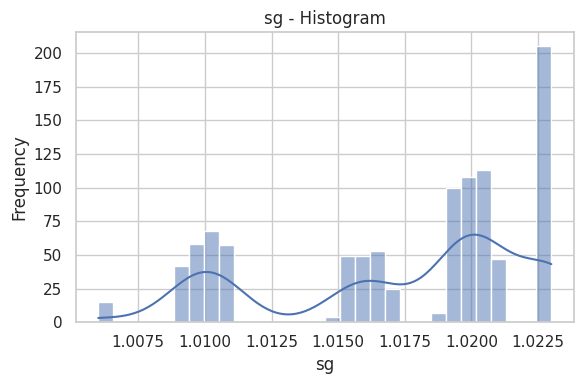

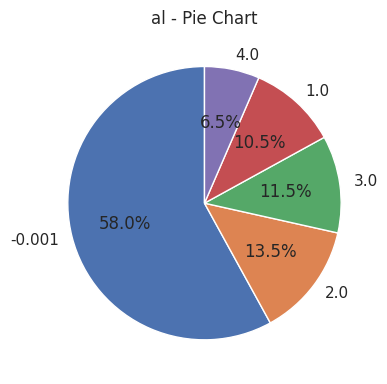

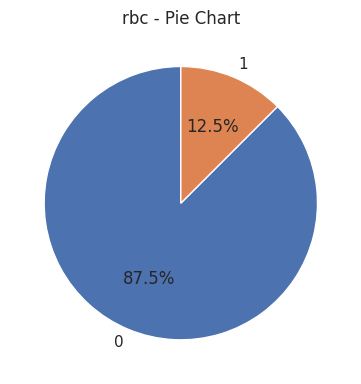

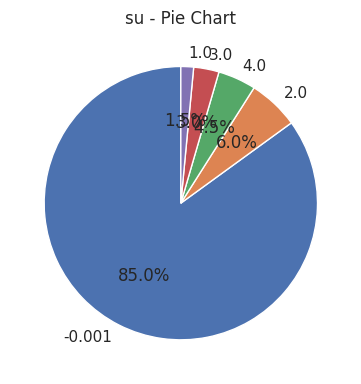

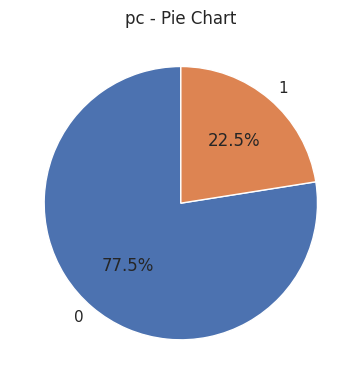

...

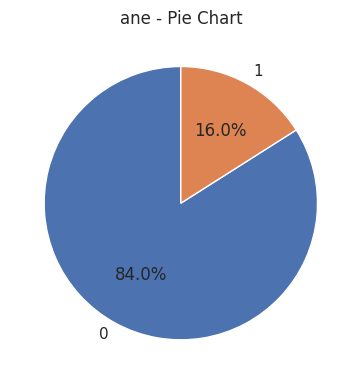

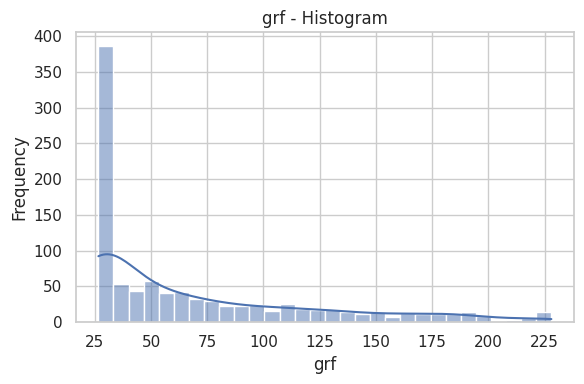

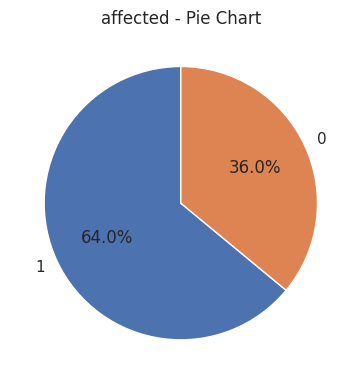

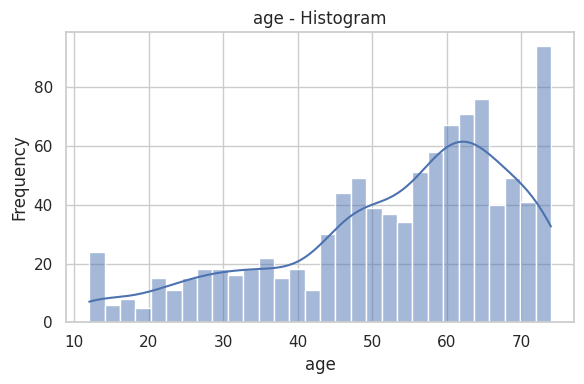

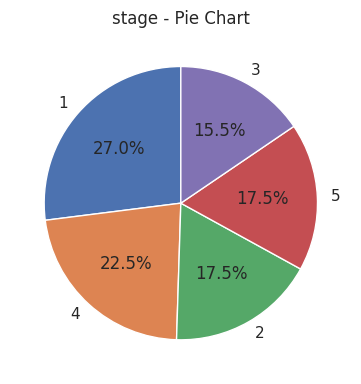


📊 Feature distributions for /content/egfr 400.csv


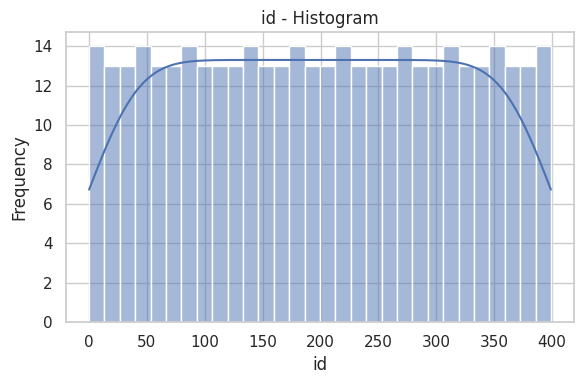

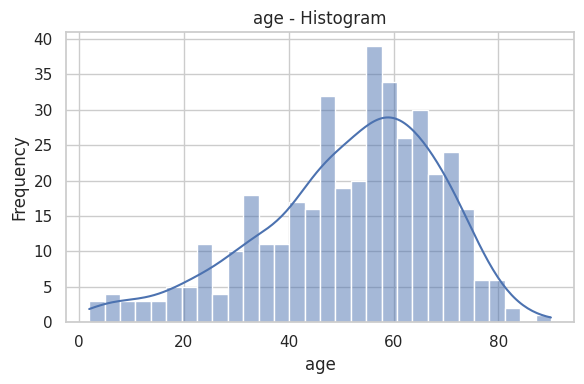

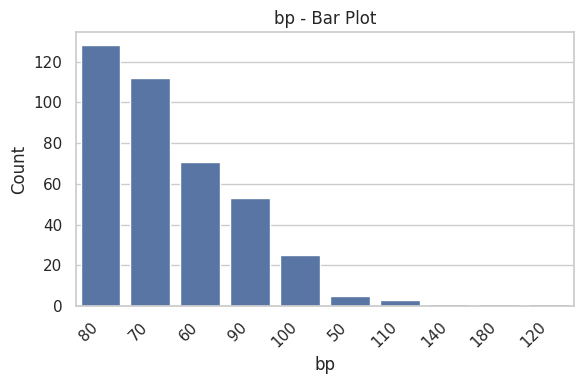

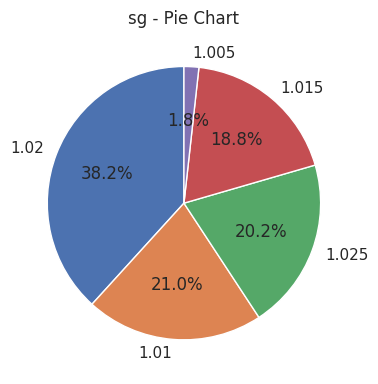

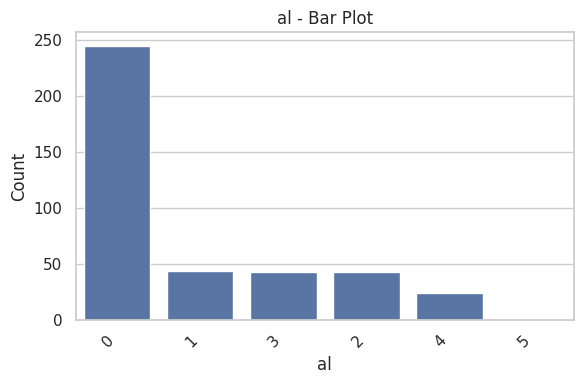

...

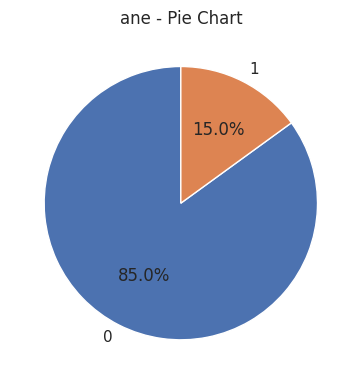

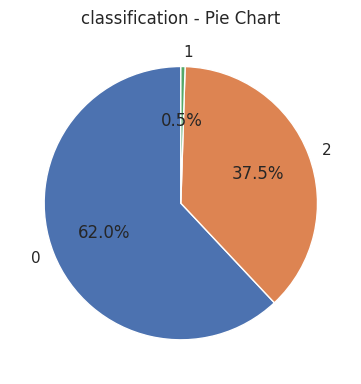

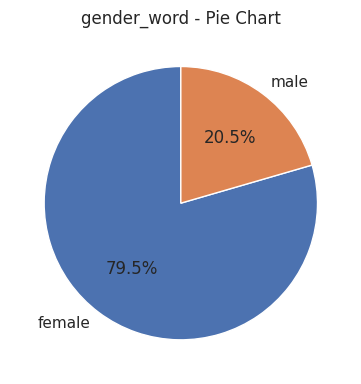

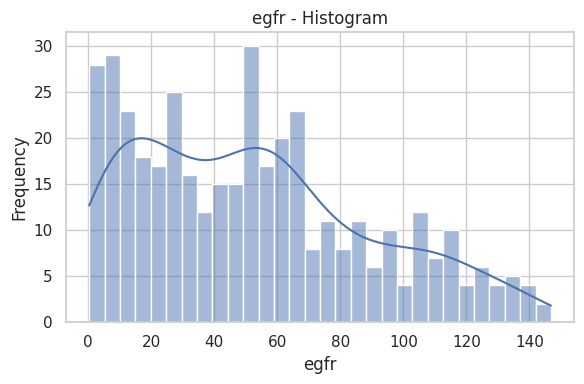

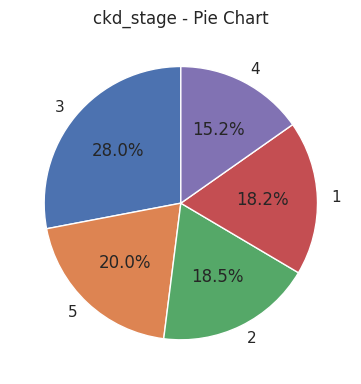


📊 Feature distributions for /content/CKD_dataset_AbuDhabi (1).csv


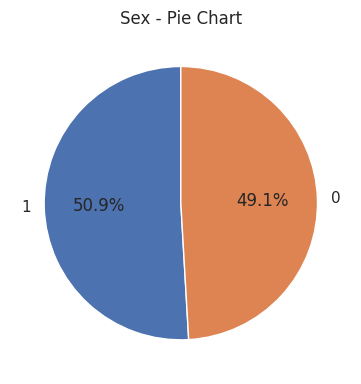

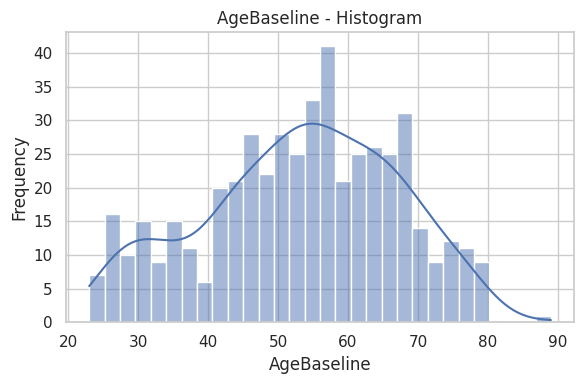

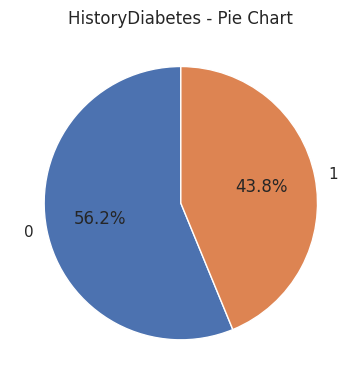

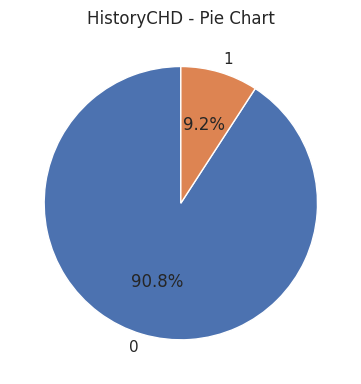

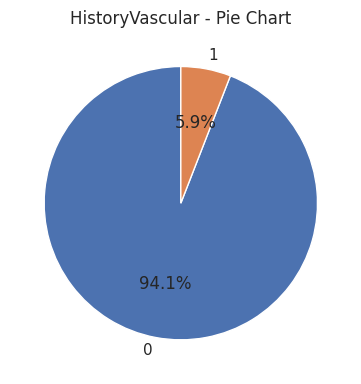

...

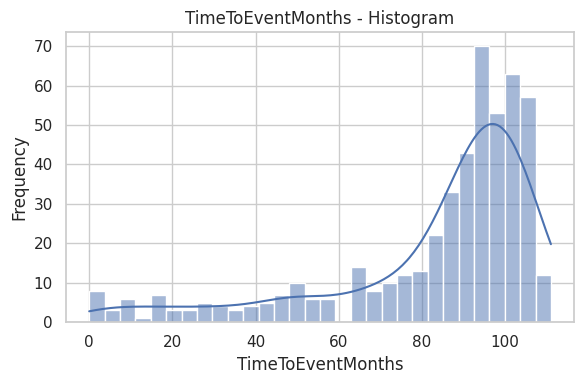

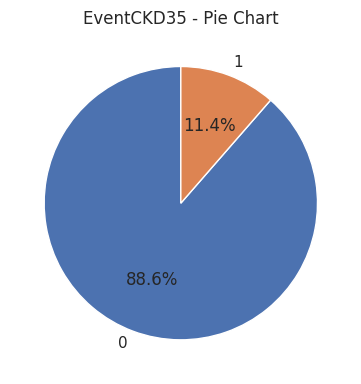

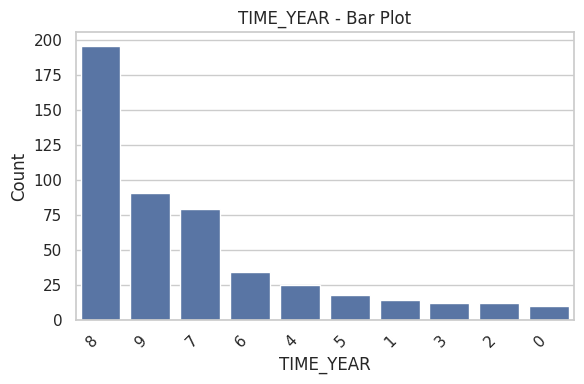

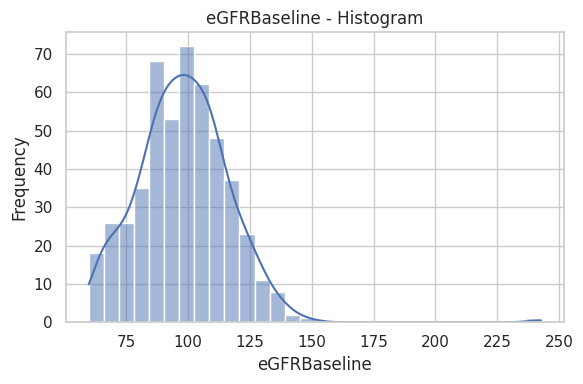

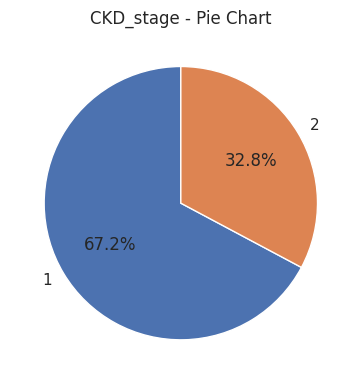


📊 Feature distributions for /content/40K_dataset - 40K_dataset (1).csv


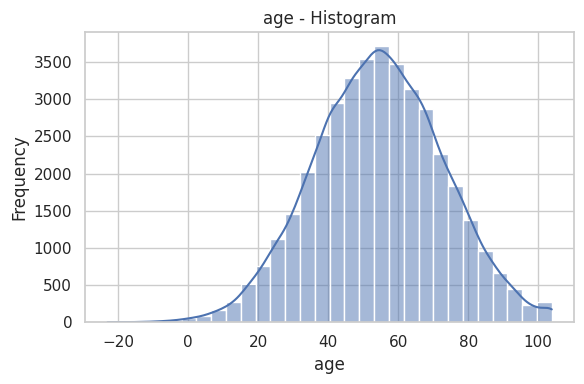

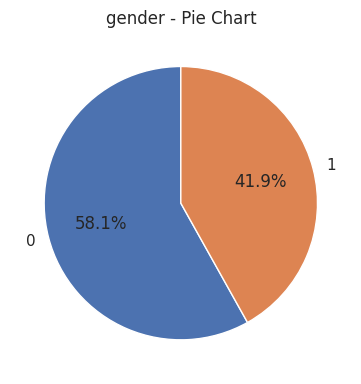

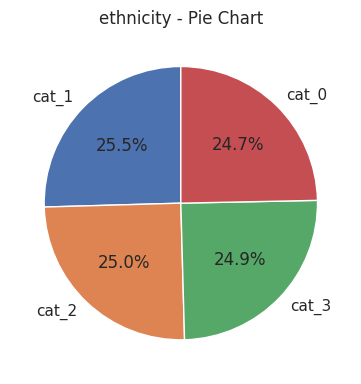

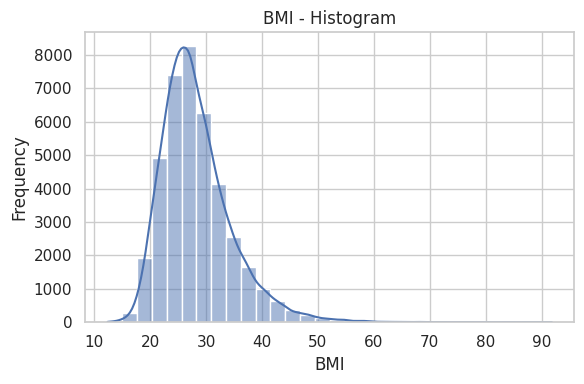

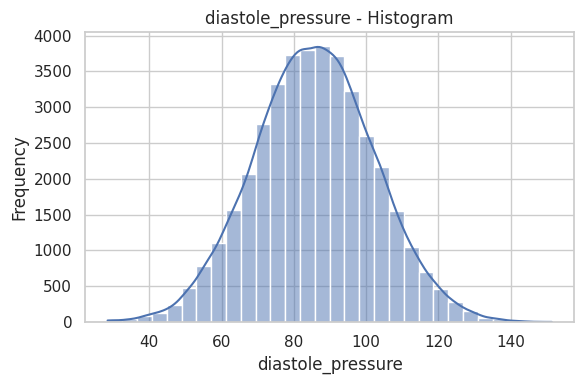

...

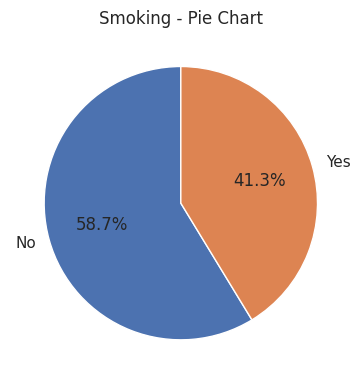

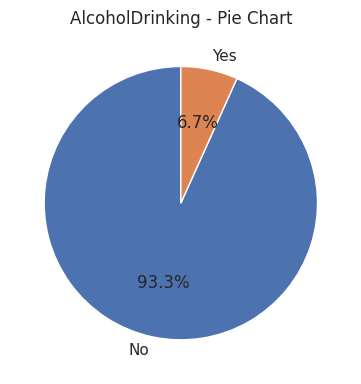

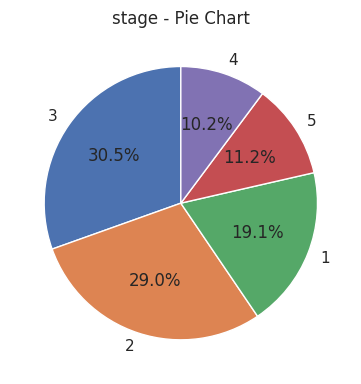

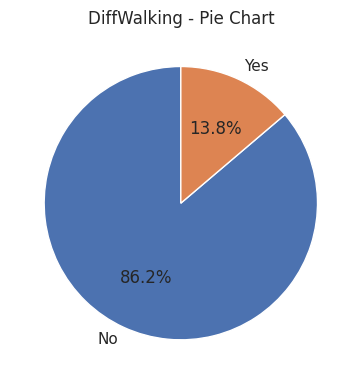

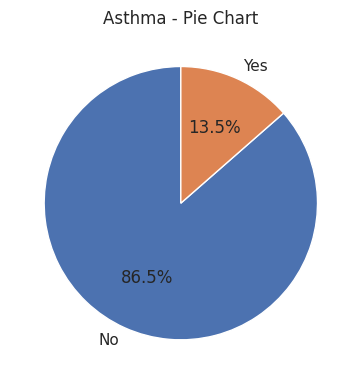

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For cleaner plots
sns.set(style="whitegrid")
plt.rcParams.update({'figure.max_open_warning': 0})  # avoid too many open figure warnings

# List of file paths
file_paths = ["/content/imputed data.csv", "/content/egfr 400.csv", "/content/CKD_dataset_AbuDhabi (1).csv", "/content/40K_dataset - 40K_dataset (1).csv"]

# Function to plot feature distributions
def plot_feature_distributions(df, file_name):
    print(f"\n📊 Feature distributions for {file_name}")
    for column in df.columns:
        plt.figure(figsize=(6, 4))
        unique_vals = df[column].nunique()
        dtype = df[column].dtype

        # Categorical features
        if dtype == 'object' or unique_vals <= 10:
            value_counts = df[column].value_counts(dropna=False)

            if unique_vals <= 5:
                # Pie chart for very few categories
                value_counts.plot.pie(autopct='%1.1f%%', startangle=90)
                plt.ylabel('')
                plt.title(f"{column} - Pie Chart")
            else:
                # Bar plot for more categories
                sns.barplot(x=value_counts.index.astype(str), y=value_counts.values)
                plt.title(f"{column} - Bar Plot")
                plt.xticks(rotation=45, ha='right')
                plt.ylabel('Count')
                plt.xlabel(column)

        # Numerical features
        else:
            sns.histplot(df[column].dropna(), kde=True, bins=30)
            plt.title(f"{column} - Histogram")
            plt.xlabel(column)
            plt.ylabel('Frequency')

        plt.tight_layout()
        plt.show()

# Read and visualize each file
for path in file_paths:
    try:
        df = pd.read_csv(path)
        plot_feature_distributions(df, path)
    except Exception as e:
        print(f"Error processing {path}: {e}")



📊 Feature distributions for /content/chronic kidney disease (1).csv


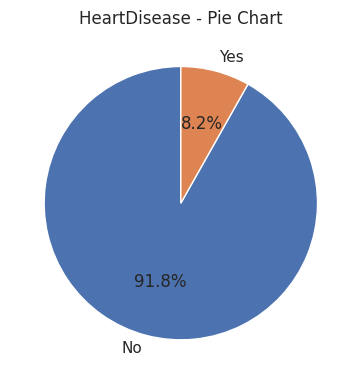

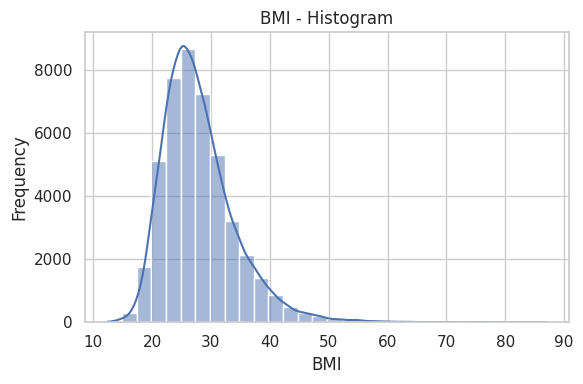

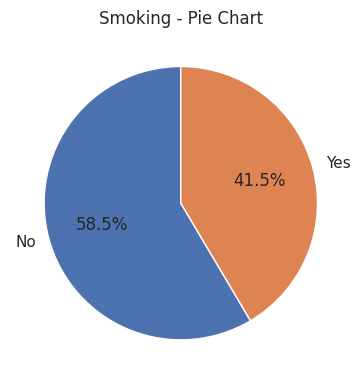

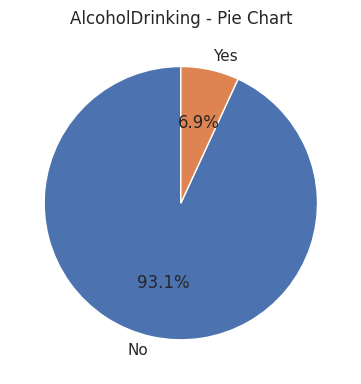

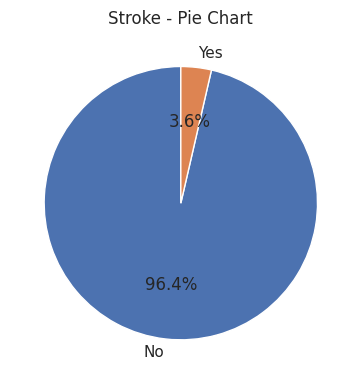

...

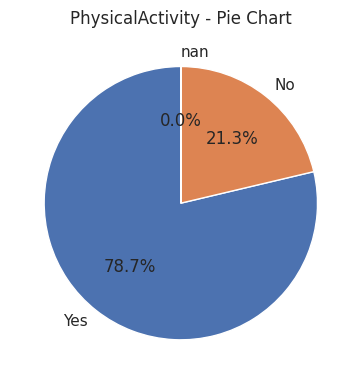

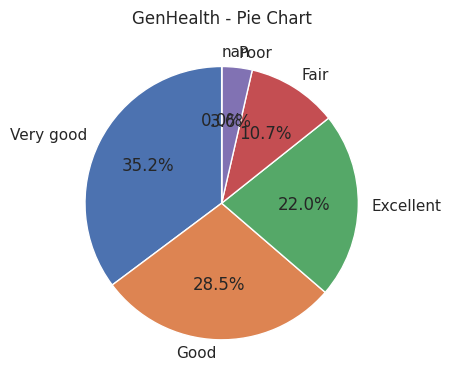

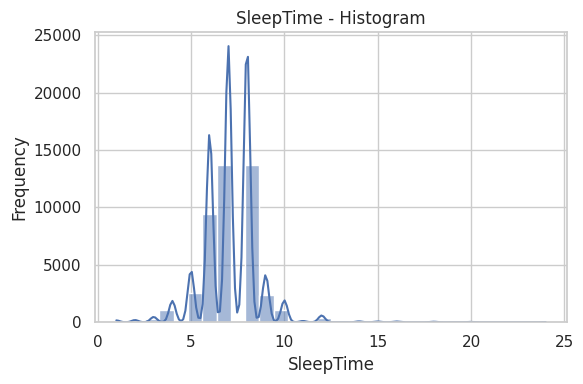

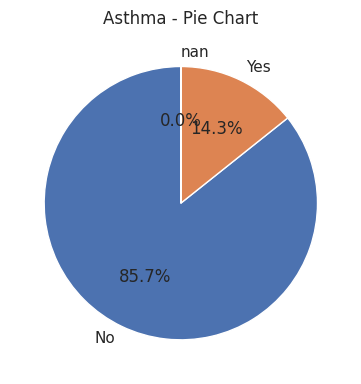

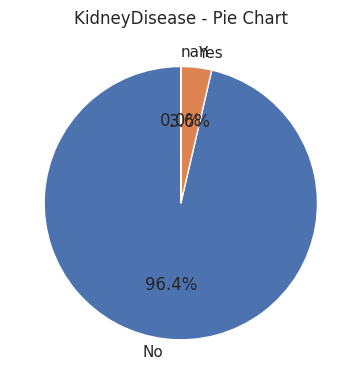

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For cleaner plots
sns.set(style="whitegrid")
plt.rcParams.update({'figure.max_open_warning': 0})  # avoid too many open figure warnings

# Path to a single file
file_path = "/content/chronic kidney disease (1).csv"  # <-- change this to your dataset path

# Function to plot feature distributions
def plot_feature_distributions(df, file_name):
    print(f"\n📊 Feature distributions for {file_name}")
    for column in df.columns:
        plt.figure(figsize=(6, 4))
        unique_vals = df[column].nunique()
        dtype = df[column].dtype

        # Categorical features
        if dtype == 'object' or unique_vals <= 10:
            value_counts = df[column].value_counts(dropna=False)

            if unique_vals <= 5:
                # Pie chart for very few categories
                value_counts.plot.pie(autopct='%1.1f%%', startangle=90)
                plt.ylabel('')
                plt.title(f"{column} - Pie Chart")
            else:
                # Bar plot for more categories
                sns.barplot(x=value_counts.index.astype(str), y=value_counts.values)
                plt.title(f"{column} - Bar Plot")
                plt.xticks(rotation=45, ha='right')
                plt.ylabel('Count')
                plt.xlabel(column)

        # Numerical features
        else:
            sns.histplot(df[column].dropna(), kde=True, bins=30)
            plt.title(f"{column} - Histogram")
            plt.xlabel(column)
            plt.ylabel('Frequency')

        plt.tight_layout()
        plt.show()

# Read and visualize the file
try:
    df = pd.read_csv(file_path)
    plot_feature_distributions(df, file_path)
except Exception as e:
    print(f"Error processing {file_path}: {e}")


In [ ]:
import pandas as pd

# List of file paths
file_paths = ["/content/imputed data.csv", "/content/egfr 400.csv", "/content/CKD_dataset_AbuDhabi (1).csv", "/content/40K_dataset - 40K_dataset (1).csv"]

# Function to calculate and print missing value percentages
def show_missing_percentages(df, file_name):
    print(f"\n📋 Missing Value Percentage in {file_name}:")
    missing_percent = df.isnull().mean() * 100
    missing_percent = missing_percent[missing_percent > 0].sort_values(ascending=False)
    if missing_percent.empty:
        print("✅ No missing values.")
    else:
        print(missing_percent.round(2).to_string())

# Iterate through each file
for path in file_paths:
    try:
        df = pd.read_csv(path)
        show_missing_percentages(df, path)
    except Exception as e:
        print(f"Error processing {path}: {e}")



📋 Missing Value Percentage in /content/imputed data.csv:
✅ No missing values.

📋 Missing Value Percentage in /content/egfr 400.csv:
✅ No missing values.

📋 Missing Value Percentage in /content/CKD_dataset_AbuDhabi (1).csv:
✅ No missing values.

📋 Missing Value Percentage in /content/40K_dataset - 40K_dataset (1).csv:
✅ No missing values.


In [ ]:
# unique values
def get_unique_values(dataframe, max_display=20):
    for column in dataframe.columns:
        unique_vals = dataframe[column].unique()
        print(f"\n{column}:")
        print(f"Number of unique values: {len(unique_vals)}")
        if len(unique_vals) <= max_display:
            print(f"Values: {unique_vals}")
        else:
            print(f"Too many values to display ({len(unique_vals)} unique values)")

get_unique_values(df)


age:
Number of unique values: 40879
Too many values to display (40879 unique values)

gender:
Number of unique values: 2
Values: [1 0]

ethnicity:
Number of unique values: 3
Values: [1 3 2]

BMI:
Number of unique values: 5229
Too many values to display (5229 unique values)

diastole_pressure:
Number of unique values: 40184
Too many values to display (40184 unique values)

creatinine:
Number of unique values: 34682
Too many values to display (34682 unique values)

hemoglobin:
Number of unique values: 42344
Too many values to display (42344 unique values)

egfr:
Number of unique values: 43048
Too many values to display (43048 unique values)

sodium:
Number of unique values: 42820
Too many values to display (42820 unique values)

potassium:
Number of unique values: 39077
Too many values to display (39077 unique values)

urea:
Number of unique values: 34607
Too many values to display (34607 unique values)

albumin:
Number of unique values: 40570
Too many values to display (40570 unique va

In [ ]:
# Data Quality Analysis

# Summary statistics for numerical columns
print("\nSummary Statistics for Numerical Columns:")
numerical_summary = df.describe()
print(numerical_summary)

# outliers in numerical columns (IQR method)
print("\n Outliers in Numerical Columns:")
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]
    outliers_percentage = (outliers_count / df.shape[0]) * 100

    print(f"{col}: {outliers_count} outliers ({outliers_percentage:.2f}% of data)")

# counts for categorical columns
print("\nValue Counts for Categorical Columns (Top 5):")
categorical_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns

for col in categorical_cols:
    print(f"\n{col}:")
    print(df[col].value_counts().head())

# imbalanced binary features
print("\nImbalance Check for Binary Features:")
for col in df.columns:
    if df[col].nunique() == 2:
        value_counts = df[col].value_counts(normalize=True) * 100
        print(f"\n{col}:")
        for value, percentage in value_counts.items():
            print(f"  {value}: {percentage:.2f}%")


Summary Statistics for Numerical Columns:
                age        gender     ethnicity  diastole_pressure  \
count  46009.000000  46009.000000  46009.000000       46009.000000   
mean      54.485152      0.419527      2.003565          85.523022   
std       18.489952      0.493487      0.814570          16.550533   
min      -22.997852      0.000000      1.000000          28.445368   
25%       41.710578      0.000000      1.000000          74.299578   
50%       54.699187      0.000000      2.000000          85.082913   
75%       67.285046      1.000000      3.000000          96.708983   
max      103.881710      1.000000      3.000000         180.000000   

         creatinine    hemoglobin          egfr        sodium     potassium  \
count  46009.000000  46009.000000  46009.000000  46009.000000  46009.000000   
mean       3.423577     13.308766     61.292679    138.909736      5.185057   
std        2.944377      2.521525     34.601172      5.057333      2.519258   
min       

In [ ]:
# Missing Value Analysis

# Count of missing values per column
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

missing_info = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage (%)': missing_percentage
})
missing_info = missing_info.sort_values('Missing Values', ascending=False)

print("Missing Values Analysis:")
print(missing_info)

print("\nColumns with Missing Values:")
columns_with_missing = missing_info[missing_info['Missing Values'] > 0]
if len(columns_with_missing) > 0:
    print(columns_with_missing)
else:
    print("No missing values found in the dataset!")

print("\nMissing Values Pattern (sample of 10 rows):")
if missing_values.sum() > 0:
    # Get columns with missing values
    cols_with_missing = [col for col in df.columns if df[col].isnull().any()]

    sample_rows = df[df[cols_with_missing].isnull().any(axis=1)].sample(min(10, df[df[cols_with_missing].isnull().any(axis=1)].shape[0]))

    pattern = sample_rows[cols_with_missing].isnull()


    pattern_display = pattern.replace({True: 'Missing', False: 'Present'})
    print(pattern_display)
else:
    print("No missing values to visualize!")

# total missing values
total_missing = missing_values.sum()
total_cells = df.size
missing_percentage_total = (total_missing / total_cells) * 100

print(f"\nTotal Missing Values: {total_missing} out of {total_cells} cells ({missing_percentage_total:.2f}%)")

Missing Values Analysis:
                        Missing Values  Percentage (%)
age                                  0             0.0
gender                               0             0.0
ethnicity                            0             0.0
BMI                                  0             0.0
diastole_pressure                    0             0.0
creatinine                           0             0.0
hemoglobin                           0             0.0
egfr                                 0             0.0
sodium                               0             0.0
potassium                            0             0.0
urea                                 0             0.0
albumin                              0             0.0
blood_glucose                        0             0.0
HBA1C                                0             0.0
rbcc                                 0             0.0
wbcc                                 0             0.0
packed_cell_volume                   0  

In [ ]:
# Duplicate Check

duplicate_rows = df.duplicated().sum()
duplicate_percentage = (duplicate_rows / len(df)) * 100

print(f"Number of duplicate rows: {duplicate_rows} ({duplicate_percentage:.2f}% of the dataset)")

if duplicate_rows > 0:
    print("\nFirst 5 duplicate rows:")
    print(df[df.duplicated(keep='first')].head())

    print("\nChecking for potential ID columns or unique identifiers:")
    for col in df.columns:
        unique_count = df[col].nunique()
        unique_percentage = (unique_count / len(df)) * 100
        if unique_count == len(df):
            print(f"Column '{col}' has all unique values (potential ID column)")
        elif unique_percentage > 95:
            print(f"Column '{col}' has {unique_count} unique values ({unique_percentage:.2f}% of rows)")

    print("\nChecking for potential duplicate records based on key features:")


    demographic_cols = [col for col in df.columns if col in ['age', 'gender', 'ethnicity', 'BMI']]
    if demographic_cols:
        demographic_dupes = df.duplicated(subset=demographic_cols).sum()
        print(f"Duplicate records based on demographic features: {demographic_dupes}")


    medical_cols = [col for col in df.columns if col in ['diastole_pressure', 'creatinine', 'hemoglobin', 'egfr']]
    if medical_cols:
        medical_dupes = df.duplicated(subset=medical_cols).sum()
        print(f"Duplicate records based on key medical indicators: {medical_dupes}")
else:
    print("No duplicate rows found in the dataset.")

Number of duplicate rows: 0 (0.00% of the dataset)
No duplicate rows found in the dataset.


In [ ]:
# Data Type Verification


print("Current Data Types:")
print(df.dtypes)

print("\n Data Type Issues:")

for col in df.columns:
    if df[col].dtype == 'object':

        try:
            pd.to_numeric(df[col])
            print(f"Column '{col}' is stored as object but contains numeric values")
        except:

            try:
                pd.to_datetime(df[col])
                print(f"Column '{col}' is stored as object but contains date values")
            except:

                if df[col].nunique() <= 2 and set(df[col].dropna().unique()).issubset({'True', 'False', 'true', 'false', 'Yes', 'No', 'yes', 'no', 'Y', 'N', 'y', 'n', '1', '0', 1, 0}):
                    print(f"Column '{col}' is stored as object but might be boolean")

# Check for inconsistent values in categorical columns
print("\nInconsistent Values in Categorical Columns:")
categorical_cols = df.select_dtypes(include=['object']).columns

for col in categorical_cols:

    value_counts = df[col].str.lower().value_counts() if df[col].dtype == 'object' else df[col].value_counts()
    original_counts = df[col].value_counts()

    if len(value_counts) < len(original_counts):
        print(f"Column '{col}' has inconsistent capitalization")

    if df[col].dtype == 'object':
        stripped_values = df[col].str.strip()
        if not (stripped_values == df[col]).all():
            print(f"Column '{col}' has values with leading/trailing spaces")





Current Data Types:
age                        float64
gender                       int64
ethnicity                    int64
BMI                         object
diastole_pressure          float64
creatinine                 float64
hemoglobin                 float64
egfr                       float64
sodium                     float64
potassium                  float64
urea                       float64
albumin                    float64
blood_glucose              float64
HBA1C                      float64
rbcc                       float64
wbcc                       float64
packed_cell_volume         float64
anemia                       int64
appetite                     int64
hypertension                 int64
diabetes                     int64
coronary_heart_disease       int64
acute_kidney_injury          int64
edema                        int64
Smoking                      int64
AlcoholDrinking              int64
stage                        int64
DiffWalking                  int64


<ipython-input-19-4ee84ae8071d>:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(df[col])


<Figure size 1600x1600 with 0 Axes>

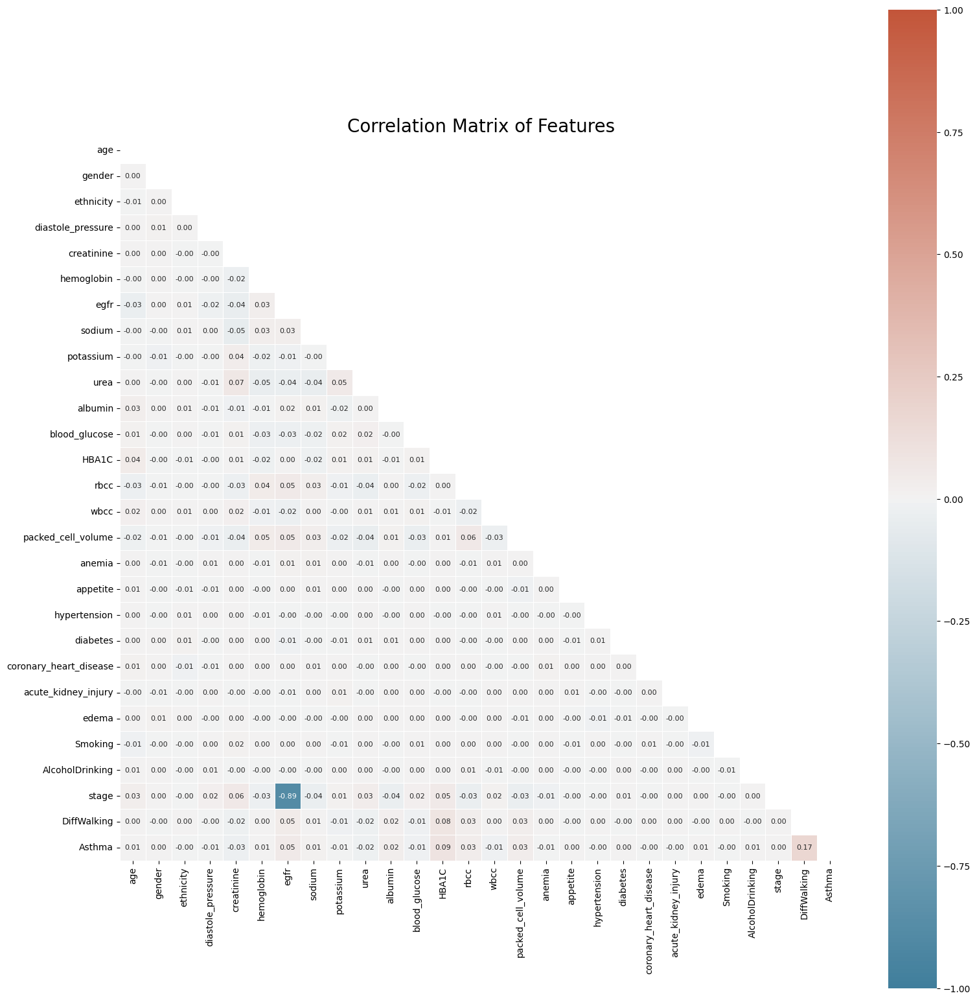

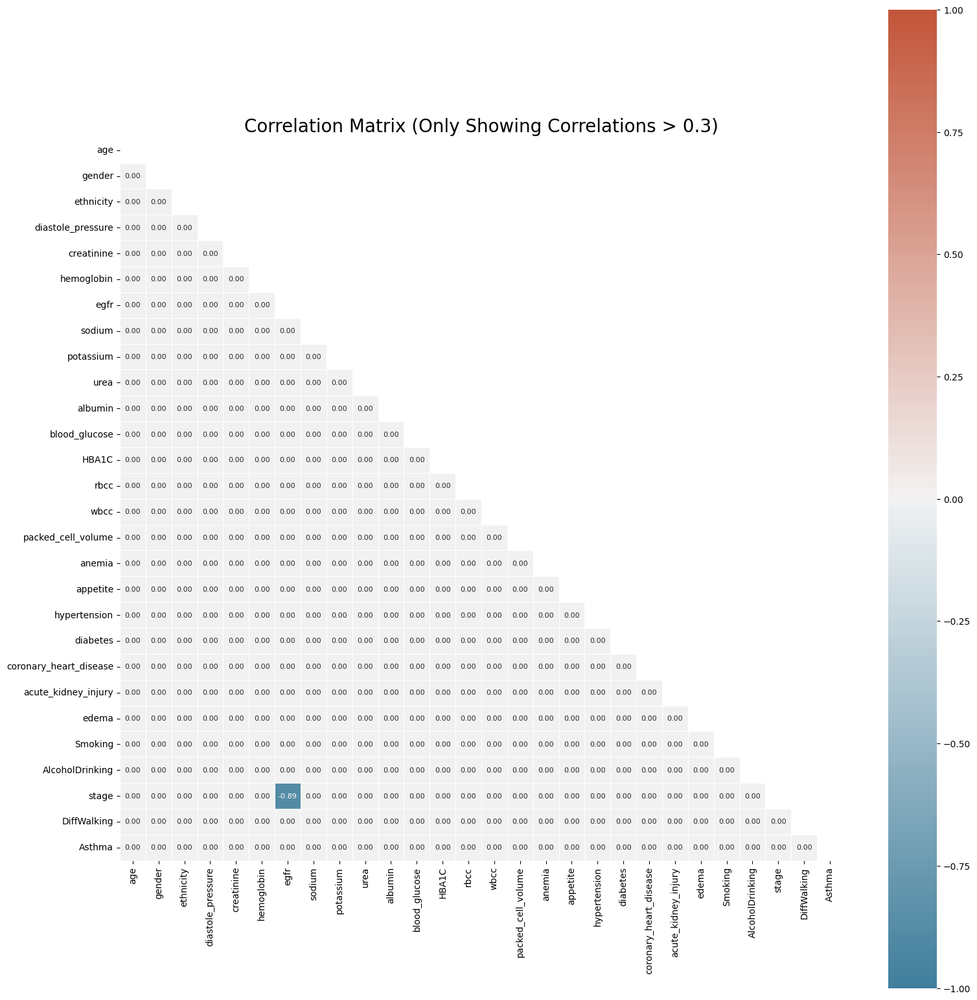

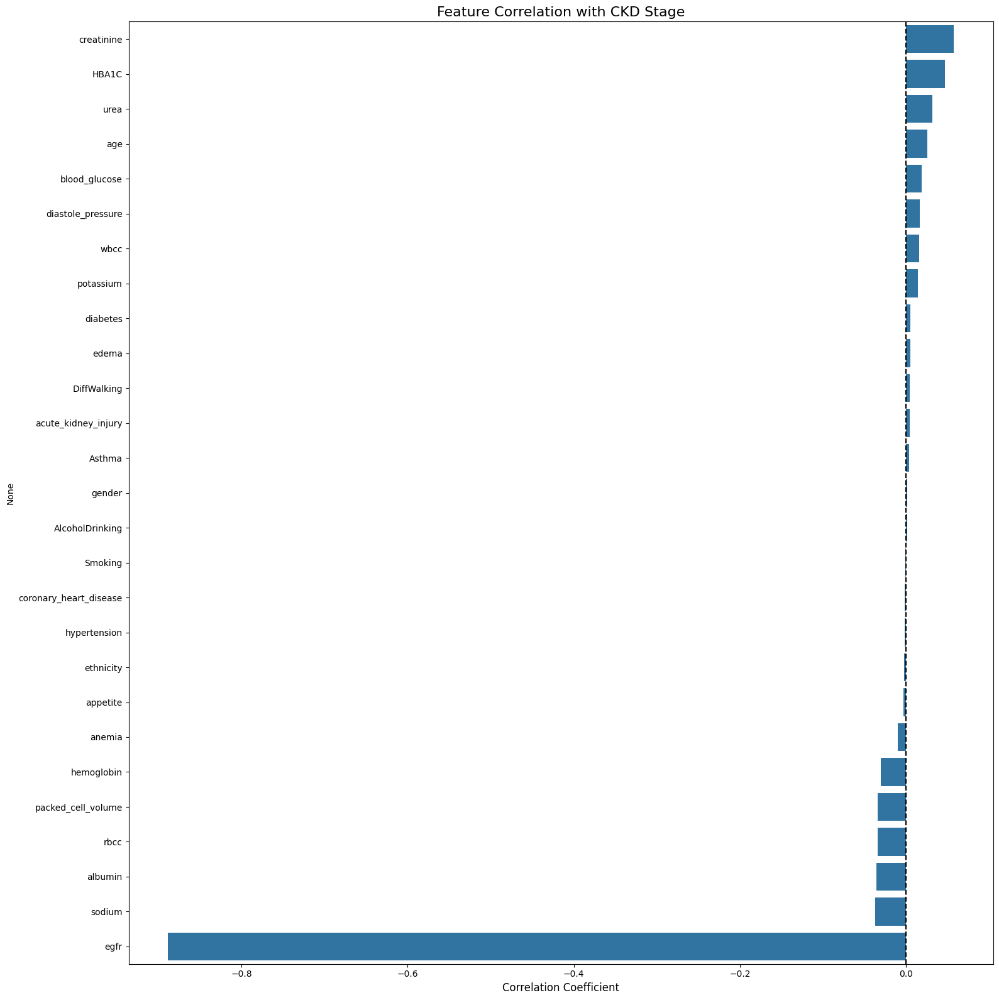

In [ ]:



plt.figure(figsize=(16,16))


numeric_df = df.select_dtypes(include=['int64', 'float64', 'boolean'])


corr_matrix = numeric_df.corr()


mask = np.triu(np.ones_like(corr_matrix, dtype=bool))


plt.figure(figsize=(16,16))


cmap = sns.diverging_palette(230, 20, as_cmap=True)


sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, annot=True, fmt=".2f", annot_kws={"size": 8})

plt.title('Correlation Matrix of Features', fontsize=20)
plt.tight_layout()
plt.show()


plt.figure(figsize=(16,16))


threshold = 0.3


corr_matrix_thresholded = corr_matrix.copy()
corr_matrix_thresholded[abs(corr_matrix) < threshold] = 0


mask = np.triu(np.ones_like(corr_matrix_thresholded, dtype=bool))


sns.heatmap(corr_matrix_thresholded, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, annot=True, fmt=".2f", annot_kws={"size": 8})

plt.title(f'Correlation Matrix (Only Showing Correlations > {threshold})', fontsize=20)
plt.tight_layout()
plt.show()


if 'stage' in df.columns:
    plt.figure(figsize=(16,16))


    target_corr = corr_matrix['stage'].sort_values(ascending=False)


    target_corr = target_corr.drop('stage')


    sns.barplot(x=target_corr.values, y=target_corr.index)
    plt.title('Feature Correlation with CKD Stage', fontsize=16)
    plt.xlabel('Correlation Coefficient', fontsize=12)
    plt.axvline(x=0, color='black', linestyle='--')
    plt.tight_layout()
    plt.show()

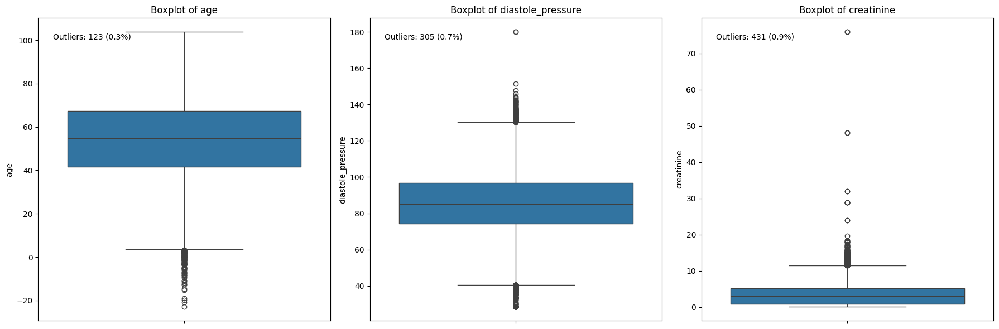

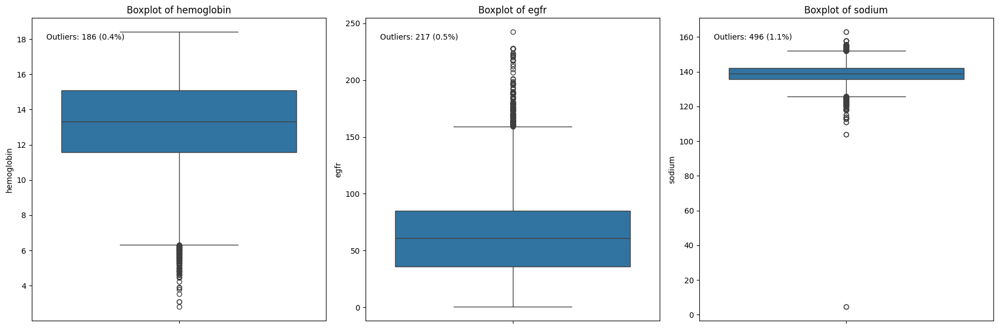

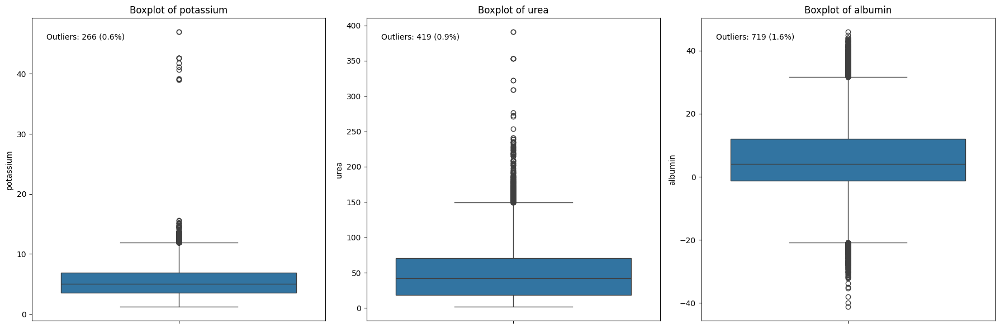

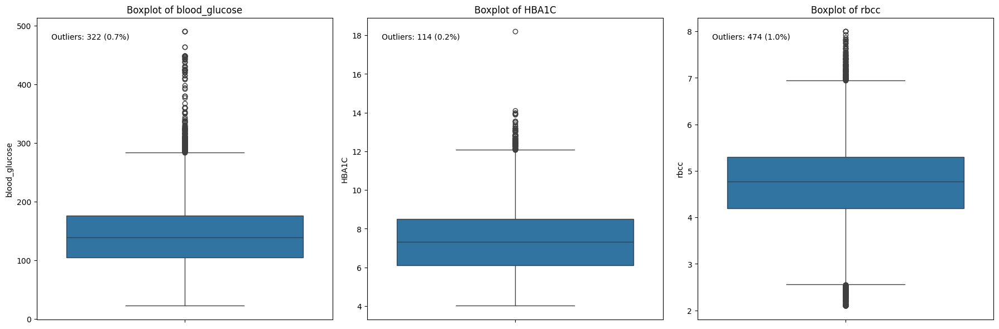

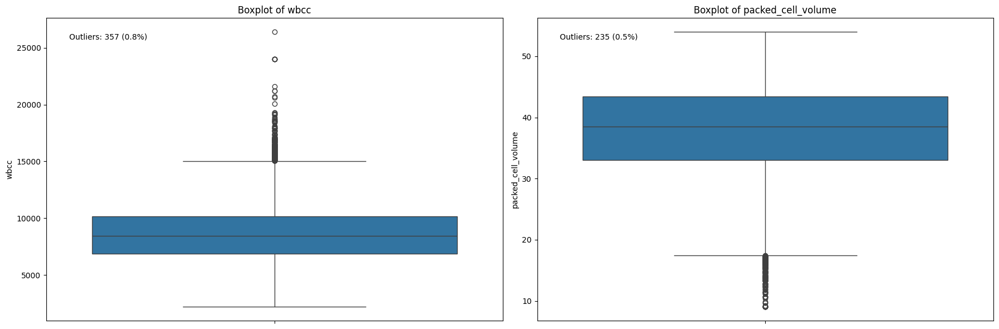

In [ ]:



numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()


if 'stage' in numerical_cols:
    numerical_cols.remove('stage')

important_cols = [
    'age', 'BMI', 'diastole_pressure', 'creatinine', 'hemoglobin',
    'egfr', 'sodium', 'potassium', 'urea', 'albumin', 'blood_glucose',
    'HBA1C', 'rbcc', 'wbcc', 'packed_cell_volume'
]


plot_cols = [col for col in important_cols if col in numerical_cols]

if not plot_cols:
    plot_cols = numerical_cols

for i in range(0, len(plot_cols), 3):
    subset_cols = plot_cols[i:i+3]


    fig, axes = plt.subplots(1, len(subset_cols), figsize=(18, 6))


    if len(subset_cols) == 1:
        axes = [axes]


    for j, col in enumerate(subset_cols):
        sns.boxplot(y=df[col], ax=axes[j])
        axes[j].set_title(f'Boxplot of {col}')
        axes[j].set_ylabel(col)


        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = df[(df[col] < (Q1 - 1.5 * IQR)) | (df[col] > (Q3 + 1.5 * IQR))][col]
        outlier_count = len(outliers)
        outlier_percent = (outlier_count / len(df)) * 100

        axes[j].text(0.05, 0.95, f'Outliers: {outlier_count} ({outlier_percent:.1f}%)',
                    transform=axes[j].transAxes, verticalalignment='top')

    plt.tight_layout()
    plt.show()



<ipython-input-16-12818d41e18f>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='stage', data=df, ax=ax1, palette='viridis')


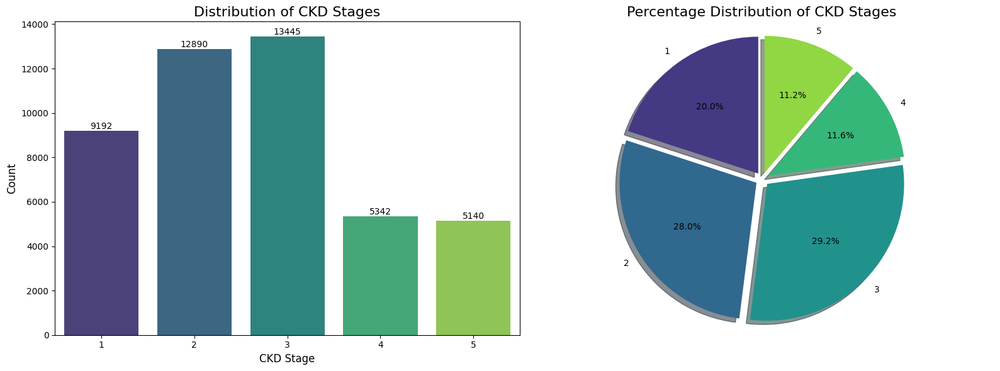

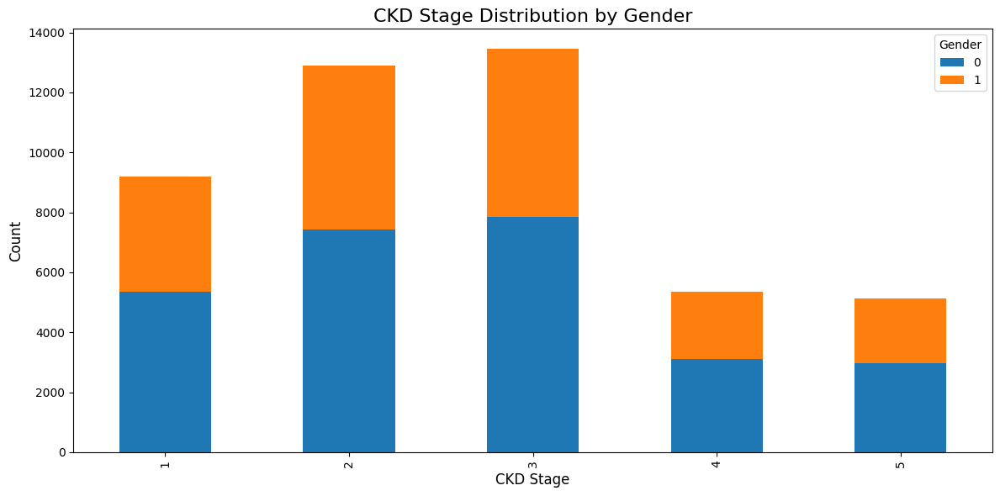

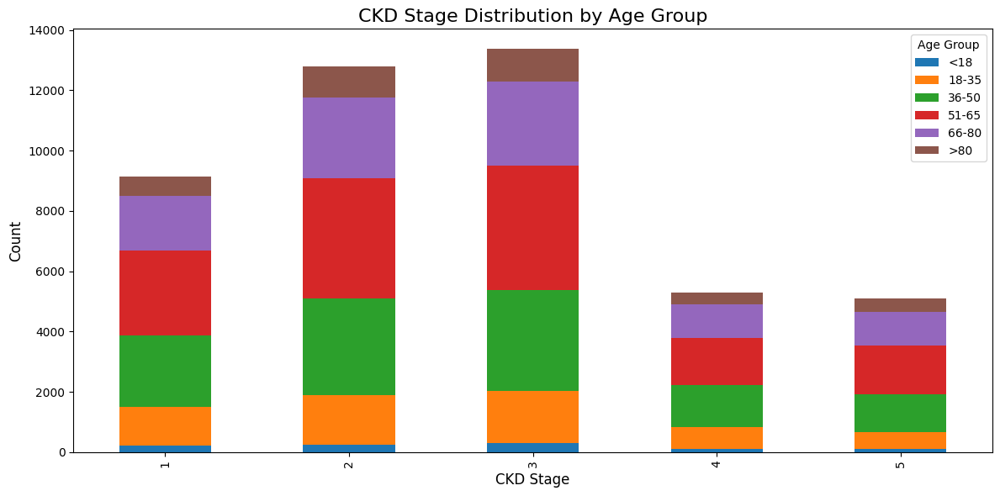

In [ ]:



if 'stage' in df.columns:

    stage_counts = df['stage'].value_counts().sort_index()


    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))


    sns.countplot(x='stage', data=df, ax=ax1, palette='viridis')
    ax1.set_title('Distribution of CKD Stages', fontsize=16)
    ax1.set_xlabel('CKD Stage', fontsize=12)
    ax1.set_ylabel('Count', fontsize=12)


    for p in ax1.patches:
        ax1.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha = 'center', va = 'bottom', fontsize=10)


    ax2.pie(stage_counts, labels=stage_counts.index, autopct='%1.1f%%',
            startangle=90, shadow=True, explode=[0.05]*len(stage_counts),
            colors=sns.color_palette('viridis', len(stage_counts)))
    ax2.set_title('Percentage Distribution of CKD Stages', fontsize=16)
    ax2.axis('equal')

    plt.tight_layout()
    plt.show()


    if 'gender' in df.columns:
        plt.figure(figsize=(12, 6))


        if df['gender'].dtype == 'boolean':
            gender_col = df['gender'].map({True: 'Male', False: 'Female'})
        else:
            gender_col = df['gender']


        stage_gender = pd.crosstab(df['stage'], gender_col)


        stage_gender.plot(kind='bar', stacked=True, ax=plt.gca())
        plt.title('CKD Stage Distribution by Gender', fontsize=16)
        plt.xlabel('CKD Stage', fontsize=12)
        plt.ylabel('Count', fontsize=12)
        plt.legend(title='Gender')
        plt.tight_layout()
        plt.show()


    if 'age' in df.columns:
        plt.figure(figsize=(12, 6))


        age_bins = [0, 18, 35, 50, 65, 80, 100]
        age_labels = ['<18', '18-35', '36-50', '51-65', '66-80', '>80']
        df['age_group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels)


        stage_age = pd.crosstab(df['stage'], df['age_group'])


        stage_age.plot(kind='bar', stacked=True, ax=plt.gca())
        plt.title('CKD Stage Distribution by Age Group', fontsize=16)
        plt.xlabel('CKD Stage', fontsize=12)
        plt.ylabel('Count', fontsize=12)
        plt.legend(title='Age Group')
        plt.tight_layout()
        plt.show()
else:
    print("'stage' column not found in the dataframe. Please check your column names.")

# **Preprocessing**

Starting data preprocessing...

1. Handling inconsistent data...
Found 2061 inconsistencies between stage and eGFR values

2. Performing feature engineering...
Created new feature: albumin_creatinine_ratio

Albumin to Creatinine Ratio statistics:
count    46009.000000
mean        14.632353
std         70.568456
min       -561.506426
25%         -0.350377
50%          1.292779
75%          5.330924
max        444.550098
Name: albumin_creatinine_ratio, dtype: float64

3. Performing Z-score standardization...
Added Z-score standardized columns for 12 numerical features
Scaler saved successfully!

4. Handling outliers...
BMI: Q1=24.33, Q3=31.11, IQR=6.78
  Lower bound: 14.16, Upper bound: 41.29
  Outliers: 1663 (16 below, 1647 above)
creatinine: Q1=0.90, Q3=5.16, IQR=4.26
  Lower bound: -5.49, Upper bound: 11.56
  Outliers: 431 (0 below, 431 above)
hemoglobin: Q1=11.58, Q3=15.10, IQR=3.52
  Lower bound: 6.31, Upper bound: 20.37
  Outliers: 186 (186 below, 0 above)
egfr: Q1=35.69, Q3=85.06,

<ipython-input-6-a75de1c605d6>:67: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_enhanced['albumin_creatinine_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)


albumin: Q1=-1.17, Q3=11.97, IQR=13.14
  Lower bound: -20.87, Upper bound: 31.68
  Outliers: 719 (345 below, 374 above)
blood_glucose: Q1=104.48, Q3=176.18, IQR=71.70
  Lower bound: -3.07, Upper bound: 283.72
  Outliers: 322 (0 below, 322 above)
rbcc: Q1=4.20, Q3=5.30, IQR=1.10
  Lower bound: 2.56, Upper bound: 6.94
  Outliers: 474 (276 below, 198 above)
wbcc: Q1=6901.96, Q3=10159.28, IQR=3257.31
  Lower bound: 2015.99, Upper bound: 15045.25
  Outliers: 357 (0 below, 357 above)
albumin_creatinine_ratio: Q1=-0.35, Q3=5.33, IQR=5.68
  Lower bound: -8.87, Upper bound: 13.85
  Outliers: 10424 (3239 below, 7185 above)

Total outliers found and capped: 15974

5. Handling class imbalance for stage using SMOTE...
Original class distribution:
stage
1     9192
2    12890
3    13445
4     5342
5     5140
Name: count, dtype: int64
Found NaN values in the data. Imputing missing values before applying SMOTE...
Imputation complete. NaN values replaced with median values.
Balanced class distribution:


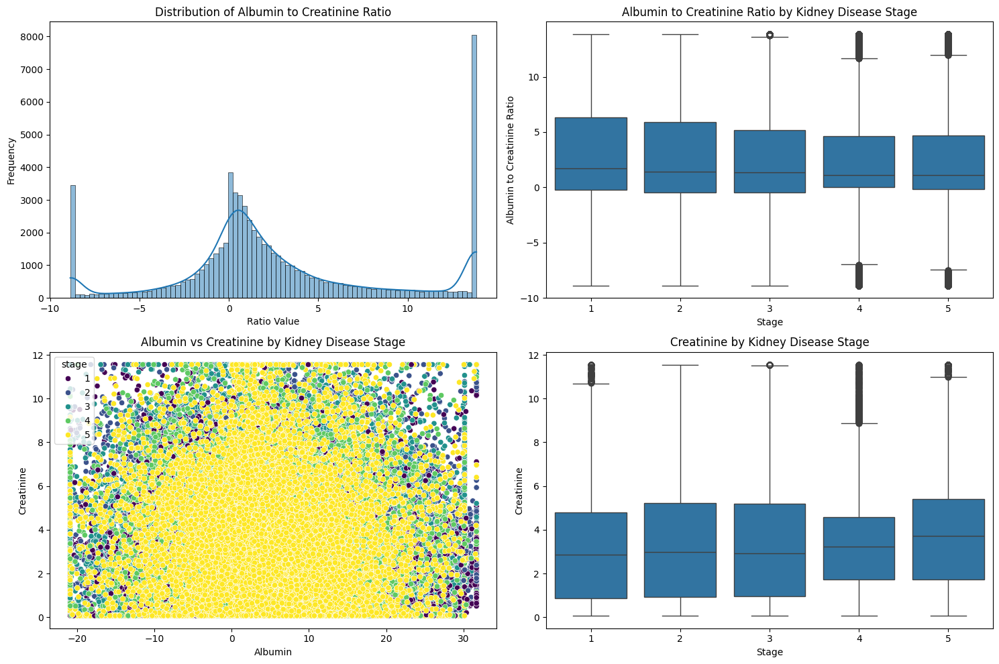

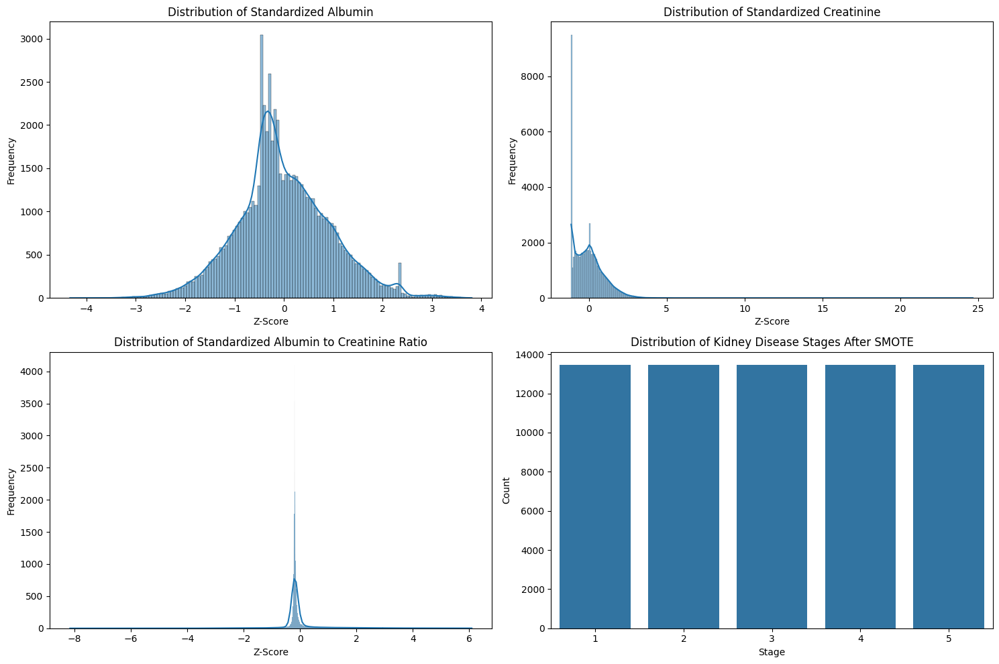

In [ ]:
# 1. Handle inconsistent data
def handle_inconsistent_data(df):
    print("\n1. Handling inconsistent data...")


    df_clean = df.copy()


    numeric_cols = ['BMI', 'diastolic_bp', 'creatinine', 'hemoglobin', 'egfr',
                   'sodium', 'potassium', 'urea', 'albumin', 'blood_glucose',
                   'HbA1C', 'rbcc', 'wbcc', 'packed_cells']


    numeric_cols = [col for col in numeric_cols if col in df.columns]

    for col in numeric_cols:

        df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')


    if 'diabetes' in df_clean.columns and 'HbA1C' in df_clean.columns:
        inconsistent = df_clean[(df_clean['diabetes'] == 1) & (df_clean['HbA1C'] < 6.5)]
        print(f"Found {len(inconsistent)} patients with diabetes but HbA1C < 6.5")

    if 'hypertension' in df_clean.columns and 'diastolic_bp' in df_clean.columns:
        inconsistent = df_clean[(df_clean['hypertension'] == 1) & (df_clean['diastolic_bp'] < 80)]
        print(f"Found {len(inconsistent)} patients with hypertension but diastolic_bp < 80")


    if 'stage' in df_clean.columns and 'egfr' in df_clean.columns:

        stage_egfr_inconsistencies = 0

        for _, row in df_clean.iterrows():
            stage = row['stage']
            egfr = row['egfr']

            if (stage == 1 and egfr < 90) or \
               (stage == 2 and (egfr < 60 or egfr >= 90)) or \
               (stage == 3 and (egfr < 30 or egfr >= 60)) or \
               (stage == 4 and (egfr < 15 or egfr >= 30)) or \
               (stage == 5 and egfr >= 15):
                stage_egfr_inconsistencies += 1

        print(f"Found {stage_egfr_inconsistencies} inconsistencies between stage and eGFR values")

    return df_clean

# 2. Feature engineering
def perform_feature_engineering(df):
    print("\n2. Performing feature engineering...")

    df_enhanced = df.copy()

    # albumin to creatinine ratio
    if 'albumin' in df.columns and 'creatinine' in df.columns:
        df_enhanced['albumin_creatinine_ratio'] = df['albumin'] / df['creatinine']
        print("Created new feature: albumin_creatinine_ratio")


        df_enhanced['albumin_creatinine_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)
        if df_enhanced['albumin_creatinine_ratio'].isnull().sum() > 0:
            df_enhanced['albumin_creatinine_ratio'].fillna(df_enhanced['albumin_creatinine_ratio'].median(), inplace=True)
            print(f"Replaced {df_enhanced['albumin_creatinine_ratio'].isnull().sum()} NaN values in albumin_creatinine_ratio")

        print("\nAlbumin to Creatinine Ratio statistics:")
        print(df_enhanced['albumin_creatinine_ratio'].describe())
    else:
        print("Warning: Cannot create albumin_creatinine_ratio, missing required columns")

    return df_enhanced


# 3. Z-score standardization
def perform_z_score_standardization(df):
    print("\n3. Performing Z-score standardization...")

    df_standardized = df.copy()


    numeric_cols = ['BMI', 'diastolic_bp', 'creatinine', 'hemoglobin', 'egfr',
                   'sodium', 'potassium', 'urea', 'albumin', 'blood_glucose',
                   'HbA1C', 'rbcc', 'wbcc', 'packed_cells']


    if 'albumin_creatinine_ratio' in df.columns:
        numeric_cols.append('albumin_creatinine_ratio')


    numeric_cols = [col for col in numeric_cols if col in df.columns]


    scaler = StandardScaler()


    scaled_data = scaler.fit_transform(df_standardized[numeric_cols])


    for i, col in enumerate(numeric_cols):
        df_standardized[f'{col}_standardized'] = scaled_data[:, i]

    print(f"Added Z-score standardized columns for {len(numeric_cols)} numerical features")


    with open('standard_scaler.pkl', 'wb') as file:
      pickle.dump(scaler, file)
    print("Scaler saved successfully!")

    return df_standardized



# 4. Handle outliers
def handle_outliers(df):
    print("\n4. Handling outliers...")

    df_no_outliers = df.copy()


    numeric_cols = ['BMI', 'diastolic_bp', 'creatinine', 'hemoglobin', 'egfr',
                   'sodium', 'potassium', 'urea', 'albumin', 'blood_glucose',
                   'HbA1C', 'rbcc', 'wbcc', 'packed_cells']


    if 'albumin_creatinine_ratio' in df.columns:
        numeric_cols.append('albumin_creatinine_ratio')


    numeric_cols = [col for col in numeric_cols if col in df.columns]


    outlier_counts = {}

    for col in numeric_cols:

        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1


        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR


        outliers_lower = (df[col] < lower_bound).sum()
        outliers_upper = (df[col] > upper_bound).sum()
        outlier_counts[col] = {'lower': outliers_lower, 'upper': outliers_upper, 'total': outliers_lower + outliers_upper}


        df_no_outliers[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

        print(f"{col}: Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}")
        print(f"  Lower bound: {lower_bound:.2f}, Upper bound: {upper_bound:.2f}")
        print(f"  Outliers: {outlier_counts[col]['total']} ({outlier_counts[col]['lower']} below, {outlier_counts[col]['upper']} above)")


    total_outliers = sum(info['total'] for info in outlier_counts.values())
    print(f"\nTotal outliers found and capped: {total_outliers}")

    return df_no_outliers



# 5. Handle class imbalance with SMOTE for multiclass
def handle_class_imbalance(df, target_column='stage'):
    print(f"\n5. Handling class imbalance for {target_column} using SMOTE...")

    if target_column not in df.columns:
        print(f"Warning: Target column '{target_column}' not found in dataset")
        return df


    class_counts = df[target_column].value_counts().sort_index()
    print("Original class distribution:")
    print(class_counts)


    if len(class_counts) <= 1:
        print("Only one class found, SMOTE not applicable")
        return df


    X = df.drop(columns=[target_column])
    y = df[target_column]


    X = X.select_dtypes(include=['number'])


    if X.isnull().any().any():
        print(f"Found NaN values in the data. Imputing missing values before applying SMOTE...")
        # Use SimpleImputer to replace NaN values with median
        from sklearn.impute import SimpleImputer
        imputer = SimpleImputer(strategy='median')
        X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)
        print(f"Imputation complete. NaN values replaced with median values.")


    try:

        smote = SMOTE(sampling_strategy='auto', random_state=42)
        X_resampled, y_resampled = smote.fit_resample(X, y)


        df_balanced = pd.DataFrame(X_resampled, columns=X.columns)
        df_balanced[target_column] = y_resampled


        new_class_counts = df_balanced[target_column].value_counts().sort_index()
        print("Balanced class distribution:")
        print(new_class_counts)

        print(f"Original dataset: {len(df)} samples")
        print(f"Balanced dataset: {len(df_balanced)} samples")

        return df_balanced
    except Exception as e:
        print(f"Error applying SMOTE: {e}")
        print("Returning original dataset")
        return df



def preprocess_data(df):
    print("Starting data preprocessing...")

    # 1. Handle inconsistent data
    df_clean = handle_inconsistent_data(df)

    # 2. Feature engineering
    df_enhanced = perform_feature_engineering(df_clean)

    # 3. Z-score standardization
    df_standardized = perform_z_score_standardization(df_enhanced)

    # 4. Handle outliers
    df_no_outliers = handle_outliers(df_standardized)

    # 5. Handle class imbalance with SMOTE
    df_balanced = handle_class_imbalance(df_no_outliers, target_column='stage')

    print("\nPreprocessing complete!")
    print(f"Original dataset shape: {df.shape}")
    print(f"Processed dataset shape: {df_balanced.shape}")

    # Save processed data
    df_balanced.to_csv('processed_healthcare_data.csv', index=False)
    print("Processed data saved to 'processed_healthcare_data.csv'")

    return df_balanced


processed_df = preprocess_data(df)


plt.figure(figsize=(15, 10))


if 'albumin_creatinine_ratio' in processed_df.columns:
    plt.subplot(2, 2, 1)
    sns.histplot(processed_df['albumin_creatinine_ratio'], kde=True)
    plt.title('Distribution of Albumin to Creatinine Ratio')
    plt.xlabel('Ratio Value')
    plt.ylabel('Frequency')


if 'albumin_creatinine_ratio' in processed_df.columns and 'stage' in processed_df.columns:
    plt.subplot(2, 2, 2)
    sns.boxplot(data=processed_df, x='stage', y='albumin_creatinine_ratio')
    plt.title('Albumin to Creatinine Ratio by Kidney Disease Stage')
    plt.xlabel('Stage')
    plt.ylabel('Albumin to Creatinine Ratio')


if 'albumin' in processed_df.columns and 'creatinine' in processed_df.columns and 'stage' in processed_df.columns:
    plt.subplot(2, 2, 3)
    sns.scatterplot(data=processed_df, x='albumin', y='creatinine', hue='stage', palette='viridis')
    plt.title('Albumin vs Creatinine by Kidney Disease Stage')
    plt.xlabel('Albumin')
    plt.ylabel('Creatinine')


if 'creatinine' in processed_df.columns and 'stage' in processed_df.columns:
    plt.subplot(2, 2, 4)
    sns.boxplot(data=processed_df, x='stage', y='creatinine')
    plt.title('Creatinine by Kidney Disease Stage')
    plt.xlabel('Stage')
    plt.ylabel('Creatinine')

plt.tight_layout()
plt.show()


plt.figure(figsize=(15, 10))


if 'albumin_standardized' in processed_df.columns:
    plt.subplot(2, 2, 1)
    sns.histplot(processed_df['albumin_standardized'], kde=True)
    plt.title('Distribution of Standardized Albumin')
    plt.xlabel('Z-Score')
    plt.ylabel('Frequency')


if 'creatinine_standardized' in processed_df.columns:
    plt.subplot(2, 2, 2)
    sns.histplot(processed_df['creatinine_standardized'], kde=True)
    plt.title('Distribution of Standardized Creatinine')
    plt.xlabel('Z-Score')
    plt.ylabel('Frequency')


if 'albumin_creatinine_ratio_standardized' in processed_df.columns:
    plt.subplot(2, 2, 3)
    sns.histplot(processed_df['albumin_creatinine_ratio_standardized'], kde=True)
    plt.title('Distribution of Standardized Albumin to Creatinine Ratio')
    plt.xlabel('Z-Score')
    plt.ylabel('Frequency')


if 'stage' in processed_df.columns:
    plt.subplot(2, 2, 4)
    sns.countplot(x='stage', data=processed_df)
    plt.title('Distribution of Kidney Disease Stages After SMOTE')
    plt.xlabel('Stage')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()



# **Train Validation Test Split**

In [ ]:
df_processed=pd.read_csv('/content/processed_healthcare_data (1).csv')
df_processed.head()

,age,gender,ethnicity,BMI,diastole_pressure,creatinine,hemoglobin,egfr,sodium,potassium,...,egfr_standardized,sodium_standardized,potassium_standardized,urea_standardized,albumin_standardized,blood_glucose_standardized,rbcc_standardized,wbcc_standardized,albumin_creatinine_ratio_standardized,stage
0,55.781464,1.0,1.0,34.44,85.784006,6.218928,17.058579,110.156662,139.393964,9.584354,...,1.412221,0.095749,1.746286,-1.235728,0.302418,-1.019915,-0.199021,-1.786060,-0.188184,1
1,64.926572,0.0,1.0,37.12,101.745534,5.661088,15.663403,95.815847,136.558621,7.737617,...,0.997756,-0.464897,1.013230,2.068308,-2.028734,-1.142163,-0.175996,-0.335285,-0.248889,1
2,9.945404,0.0,3.0,19.94,71.002696,3.888395,10.494374,98.356685,138.474219,4.763469,...,1.071189,-0.086117,-0.167348,-0.008456,-0.626701,-1.088310,-1.179775,-0.234940,-0.213017,1
3,56.312174,0.0,3.0,28.42,86.738459,7.594252,16.352918,92.519345,148.989575,4.946104,...,0.902484,1.993135,-0.094852,0.049095,-1.094782,0.327946,-1.458969,-0.325790,-0.219621,1
4,47.418202,0.0,1.0,27.44,100.332506,4.306826,10.778840,102.088541,140.842880,4.689538,...,1.179044,0.382250,-0.196695,-1.235728,0.297730,1.279655,1.043882,0.319324,-0.179839,1


In [ ]:
def split_data(df, target_column='stage', train_size=0.7, val_size=0.15, test_size=0.15, random_state=42):


    assert abs(train_size + val_size + test_size - 1.0) < 1e-10, "Split proportions must sum to 1"


    df = df.dropna(subset=[target_column])  # Drop rows with NaN in 'stage'


    X = df.drop(columns=[target_column])
    y = df[target_column]


    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=(val_size + test_size), random_state=random_state, stratify=y
    )


    test_size_adjusted = test_size / (val_size + test_size)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size_adjusted, random_state=random_state, stratify=y_temp
    )

    print(f"Training set: {X_train.shape[0]} samples ({X_train.shape[0]/len(df):.1%})")
    print(f"Validation set: {X_val.shape[0]} samples ({X_val.shape[0]/len(df):.1%})")
    print(f"Test set: {X_test.shape[0]} samples ({X_test.shape[0]/len(df):.1%})")

    return X_train, X_val, X_test, y_train, y_val, y_test


X_train, X_val, X_test, y_train, y_val, y_test = split_data(df_processed, target_column='stage')


def check_class_distribution(y_train, y_val, y_test):
    """Check the distribution of classes in each split"""


    train_counts = pd.Series(y_train).value_counts().sort_index()
    val_counts = pd.Series(y_val).value_counts().sort_index()
    test_counts = pd.Series(y_test).value_counts().sort_index()


    train_pct = train_counts / train_counts.sum() * 100
    val_pct = val_counts / val_counts.sum() * 100
    test_pct = test_counts / test_counts.sum() * 100


    distribution_df = pd.DataFrame({
        'Train Count': train_counts,
        'Train %': train_pct,
        'Val Count': val_counts,
        'Val %': val_pct,
        'Test Count': test_counts,
        'Test %': test_pct
    })



Training set: 47057 samples (70.0%)
Validation set: 10084 samples (15.0%)
Test set: 10084 samples (15.0%)


# **KNN**

In [ ]:



X = df_processed.drop('stage', axis=1)
y = df_processed['stage']


param_dist = {
    'n_neighbors': np.arange(1, 31),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'p': [1, 2, 3],  # Only relevant for Minkowski metric
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}


knn = KNeighborsClassifier()


random_search = RandomizedSearchCV(
    knn,
    param_distributions=param_dist,
    n_iter=100,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    verbose=1
)


random_search.fit(X_train, y_train)


print("Best Parameters:", random_search.best_params_)
print("Best CV Score:", random_search.best_score_)


best_knn = random_search.best_estimator_
y_val_pred = best_knn.predict(X_val)
print("\nValidation Set Performance:")
print("Accuracy:", accuracy_score(y_val, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred))


best_params = random_search.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters: {'weights': 'distance', 'p': 1, 'n_neighbors': np.int64(27), 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best CV Score: 0.7919968756439361

Validation Set Performance:
Accuracy: 0.8010710035700119

Classification Report:
              precision    recall  f1-score   support

           1       0.90      0.90      0.90      2017
           2       0.80      0.73      0.76      2016
           3       0.81      0.58      0.68      2017
           4       0.67      0.88      0.76      2017
           5       0.87      0.90      0.89      2017

    accuracy                           0.80     10084
   macro avg       0.81      0.80      0.80     10084
weighted avg       0.81      0.80      0.80     10084



In [ ]:



best_knn = KNeighborsClassifier(**best_params)
best_knn.fit(X_train, y_train)


y_val_pred = best_knn.predict(X_val)
print("Validation Set Performance:")
print("Accuracy:", accuracy_score(y_val, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred))


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_val, y_val_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix on Validation Set')
plt.show()


joblib.dump(best_knn, 'best_knn_model.pkl')

Feature Importance Ranking:
                                  Feature  Importance    StdDev
7                                    egfr    0.513120  0.003028
15                                   wbcc    0.086989  0.003073
12                          blood_glucose    0.025337  0.003277
10                                   urea    0.024167  0.003382
0                                     age    0.011335  0.002806
4                       diastole_pressure    0.006971  0.002322
11                                albumin    0.004909  0.001616
32                      egfr_standardized    0.004730  0.000565
16                     packed_cell_volume    0.003719  0.001981
8                                  sodium    0.002430  0.001439
3                                     BMI    0.002400  0.001418
5                              creatinine    0.002241  0.001202
28               albumin_creatinine_ratio    0.002053  0.001832
31                hemoglobin_standardized    0.001587  0.000730
6           

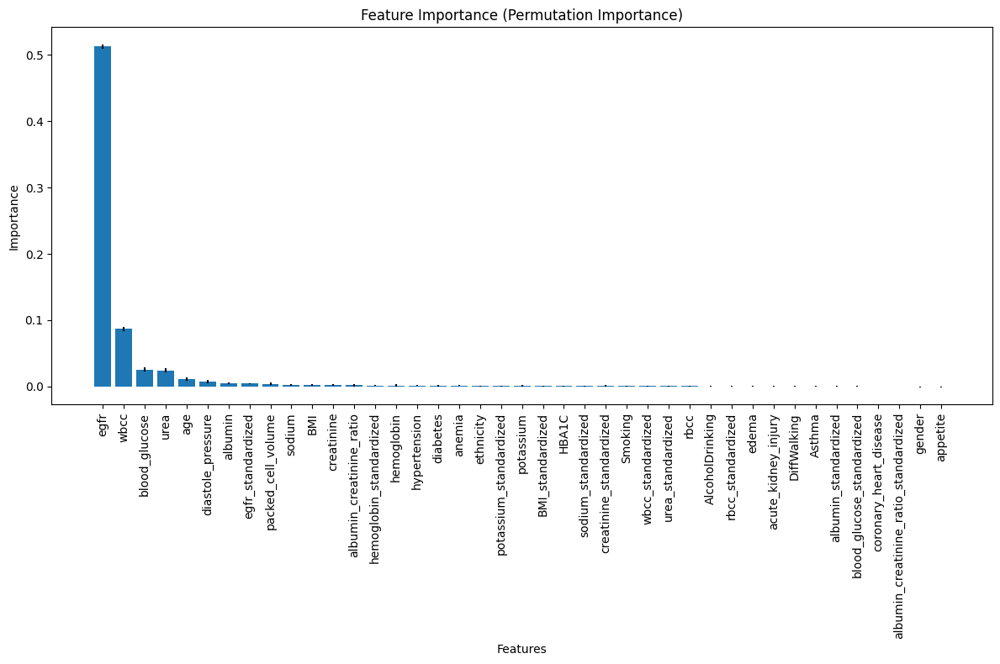

In [ ]:



result = permutation_importance(
    best_knn, X_val, y_val,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)


importances = result.importances_mean
std = result.importances_std
indices = np.argsort(importances)[::-1]


feature_names = X.columns
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances,
    'StdDev': std
}).sort_values('Importance', ascending=False)

print("Feature Importance Ranking:")
print(importance_df)


plt.figure(figsize=(12, 8))
plt.bar(range(X.shape[1]), importances[indices], yerr=std[indices], align='center')
plt.xticks(range(X.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance (Permutation Importance)')
plt.tight_layout()
plt.show()


importance_df.to_csv('feature_importance.csv', index=False)

In [ ]:

N = 10
top_features = importance_df['Feature'].head(N).tolist()


print(f"Selected {len(top_features)} features:")
print(top_features)


X_train_reduced = X_train[top_features]
X_val_reduced = X_val[top_features]
X_test_reduced = X_test[top_features]


with open('selected_features.txt', 'w') as f:
    for feature in top_features:
        f.write(f"{feature}\n")

Selected 10 features:
['egfr', 'wbcc', 'blood_glucose', 'urea', 'age', 'diastole_pressure', 'albumin', 'egfr_standardized', 'packed_cell_volume', 'sodium']


Validation Set Performance (Reduced Features):
Accuracy: 0.8180285600952003

Classification Report:
              precision    recall  f1-score   support

           1       0.90      0.92      0.91      2017
           2       0.80      0.78      0.79      2016
           3       0.83      0.64      0.72      2017
           4       0.70      0.86      0.78      2017
           5       0.88      0.89      0.89      2017

    accuracy                           0.82     10084
   macro avg       0.82      0.82      0.82     10084
weighted avg       0.82      0.82      0.82     10084


Comparison with Full Feature Model:
Full Feature Accuracy: 0.8010710035700119
Reduced Feature Accuracy: 0.8180285600952003


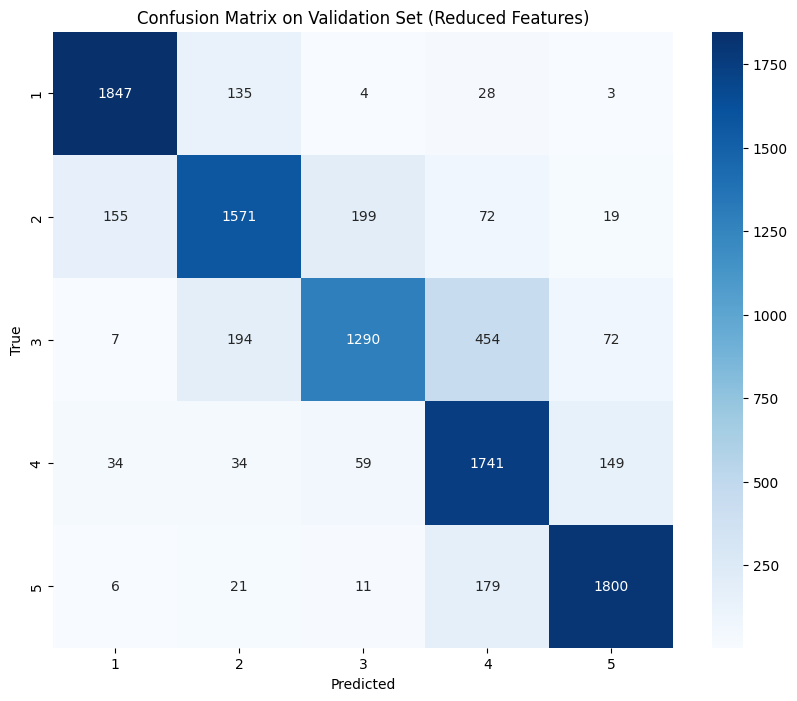


Test Set Performance (Reduced Features):
Accuracy: 0.8134668782229274

Classification Report:
              precision    recall  f1-score   support

           1       0.89      0.90      0.89      2017
           2       0.78      0.77      0.78      2017
           3       0.83      0.64      0.72      2017
           4       0.71      0.87      0.78      2017
           5       0.89      0.89      0.89      2016

    accuracy                           0.81     10084
   macro avg       0.82      0.81      0.81     10084
weighted avg       0.82      0.81      0.81     10084



['best_knn_reduced_features.pkl']

In [ ]:

best_knn_reduced = KNeighborsClassifier(**best_params)
best_knn_reduced.fit(X_train_reduced, y_train)


y_val_pred_reduced = best_knn_reduced.predict(X_val_reduced)
print("Validation Set Performance (Reduced Features):")
print("Accuracy:", accuracy_score(y_val, y_val_pred_reduced))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred_reduced))


print("\nComparison with Full Feature Model:")
print(f"Full Feature Accuracy: {accuracy_score(y_val, best_knn.predict(X_val))}")
print(f"Reduced Feature Accuracy: {accuracy_score(y_val, y_val_pred_reduced)}")


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_val, y_val_pred_reduced)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix on Validation Set (Reduced Features)')
plt.show()


y_test_pred_reduced = best_knn_reduced.predict(X_test_reduced)
print("\nTest Set Performance (Reduced Features):")
print("Accuracy:", accuracy_score(y_test, y_test_pred_reduced))
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred_reduced))


joblib.dump(best_knn_reduced, 'best_knn_reduced_features.pkl')

OVERFITTING ANALYSIS

Full Feature Model Analysis:
--------------------------------------------------
Full Feature KNN Performance:
Training Accuracy: 1.0000
Validation Accuracy: 0.8011
Test Accuracy: 0.7990


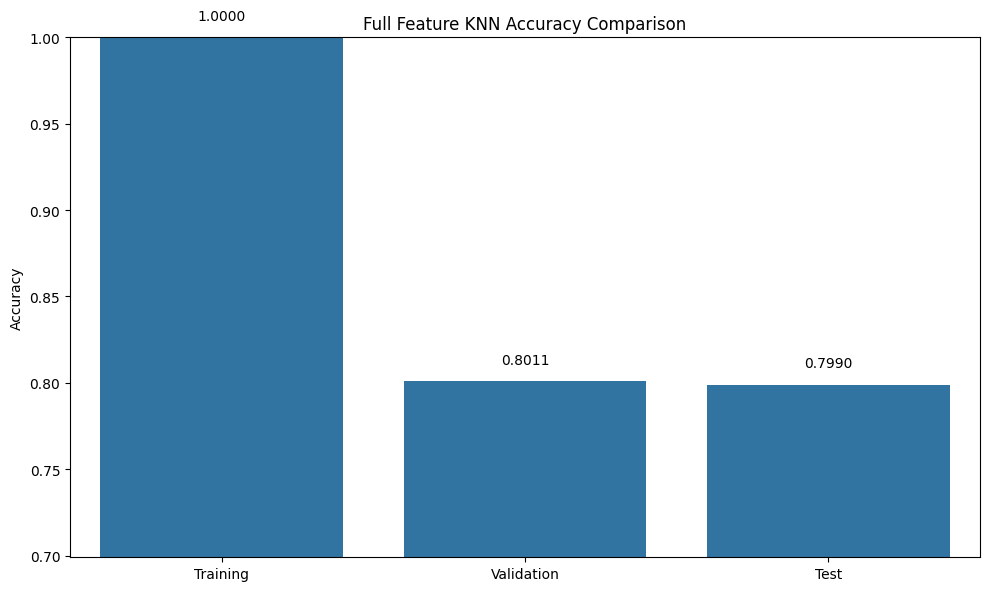


Reduced Feature Model Analysis:
--------------------------------------------------
Reduced Feature KNN Performance:
Training Accuracy: 1.0000
Validation Accuracy: 0.8180
Test Accuracy: 0.8135


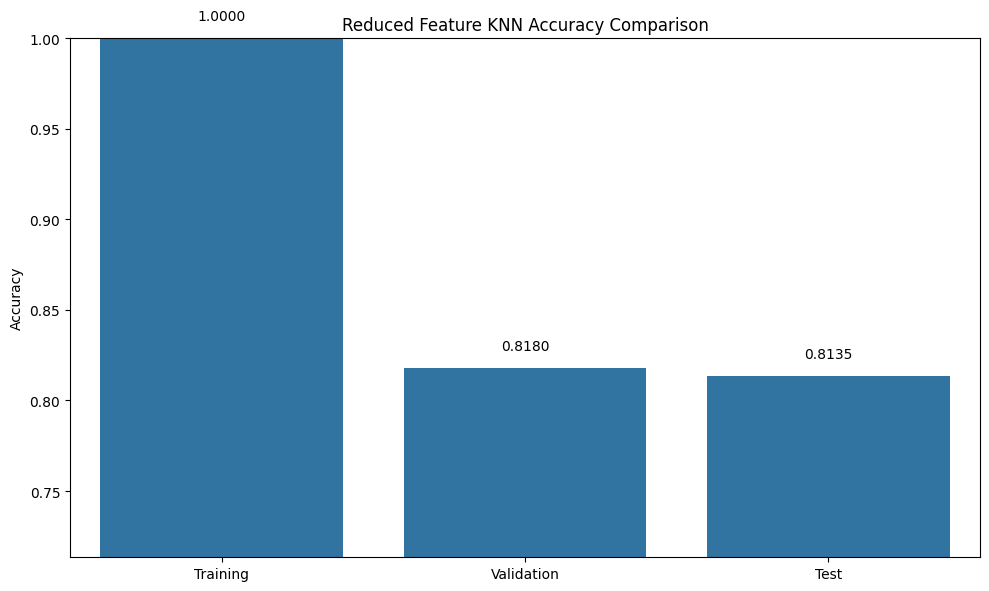


Plotting Learning Curves...


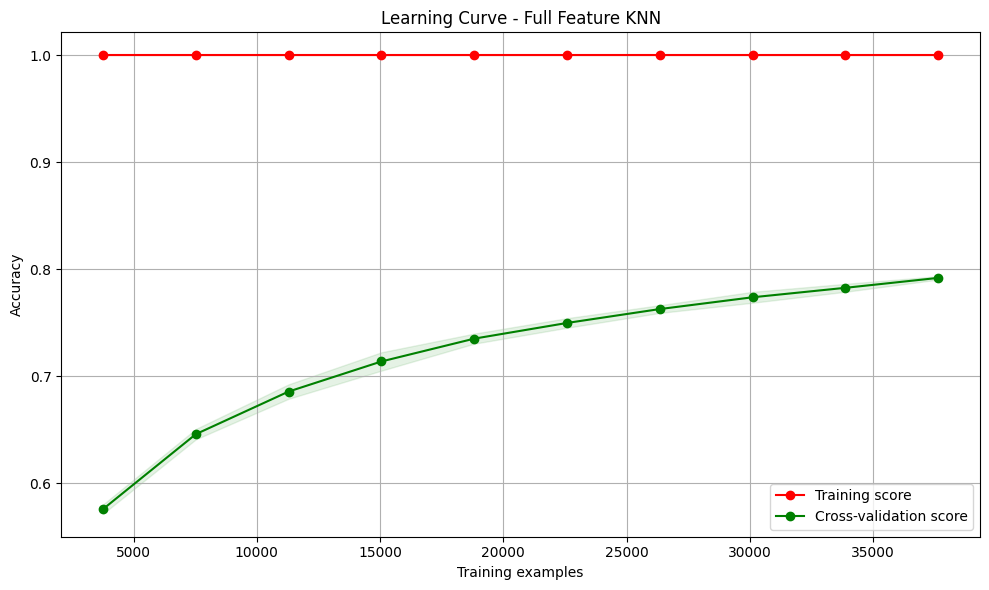

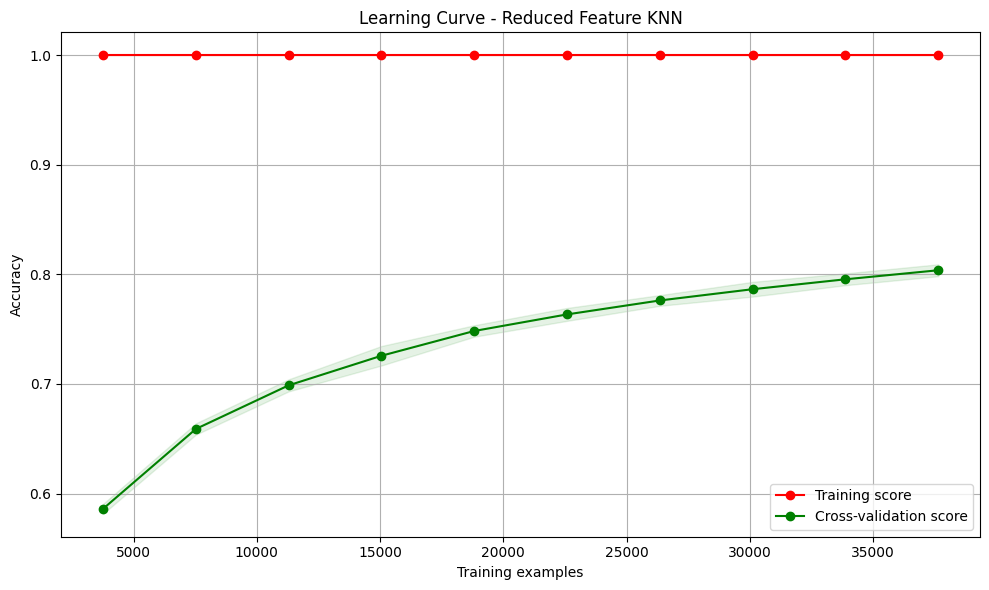


Plotting Validation Curves...


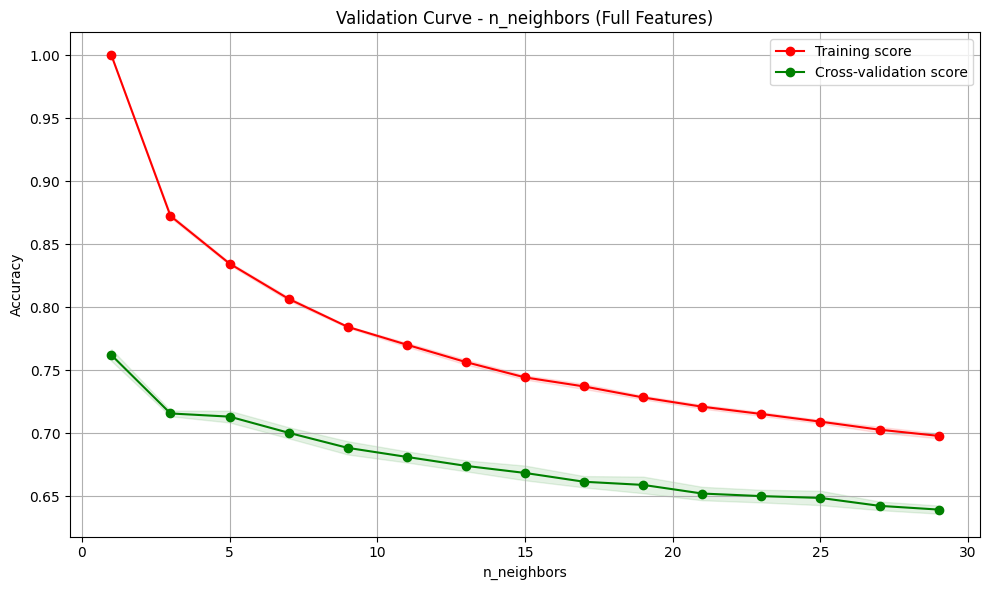

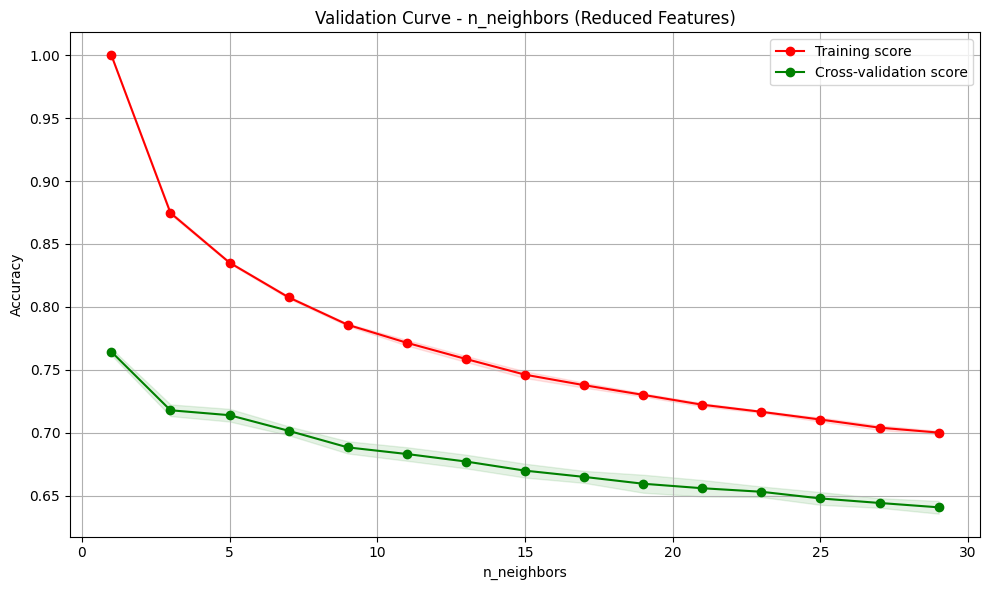


Plotting ROC Curves...


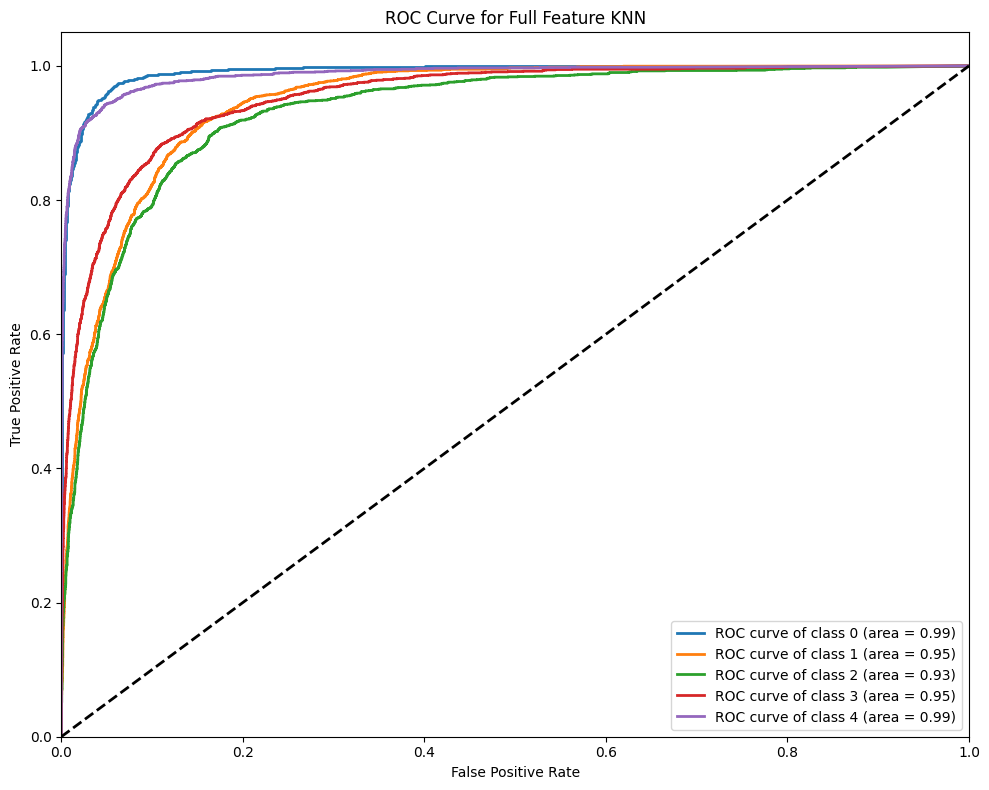

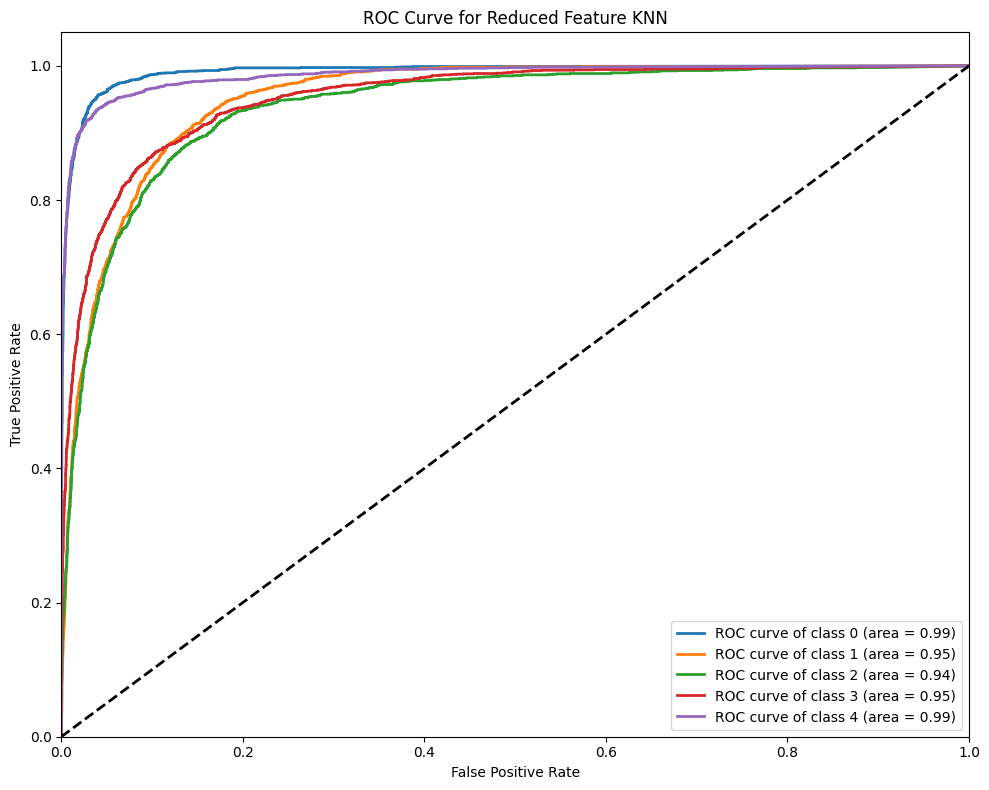


Plotting Precision-Recall Curves...


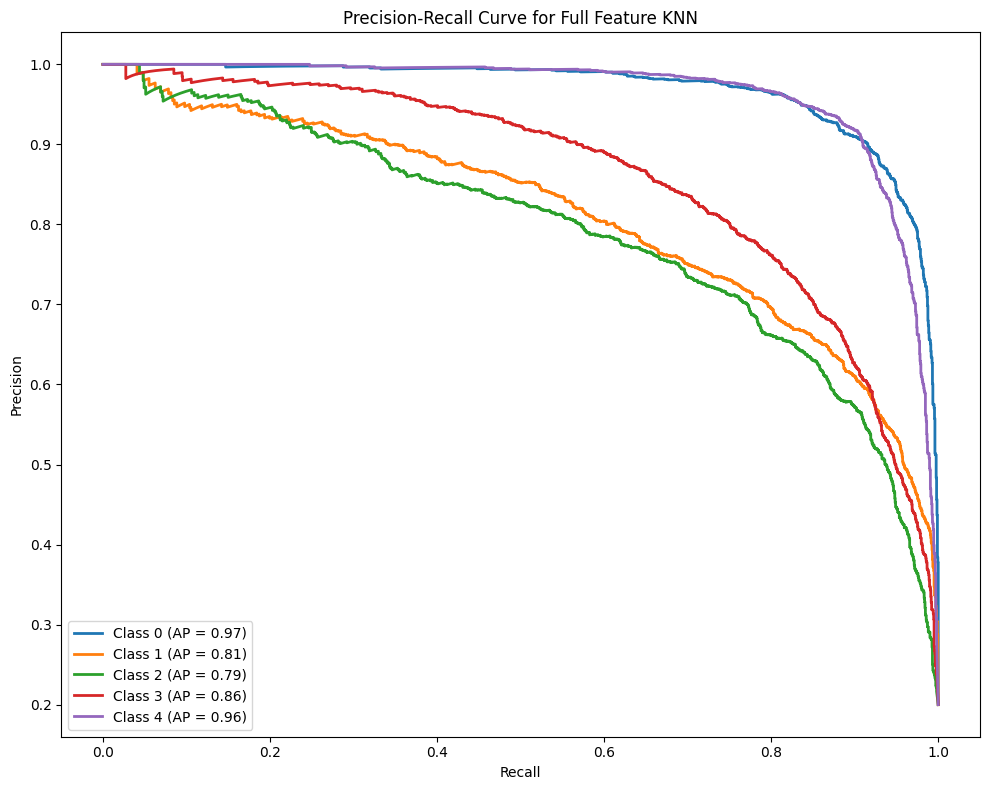

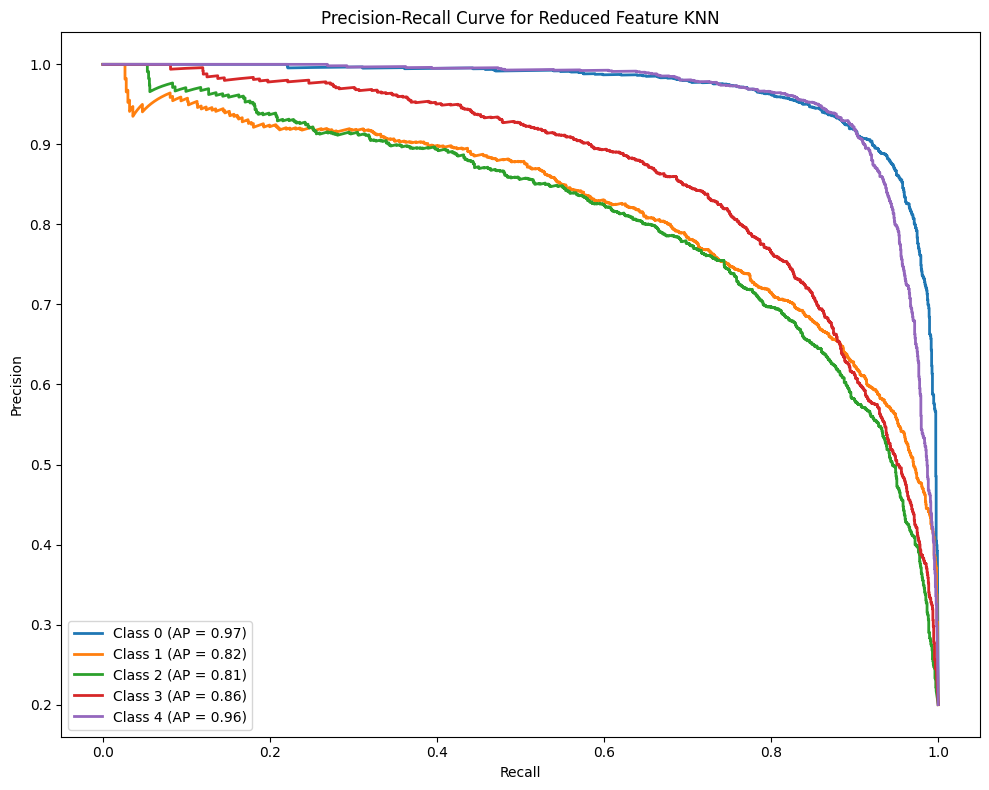


Model Comparison:
--------------------------------------------------
Full Feature Model - Train: 1.0000, Val: 0.8011, Test: 0.7990
Reduced Feature Model - Train: 1.0000, Val: 0.8180, Test: 0.8135

The Reduced Feature Model performs as well or better than the Full Feature Model.
This indicates that feature selection was successful in identifying the most important features.


In [ ]:



best_knn_full = joblib.load('best_knn_model.pkl')
best_knn_reduced = joblib.load('best_knn_reduced_features.pkl')


with open('selected_features.txt', 'r') as f:
     top_features = [line.strip() for line in f.readlines()]


def check_overfitting(model, X_train, X_val, X_test, y_train, y_val, y_test, model_name="Model"):
    """
    Check for overfitting by comparing performance on training, validation, and test sets
    """

    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)


    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)
    test_acc = accuracy_score(y_test, y_test_pred)

    print(f"{model_name} Performance:")
    print(f"Training Accuracy: {train_acc:.4f}")
    print(f"Validation Accuracy: {val_acc:.4f}")
    print(f"Test Accuracy: {test_acc:.4f}")


    if train_acc - val_acc > 0.05:
        print(f"WARNING: Possible overfitting detected. Training accuracy is {train_acc-val_acc:.4f} higher than validation accuracy.")
    else:
        print("No significant overfitting detected based on accuracy difference.")


    plt.figure(figsize=(10, 6))
    datasets = ['Training', 'Validation', 'Test']
    accuracies = [train_acc, val_acc, test_acc]

    sns.barplot(x=datasets, y=accuracies)
    plt.title(f'{model_name} Accuracy Comparison')
    plt.ylabel('Accuracy')
    plt.ylim(min(accuracies) - 0.1, 1.0)


    for i, acc in enumerate(accuracies):
        plt.text(i, acc + 0.01, f'{acc:.4f}', ha='center')

    plt.tight_layout()
    plt.show()

    return train_acc, val_acc, test_acc

def plot_learning_curve(estimator, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10),
                        title="Learning Curve"):
    """
    Plot learning curve to show how model performance changes with training set size
    """
    plt.figure(figsize=(10, 6))

    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, train_sizes=train_sizes, scoring='accuracy', n_jobs=-1)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)


    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

def plot_validation_curve(estimator, X, y, param_name, param_range, cv=5,
                         title="Validation Curve"):
    """
    Plot validation curve to show how model performance changes with hyperparameter values
    """
    plt.figure(figsize=(10, 6))

    train_scores, test_scores = validation_curve(
        estimator, X, y, param_name=param_name, param_range=param_range,
        cv=cv, scoring="accuracy", n_jobs=-1)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)


    plt.grid()
    plt.fill_between(param_range, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(param_range, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(param_range, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(param_range, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.title(title)
    plt.xlabel(param_name)
    plt.ylabel("Accuracy")
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

def plot_roc_curve(model, X, y, model_name="Model"):
    """
    Plot ROC curve for model evaluation
    """

    n_classes = len(np.unique(y))


    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X)
    else:

        if hasattr(model, "decision_function"):
            y_score = model.decision_function(X)
        else:
            print("Model doesn't support probability predictions or decision function")
            return


    fpr = dict()
    tpr = dict()
    roc_auc = dict()


    y_bin = pd.get_dummies(y).values

    plt.figure(figsize=(10, 8))

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

        plt.plot(fpr[i], tpr[i], lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

def plot_precision_recall_curve(model, X, y, model_name="Model"):
    """
    Plot precision-recall curve for model evaluation
    """

    n_classes = len(np.unique(y))


    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X)
    else:
        print("Model doesn't support probability predictions")
        return


    y_bin = pd.get_dummies(y).values


    precision = dict()
    recall = dict()
    avg_precision = dict()

    plt.figure(figsize=(10, 8))

    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], y_score[:, i])
        avg_precision[i] = average_precision_score(y_bin[:, i], y_score[:, i])

        plt.plot(recall[i], precision[i], lw=2,
                 label=f'Class {i} (AP = {avg_precision[i]:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve for {model_name}')
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

def run_overfitting_analysis(best_knn_full, best_knn_reduced, top_features,
                            X_train, X_val, X_test, y_train, y_val, y_test):
    """
    Run complete overfitting analysis for both models
    """
    print("=" * 50)
    print("OVERFITTING ANALYSIS")
    print("=" * 50)


    X_train_reduced = X_train[top_features]
    X_val_reduced = X_val[top_features]
    X_test_reduced = X_test[top_features]


    print("\nFull Feature Model Analysis:")
    print("-" * 50)
    train_acc_full, val_acc_full, test_acc_full = check_overfitting(
        best_knn_full, X_train, X_val, X_test, y_train, y_val, y_test,
        model_name="Full Feature KNN")


    print("\nReduced Feature Model Analysis:")
    print("-" * 50)
    train_acc_reduced, val_acc_reduced, test_acc_reduced = check_overfitting(
        best_knn_reduced, X_train_reduced, X_val_reduced, X_test_reduced,
        y_train, y_val, y_test, model_name="Reduced Feature KNN")


    print("\nPlotting Learning Curves...")
    plot_learning_curve(best_knn_full, X_train, y_train,
                       title="Learning Curve - Full Feature KNN")
    plot_learning_curve(best_knn_reduced, X_train_reduced, y_train,
                       title="Learning Curve - Reduced Feature KNN")


    print("\nPlotting Validation Curves...")
    n_neighbors_range = np.arange(1, 31, 2)
    plot_validation_curve(KNeighborsClassifier(), X_train, y_train,
                         "n_neighbors", n_neighbors_range,
                         title="Validation Curve - n_neighbors (Full Features)")
    plot_validation_curve(KNeighborsClassifier(), X_train_reduced, y_train,
                         "n_neighbors", n_neighbors_range,
                         title="Validation Curve - n_neighbors (Reduced Features)")


    print("\nPlotting ROC Curves...")
    plot_roc_curve(best_knn_full, X_val, y_val, model_name="Full Feature KNN")
    plot_roc_curve(best_knn_reduced, X_val_reduced, y_val, model_name="Reduced Feature KNN")


    print("\nPlotting Precision-Recall Curves...")
    plot_precision_recall_curve(best_knn_full, X_val, y_val, model_name="Full Feature KNN")
    plot_precision_recall_curve(best_knn_reduced, X_val_reduced, y_val, model_name="Reduced Feature KNN")


    print("\nModel Comparison:")
    print("-" * 50)
    print(f"Full Feature Model - Train: {train_acc_full:.4f}, Val: {val_acc_full:.4f}, Test: {test_acc_full:.4f}")
    print(f"Reduced Feature Model - Train: {train_acc_reduced:.4f}, Val: {val_acc_reduced:.4f}, Test: {test_acc_reduced:.4f}")


    if test_acc_reduced >= test_acc_full:
        print("\nThe Reduced Feature Model performs as well or better than the Full Feature Model.")
        print("This indicates that feature selection was successful in identifying the most important features.")
    else:
        print("\nThe Full Feature Model outperforms the Reduced Feature Model.")
        print(f"The performance difference is {test_acc_full - test_acc_reduced:.4f}.")
        print("Consider keeping more features or trying different feature selection methods.")


run_overfitting_analysis(best_knn_full, best_knn_reduced, top_features,
                         X_train, X_val, X_test, y_train, y_val, y_test)

# **Logistic Regression**

In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report


param_dist = {
    'C': np.logspace(-3, 3, 10),
    'solver': ['lbfgs', 'newton-cg', 'saga'],
    'max_iter': [100, 200, 300],
}


log_reg = LogisticRegression(multi_class='multinomial', penalty='l2')


random_search = RandomizedSearchCV(
    log_reg,
    param_distributions=param_dist,
    n_iter=50,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    verbose=1
)


y_train = y_train - min(y_train)
y_val = y_val - min(y_val)
y_test = y_test - min(y_test)


random_search.fit(X_train, y_train)


print("Best Parameters:", random_search.best_params_)
print("Best CV Score:", random_search.best_score_)


best_log_reg = random_search.best_estimator_
y_val_pred = best_log_reg.predict(X_val)

print("\nValidation Set Performance:")
print("Accuracy:", accuracy_score(y_val, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred))


best_params = random_search.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Best Parameters: {'solver': 'newton-cg', 'max_iter': 300, 'C': np.float64(0.001)}
Best CV Score: 0.8298020649579392

Validation Set Performance:
Accuracy: 0.8309202697342325

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      2017
           1       0.82      0.86      0.84      2016
           2       0.78      0.71      0.75      2017
           3       0.74      0.71      0.72      2017
           4       0.86      0.93      0.89      2017

    accuracy                           0.83     10084
   macro avg       0.83      0.83      0.83     10084
weighted avg       0.83      0.83      0.83     10084



/usr/local/lib/python3.11/dist-packages/sklearn/utils/optimize.py:319: ConvergenceWarning: newton-cg failed to converge at loss = 0.7089433584107884. Increase the number of iterations.
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Set Performance:
Accuracy: 0.8159460531535105

Classification Report:
              precision    recall  f1-score   support

           1       0.92      0.92      0.92      2017
           2       0.78      0.86      0.82      2016
           3       0.82      0.66      0.74      2017
           4       0.71      0.72      0.71      2017
           5       0.85      0.92      0.88      2017

    accuracy                           0.82     10084
   macro avg       0.82      0.82      0.81     10084
weighted avg       0.82      0.82      0.81     10084



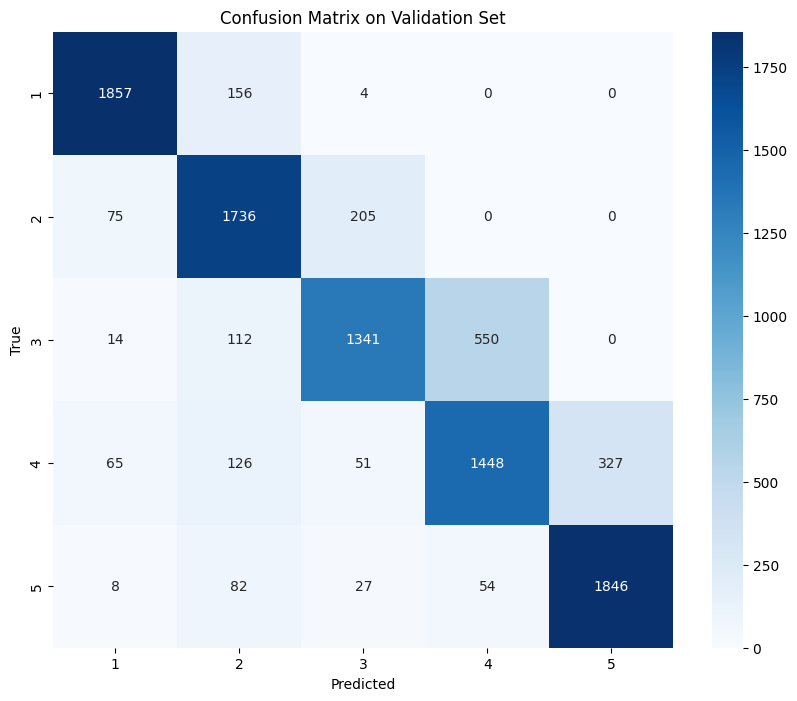

['best_log_reg_model.pkl']

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


best_log_reg = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    penalty='l2',
    C=best_params['C'],
    max_iter=best_params.get('max_iter', 500),
    random_state=42
)


best_log_reg.fit(X_train, y_train)


y_val_pred = best_log_reg.predict(X_val)
print("Validation Set Performance:")
print("Accuracy:", accuracy_score(y_val, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred))


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_val, y_val_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_val),
            yticklabels=np.unique(y_val))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix on Validation Set')
plt.show()


joblib.dump(best_log_reg, 'best_log_reg_model.pkl')


Feature Importance Ranking:
                                  Feature  Importance
7                                    egfr    0.121290
8                                  sodium    0.031717
4                       diastole_pressure    0.017330
0                                     age    0.011000
16                     packed_cell_volume    0.009441
3                                     BMI    0.008024
32                      egfr_standardized    0.003934
13                                  HBA1C    0.003473
6                              hemoglobin    0.003201
10                                   urea    0.002534
11                                albumin    0.002328
5                              creatinine    0.001998
28               albumin_creatinine_ratio    0.001623
14                                   rbcc    0.001152
9                               potassium    0.000954
12                          blood_glucose    0.000885
39                      wbcc_standardized    0.000787


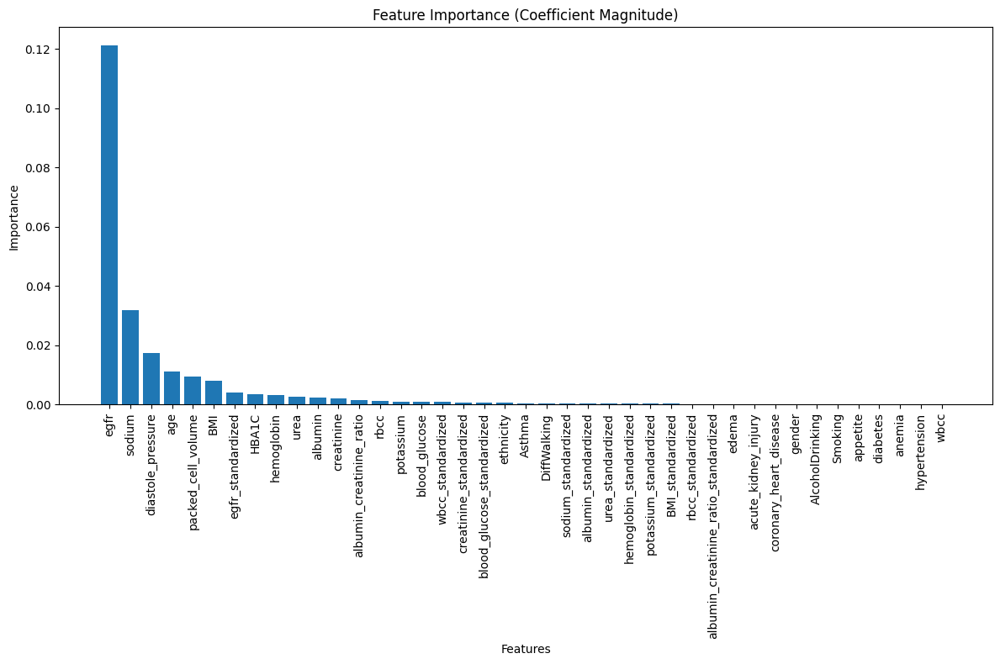

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


importances = np.abs(best_log_reg.coef_).mean(axis=0)  # Mean across classes (if multiclass)


feature_names = X_train.columns


importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values('Importance', ascending=False)


print("Feature Importance Ranking:")
print(importance_df)


plt.figure(figsize=(12, 8))
plt.bar(range(X_train.shape[1]), importance_df['Importance'], align='center')
plt.xticks(range(X_train.shape[1]), importance_df['Feature'], rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance (Coefficient Magnitude)')
plt.tight_layout()
plt.show()


importance_df.to_csv('feature_importance.csv', index=False)


In [ ]:
import pandas as pd


N = 10
top_features = importance_df['Feature'].head(N).tolist()


print(f"Selected {len(top_features)} features:")
print(top_features)


X_train_reduced = X_train[top_features]
X_val_reduced = X_val[top_features]
X_test_reduced = X_test[top_features]


with open('selected_features.txt', 'w') as f:
    for feature in top_features:
        f.write(f"{feature}\n")


Selected 10 features:
['egfr', 'sodium', 'diastole_pressure', 'age', 'packed_cell_volume', 'BMI', 'egfr_standardized', 'HBA1C', 'hemoglobin', 'urea']


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Validation Set Performance (Reduced Features):
Accuracy: 0.82130107100357

Classification Report:
              precision    recall  f1-score   support

           1       0.93      0.93      0.93      2017
           2       0.79      0.84      0.81      2016
           3       0.78      0.70      0.74      2017
           4       0.74      0.71      0.72      2017
           5       0.86      0.93      0.89      2017

    accuracy                           0.82     10084
   macro avg       0.82      0.82      0.82     10084
weighted avg       0.82      0.82      0.82     10084


Comparison with Full Feature Model:
Full Feature Accuracy: 0.8159460531535105
Reduced Feature Accuracy: 0.82130107100357


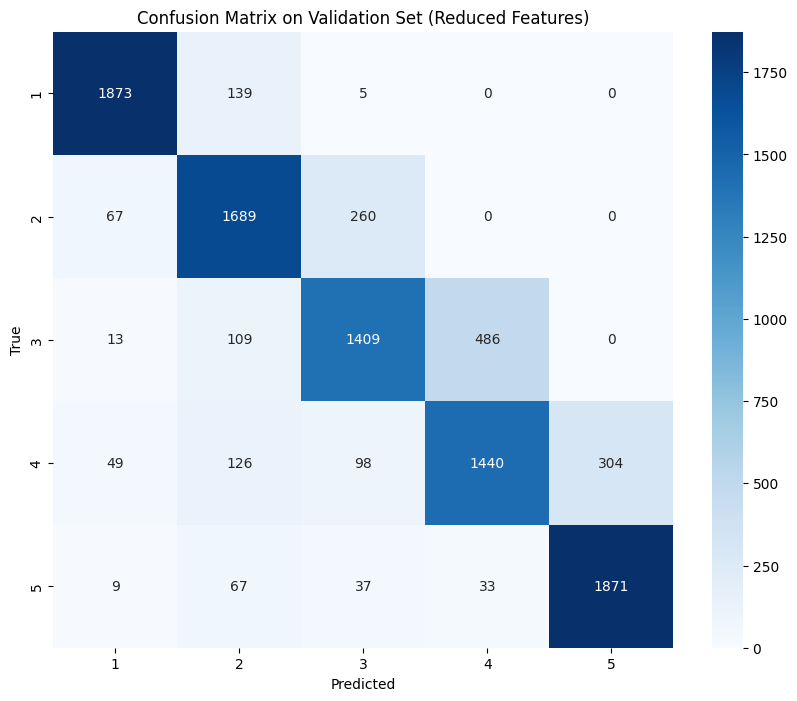


Test Set Performance (Reduced Features):
Accuracy: 0.8136652122173741

Classification Report:
              precision    recall  f1-score   support

           1       0.92      0.92      0.92      2017
           2       0.79      0.85      0.82      2017
           3       0.78      0.69      0.73      2017
           4       0.71      0.71      0.71      2017
           5       0.87      0.90      0.89      2016

    accuracy                           0.81     10084
   macro avg       0.81      0.81      0.81     10084
weighted avg       0.81      0.81      0.81     10084



['best_log_reg_reduced_features.pkl']

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


best_params = {'C': 1.0, 'solver': 'lbfgs', 'multi_class': 'multinomial', 'penalty': 'l2'}


best_log_reg_reduced = LogisticRegression(**best_params, max_iter=500)
best_log_reg_reduced.fit(X_train_reduced, y_train)


y_val_pred_reduced = best_log_reg_reduced.predict(X_val_reduced)
print("Validation Set Performance (Reduced Features):")
print("Accuracy:", accuracy_score(y_val, y_val_pred_reduced))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred_reduced))


print("\nComparison with Full Feature Model:")
print(f"Full Feature Accuracy: {accuracy_score(y_val, best_log_reg.predict(X_val))}")
print(f"Reduced Feature Accuracy: {accuracy_score(y_val, y_val_pred_reduced)}")


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_val, y_val_pred_reduced)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_val),
            yticklabels=np.unique(y_val))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix on Validation Set (Reduced Features)')
plt.show()


y_test_pred_reduced = best_log_reg_reduced.predict(X_test_reduced)
print("\nTest Set Performance (Reduced Features):")
print("Accuracy:", accuracy_score(y_test, y_test_pred_reduced))
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred_reduced))


joblib.dump(best_log_reg_reduced, 'best_log_reg_reduced_features.pkl')


Full Feature Model Performance:
Training Accuracy: 0.8130
Validation Accuracy: 0.8159
Test Accuracy: 0.8079
No significant overfitting detected based on accuracy difference.


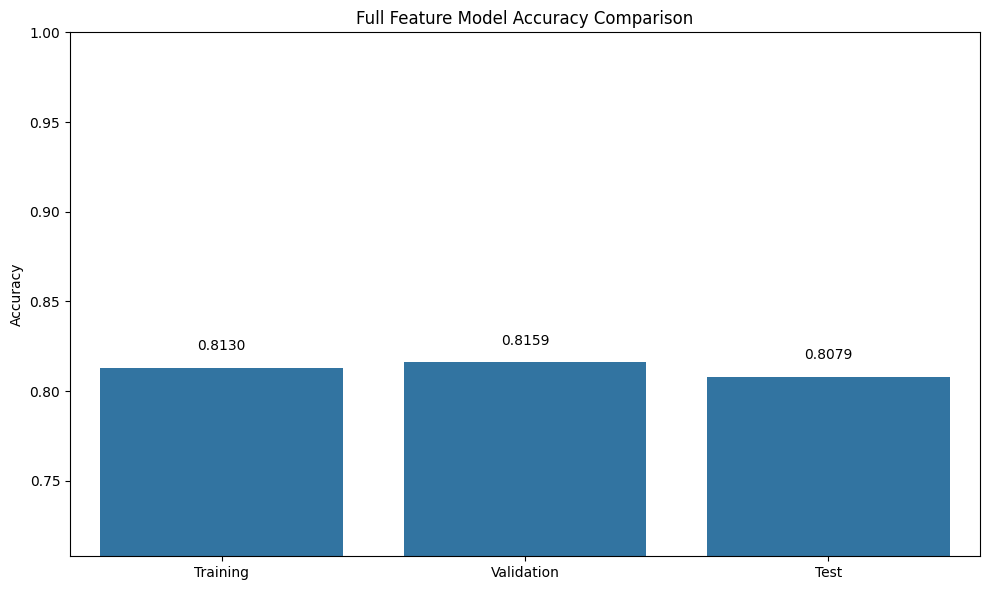

Reduced Feature Model Performance:
Training Accuracy: 0.8184
Validation Accuracy: 0.8213
Test Accuracy: 0.8137
No significant overfitting detected based on accuracy difference.


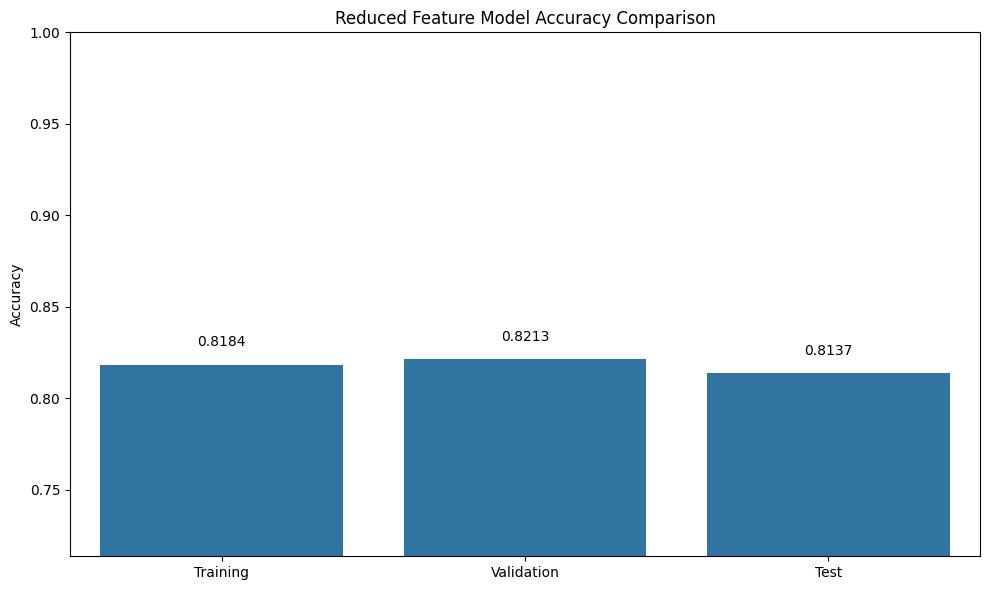

In [ ]:

best_log_reg_full = joblib.load('best_log_reg_model.pkl')
best_log_reg_reduced = joblib.load('best_log_reg_reduced_features.pkl')


with open('selected_features.txt', 'r') as f:
    top_features = [line.strip() for line in f.readlines()]

check_overfitting(best_log_reg_full, X_train, X_val, X_test, y_train, y_val, y_test, model_name="Full Feature Model")
check_overfitting(best_log_reg_reduced, X_train_reduced, X_val_reduced, X_test_reduced, y_train, y_val, y_test, model_name="Reduced Feature Model")

def check_overfitting(model, X_train, X_val, X_test, y_train, y_val, y_test, model_name="Model"):
    """
    Check for overfitting by comparing performance on training, validation, and test sets.
    """

    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)


    train_acc = accuracy_score(y_train, y_train_pred)
    val_acc = accuracy_score(y_val, y_val_pred)
    test_acc = accuracy_score(y_test, y_test_pred)

    print(f"{model_name} Performance:")
    print(f"Training Accuracy: {train_acc:.4f}")
    print(f"Validation Accuracy: {val_acc:.4f}")
    print(f"Test Accuracy: {test_acc:.4f}")


    if train_acc - val_acc > 0.05:
        print(f"WARNING: Possible overfitting detected. Training accuracy is {train_acc-val_acc:.4f} higher than validation accuracy.")
    else:
        print("No significant overfitting detected based on accuracy difference.")


    plt.figure(figsize=(10, 6))
    datasets = ['Training', 'Validation', 'Test']
    accuracies = [train_acc, val_acc, test_acc]

    sns.barplot(x=datasets, y=accuracies)
    plt.title(f'{model_name} Accuracy Comparison')
    plt.ylabel('Accuracy')
    plt.ylim(min(accuracies) - 0.1, 1.0)

    for i, acc in enumerate(accuracies):
        plt.text(i, acc + 0.01, f'{acc:.4f}', ha='center')

    plt.tight_layout()
    plt.show()

    return train_acc, val_acc, test_acc



# **Random Forest**

In [ ]:

param_dist_refined = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 15, 20],
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [2, 4, 6],
    'bootstrap': [True],
    'max_features': ['sqrt', 'log2'],
}


In [ ]:

from sklearn.ensemble import RandomForestClassifier


rf = RandomForestClassifier(random_state=42)

In [ ]:
import joblib
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV


random_search = RandomizedSearchCV(
    estimator=rf, param_distributions=param_dist_refined,
    n_iter=20, cv=5, scoring='accuracy', verbose=2,
    n_jobs=-1, random_state=42
)


random_search.fit(X_train, y_train)


print(" Best Hyperparameters from RandomizedSearchCV:", random_search.best_params_)


best_rf = RandomForestClassifier(**random_search.best_params_, random_state=42)
best_rf.fit(X_train, y_train)


joblib.dump(best_rf, "random_forest_model.pkl")

print(" Model trained and saved as 'random_forest_model.pkl'")


y_pred_test = best_rf.predict(X_test)


print("Final Accuracy on Test Set:", accuracy_score(y_test, y_pred_test))
print("Classification Report on Test Set:\n", classification_report(y_test, y_pred_test))

Fitting 5 folds for each of 20 candidates, totalling 100 fits
✅ Best Hyperparameters from RandomizedSearchCV: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': True}
✅ Model trained and saved as 'random_forest_model.pkl'
Final Accuracy on Test Set: 0.9821499404998016
Classification Report on Test Set:
               precision    recall  f1-score   support

           1       0.99      0.99      0.99      2017
           2       0.97      0.99      0.98      2017
           3       0.98      0.99      0.98      2017
           4       0.97      0.98      0.98      2017
           5       1.00      0.97      0.98      2016

    accuracy                           0.98     10084
   macro avg       0.98      0.98      0.98     10084
weighted avg       0.98      0.98      0.98     10084



In [ ]:

feature_importances = best_rf.feature_importances_


feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
})


feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)


print("Top Important Features:\n", feature_importance_df.head(20))


Top Important Features:
                                   Feature  Importance
32                      egfr_standardized    0.390156
7                                    egfr    0.384788
30                creatinine_standardized    0.011728
5                              creatinine    0.011524
29                       BMI_standardized    0.011101
3                                     BMI    0.010883
13                                  HBA1C    0.010121
36                   albumin_standardized    0.006790
11                                albumin    0.006738
17                                 anemia    0.006715
40  albumin_creatinine_ratio_standardized    0.006675
18                               appetite    0.006489
35                      urea_standardized    0.006328
28               albumin_creatinine_ratio    0.006086
10                                   urea    0.006004
0                                     age    0.005651
21                 coronary_heart_disease    0.005594
2  

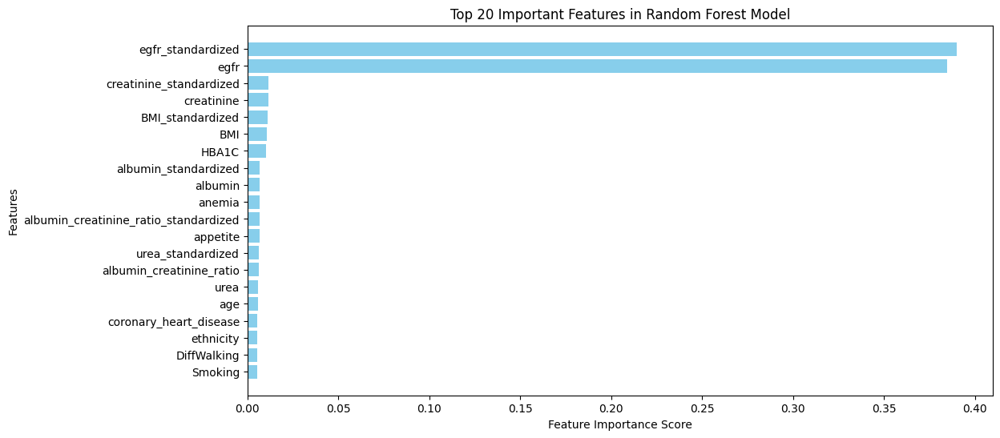

In [ ]:

plt.figure(figsize=(12, 6))
plt.barh(feature_importance_df['Feature'][:20], feature_importance_df['Importance'][:20], color='skyblue')
plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Top 20 Important Features in Random Forest Model")
plt.gca().invert_yaxis()  # Invert y-axis for better visualization
plt.show()


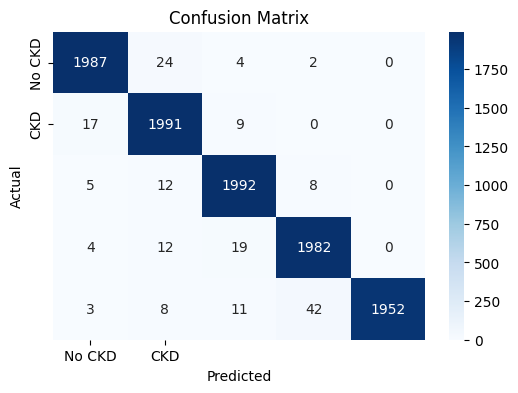

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns


cm = confusion_matrix(y_test, best_rf.predict(X_test))


plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No CKD", "CKD"], yticklabels=["No CKD", "CKD"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

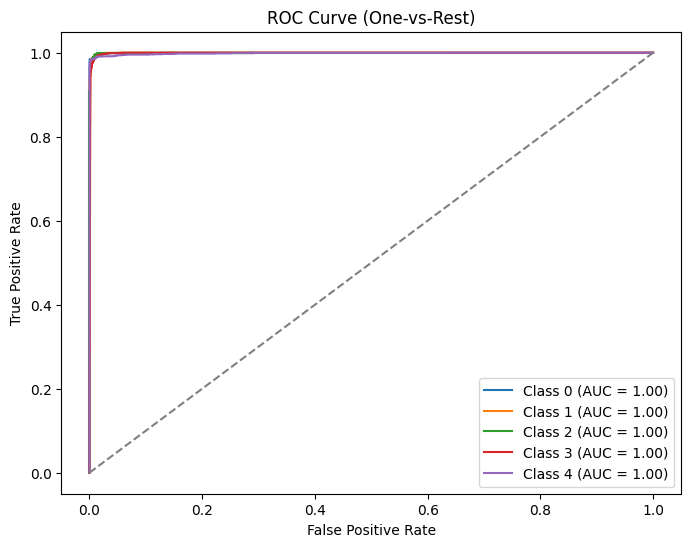

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


y_probs = best_rf.predict_proba(X_test)

y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))


fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = y_test_binarized.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (One-vs-Rest)")
plt.legend()
plt.show()

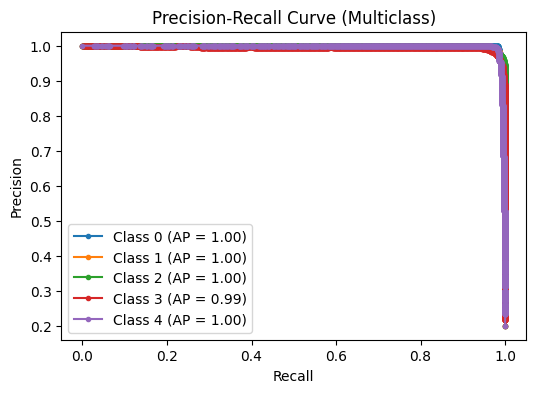

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize


y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))


y_probs = best_rf.predict_proba(X_test)


precision = dict()
recall = dict()
average_precision = dict()
for i in range(y_test_binarized.shape[1]):
    precision[i], recall[i], _ = precision_recall_curve(y_test_binarized[:, i], y_probs[:, i])
    average_precision[i] = average_precision_score(y_test_binarized[:, i], y_probs[:, i])

plt.figure(figsize=(6, 4))
for i in range(y_test_binarized.shape[1]):
    plt.plot(recall[i], precision[i], marker=".", label=f"Class {i} (AP = {average_precision[i]:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (Multiclass)")
plt.legend()
plt.show()

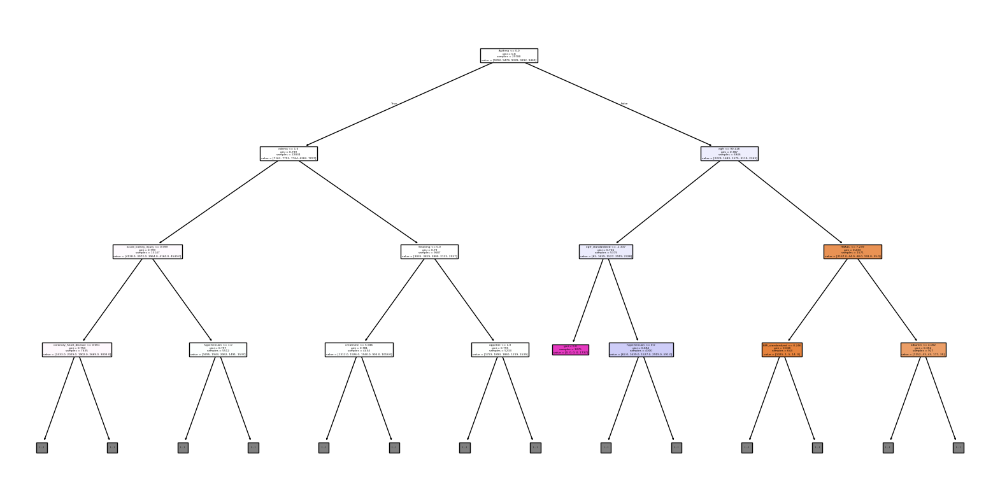

In [ ]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20,10))
plot_tree(best_rf.estimators_[0], feature_names=X_train.columns, filled=True, max_depth=3)
plt.show()


In [ ]:
def plot_learning_curve(estimator, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10)):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=cv, train_sizes=train_sizes, scoring="accuracy", n_jobs=-1
    )


    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)


    plt.figure(figsize=(8, 5))
    plt.plot(train_sizes, train_mean, "o-", color="blue", label="Training Score")
    plt.plot(train_sizes, val_mean, "o-", color="green", label="Validation Score")


    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color="blue")
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1, color="green")

    plt.xlabel("Training Set Size")
    plt.ylabel("Accuracy")
    plt.title("Learning Curve for Random Forest")
    plt.legend()
    plt.show()

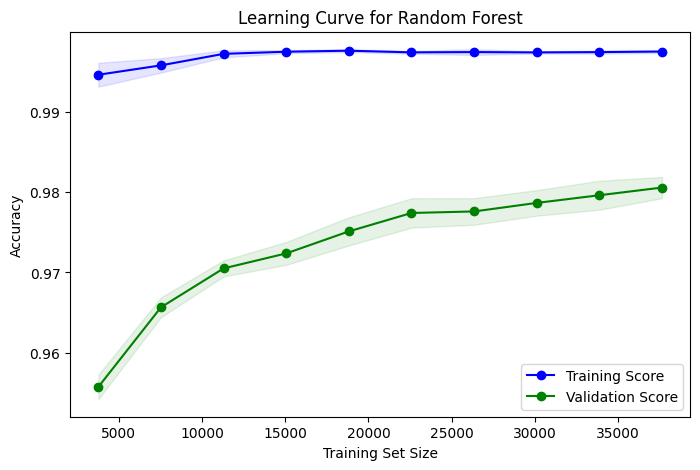

In [ ]:

best_rf = RandomForestClassifier(**random_search.best_params_, random_state=42)

plot_learning_curve(best_rf, X_train, y_train, cv=5)


PermutationExplainer explainer: 10085it [1:38:44,  1.70it/s]
<ipython-input-25-ecb558a13eaa>:13: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test)


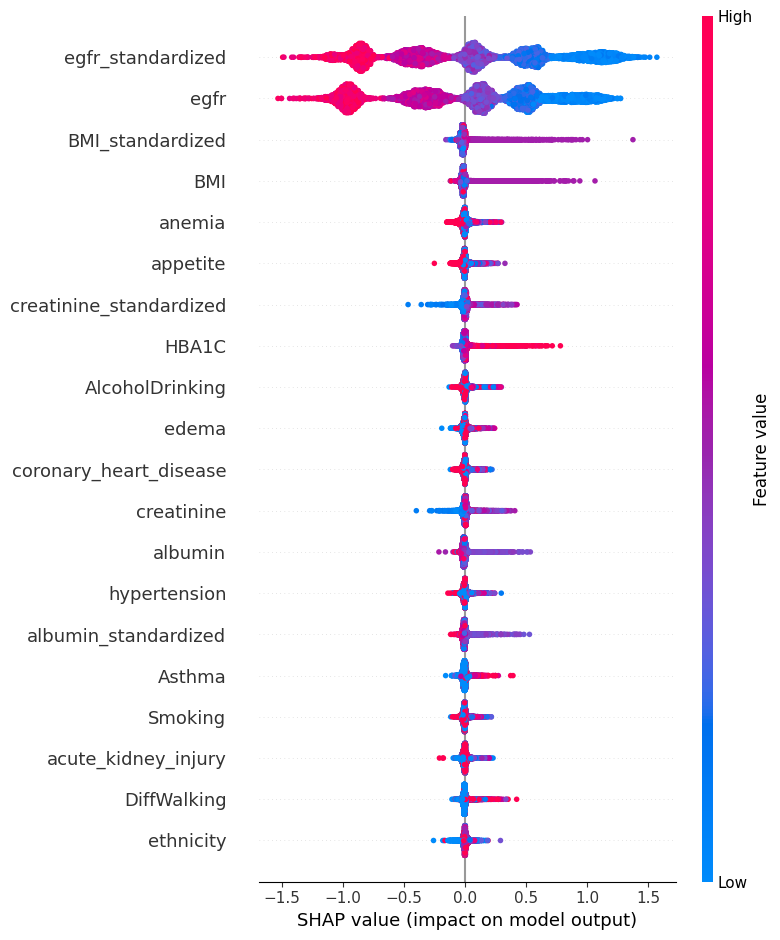

In [ ]:
!pip install shap
import shap


best_rf.fit(X_train, y_train)

explainer = shap.Explainer(best_rf.predict, X_test, check_additivity=False)
shap_values = explainer(X_test)


shap.summary_plot(shap_values, X_test)

# **Deep Neural Network**

Unique class values in the dataset: [1 2 3 4 5]
Total number of classes: 5
Class mapping: {np.int64(1): 0, np.int64(2): 1, np.int64(3): 2, np.int64(4): 3, np.int64(5): 4}
Training the model...
Epoch 10/50, Train Loss: 0.3426, Train Acc: 0.8867, Val Loss: 0.2594, Val Acc: 0.9268
Epoch 20/50, Train Loss: 0.2642, Train Acc: 0.9051, Val Loss: 0.2033, Val Acc: 0.9335
Epoch 30/50, Train Loss: 0.2469, Train Acc: 0.9102, Val Loss: 0.2146, Val Acc: 0.9183
Epoch 40/50, Train Loss: 0.2250, Train Acc: 0.9176, Val Loss: 0.1951, Val Acc: 0.9318
Epoch 50/50, Train Loss: 0.2124, Train Acc: 0.9227, Val Loss: 0.1747, Val Acc: 0.9382


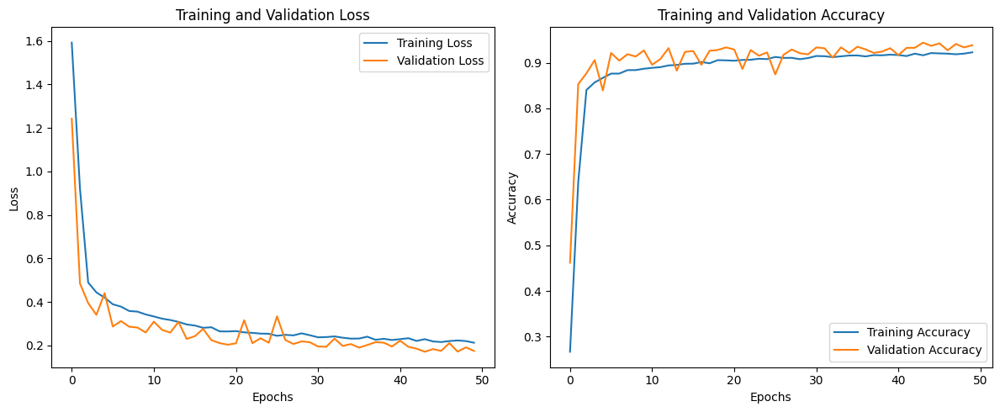

Evaluating the model on test set...


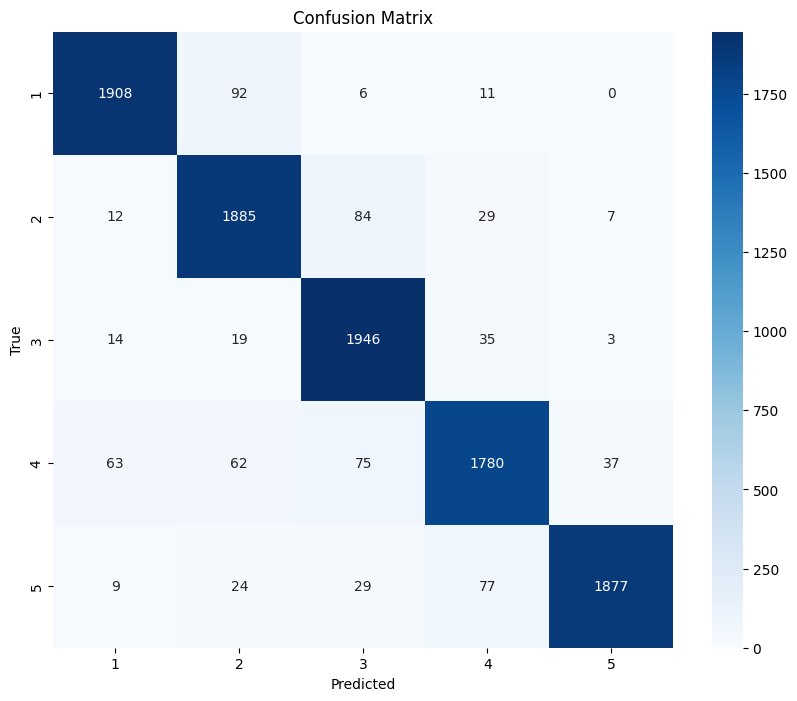

Classification Report:
              precision    recall  f1-score   support

     Stage 1       0.95      0.95      0.95      2017
     Stage 2       0.91      0.93      0.92      2017
     Stage 3       0.91      0.96      0.94      2017
     Stage 4       0.92      0.88      0.90      2017
     Stage 5       0.98      0.93      0.95      2016

    accuracy                           0.93     10084
   macro avg       0.93      0.93      0.93     10084
weighted avg       0.93      0.93      0.93     10084

Test Accuracy: 0.9318


In [ ]:


X_train_np = X_train.values
X_val_np = X_val.values
X_test_np = X_test.values
y_train_np = y_train.values
y_val_np = y_val.values
y_test_np = y_test.values


all_targets = np.concatenate([y_train_np, y_val_np, y_test_np])
unique_classes = np.unique(all_targets)
print(f"Unique class values in the dataset: {unique_classes}")
num_classes = len(unique_classes)
print(f"Total number of classes: {num_classes}")


class_mapping = {original: idx for idx, original in enumerate(sorted(unique_classes))}
print(f"Class mapping: {class_mapping}")

y_train_mapped = np.array([class_mapping[y] for y in y_train_np])
y_val_mapped = np.array([class_mapping[y] for y in y_val_np])
y_test_mapped = np.array([class_mapping[y] for y in y_test_np])


X_train_tensor = torch.FloatTensor(X_train_np)
y_train_tensor = torch.LongTensor(y_train_mapped)
X_val_tensor = torch.FloatTensor(X_val_np)
y_val_tensor = torch.LongTensor(y_val_mapped)
X_test_tensor = torch.FloatTensor(X_test_np)
y_test_tensor = torch.LongTensor(y_test_mapped)


class CKDDataset(Dataset):
    def __init__(self, features, targets):
        self.features = features
        self.targets = targets

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.targets[idx]

train_dataset = CKDDataset(X_train_tensor, y_train_tensor)
val_dataset = CKDDataset(X_val_tensor, y_val_tensor)
test_dataset = CKDDataset(X_test_tensor, y_test_tensor)


batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


class CKDModel(nn.Module):
    def __init__(self, input_size, hidden_sizes, num_classes):
        super(CKDModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_sizes[0])
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
        self.relu2 = nn.ReLU()
        self.fc3 = nn.Linear(hidden_sizes[1], hidden_sizes[2])
        self.relu3 = nn.ReLU()
        self.fc4 = nn.Linear(hidden_sizes[2], hidden_sizes[3])
        self.relu4 = nn.ReLU()
        self.fc5 = nn.Linear(hidden_sizes[3], num_classes)


    def forward(self, x):
        x = self.relu1(self.fc1(x))
        x = self.relu2(self.fc2(x))
        x = self.relu3(self.fc3(x))
        x = self.relu4(self.fc4(x))
        x = self.fc5(x)
        return x


input_size = X_train_np.shape[1]

hidden_sizes = [128, 64, 32, 16]


model = CKDModel(input_size, hidden_sizes, num_classes)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50):
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []

    for epoch in range(num_epochs):

        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = correct / total
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)


        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / len(val_loader.dataset)
        epoch_acc = correct / total
        val_losses.append(epoch_loss)
        val_accs.append(epoch_acc)

        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accs[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accs[-1]:.4f}')

    return train_losses, val_losses, train_accs, val_accs


print("Training the model...")
train_losses, val_losses, train_accs, val_accs = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=50)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Training Accuracy')
plt.plot(val_accs, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)


print("Evaluating the model on test set...")
y_pred, y_true = evaluate_model(model, test_loader)


cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))

reverse_mapping = {idx: original for original, idx in class_mapping.items()}
class_labels = [reverse_mapping[i] for i in range(num_classes)]
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[f'Stage {reverse_mapping[i]}' for i in range(num_classes)]))

y_pred_original = np.array([reverse_mapping[y] for y in y_pred])
y_true_original = np.array([reverse_mapping[y] for y in y_true])


test_accuracy = np.mean(y_pred == y_true)
print(f"Test Accuracy: {test_accuracy:.4f}")

Is the model overfitting? False
Analysis: {'final_train_loss': 0.21238421351221037, 'final_val_loss': 0.1747207720473982, 'final_train_acc': 0.9226895042182884, 'final_val_acc': 0.9382189607298691, 'final_loss_gap': 0.03766344146481218, 'final_acc_gap': -0.015529456511580664, 'val_loss_increasing': False, 'significant_acc_gap': False, 'high_train_low_val_acc': False}


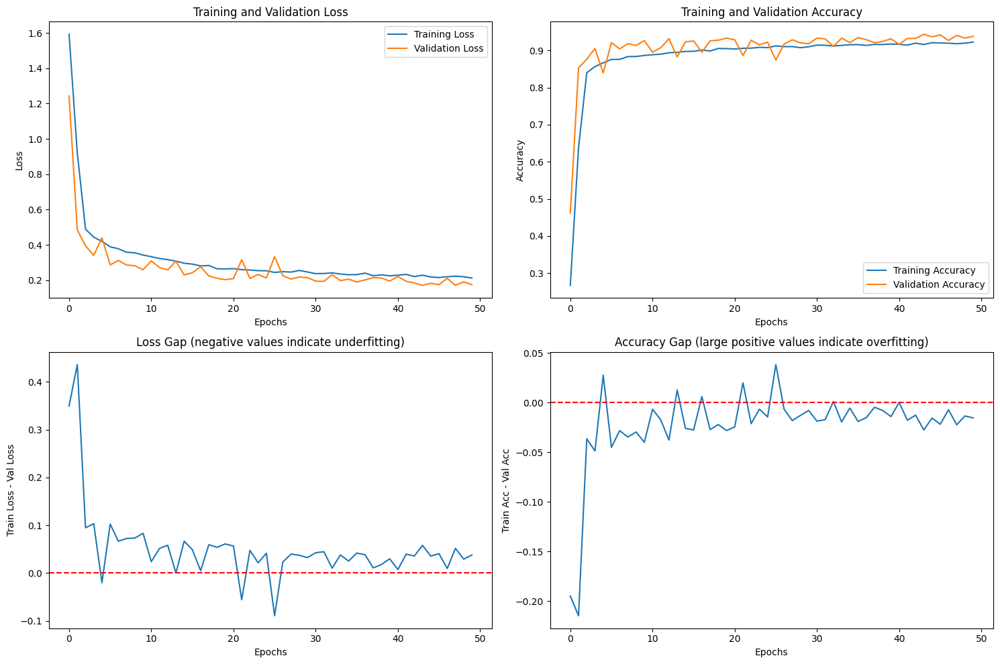

In [ ]:


def check_overfitting(train_losses, val_losses, train_accs, val_accs):
    """
    Analyze training and validation metrics to detect overfitting

    """

    loss_gaps = [train - val for train, val in zip(train_losses, val_losses)]
    acc_gaps = [train - val for train, val in zip(train_accs, val_accs)]


    val_loss_increasing = False
    for i in range(5, len(val_losses)):

        if all(val_losses[i-j] < val_losses[i-j+1] for j in range(1, 5)) and train_losses[i] < train_losses[i-5]:
            val_loss_increasing = True
            break


    significant_acc_gap = any(gap > 0.1 for gap in acc_gaps[-5:])


    high_train_low_val_acc = train_accs[-1] > 0.95 and val_accs[-1] < 0.85


    is_overfitting = val_loss_increasing or significant_acc_gap or high_train_low_val_acc


    analysis = {
        "final_train_loss": train_losses[-1],
        "final_val_loss": val_losses[-1],
        "final_train_acc": train_accs[-1],
        "final_val_acc": val_accs[-1],
        "final_loss_gap": loss_gaps[-1],
        "final_acc_gap": acc_gaps[-1],
        "val_loss_increasing": val_loss_increasing,
        "significant_acc_gap": significant_acc_gap,
        "high_train_low_val_acc": high_train_low_val_acc
    }

    return is_overfitting, analysis


def visualize_overfitting(train_losses, val_losses, train_accs, val_accs):
    """
    Create detailed visualizations to analyze overfitting
    """
    plt.figure(figsize=(15, 10))


    plt.subplot(2, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()


    plt.subplot(2, 2, 2)
    plt.plot(train_accs, label='Training Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()


    plt.subplot(2, 2, 3)
    loss_gaps = [train - val for train, val in zip(train_losses, val_losses)]
    plt.plot(loss_gaps)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss - Val Loss')
    plt.title('Loss Gap (negative values indicate underfitting)')


    plt.subplot(2, 2, 4)
    acc_gaps = [train - val for train, val in zip(train_accs, val_accs)]
    plt.plot(acc_gaps)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Train Acc - Val Acc')
    plt.title('Accuracy Gap (large positive values indicate overfitting)')

    plt.tight_layout()
    plt.show()


class RegularizedCKDModel(nn.Module):
    def __init__(self, input_size, hidden_sizes, num_classes, dropout_rate=0.3):
        super(RegularizedCKDModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_sizes[0])
        self.bn1 = nn.BatchNorm1d(hidden_sizes[0])
        self.dropout1 = nn.Dropout(dropout_rate)
        self.relu1 = nn.ReLU()

        self.fc2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
        self.bn2 = nn.BatchNorm1d(hidden_sizes[1])
        self.dropout2 = nn.Dropout(dropout_rate)
        self.relu2 = nn.ReLU()

        self.fc3 = nn.Linear(hidden_sizes[1], hidden_sizes[2])
        self.bn3 = nn.BatchNorm1d(hidden_sizes[2])
        self.dropout3 = nn.Dropout(dropout_rate)
        self.relu3 = nn.ReLU()

        self.fc4 = nn.Linear(hidden_sizes[2], hidden_sizes[3])
        self.bn4 = nn.BatchNorm1d(hidden_sizes[3])
        self.dropout4 = nn.Dropout(dropout_rate)
        self.relu4 = nn.ReLU()

        self.fc5 = nn.Linear(hidden_sizes[3], num_classes)

    def forward(self, x):
        x = self.relu1(self.bn1(self.fc1(x)))
        x = self.dropout1(x)

        x = self.relu2(self.bn2(self.fc2(x)))
        x = self.dropout2(x)

        x = self.relu3(self.bn3(self.fc3(x)))
        x = self.dropout3(x)

        x = self.relu4(self.bn4(self.fc4(x)))
        x = self.dropout4(x)

        x = self.fc5(x)
        return x

def train_with_early_stopping(model, train_loader, val_loader, criterion, optimizer,
                             num_epochs=100, patience=10, l2_lambda=0.001):
    """
    Train model with early stopping and L2 regularization

    Args:
        patience: Number of epochs to wait for improvement before stopping
        l2_lambda: L2 regularization strength
    """
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []

    best_val_loss = float('inf')
    best_model_state = None
    patience_counter = 0

    for epoch in range(num_epochs):

        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)


            l2_reg = 0.0
            for param in model.parameters():
                l2_reg += torch.norm(param, 2)
            loss += l2_lambda * l2_reg

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = correct / total
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)


        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / len(val_loader.dataset)
        epoch_acc = correct / total
        val_losses.append(epoch_loss)
        val_accs.append(epoch_acc)


        if (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accs[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accs[-1]:.4f}')


        if val_losses[-1] < best_val_loss:
            best_val_loss = val_losses[-1]
            best_model_state = model.state_dict().copy()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f'Early stopping at epoch {epoch+1}')

                model.load_state_dict(best_model_state)
                break


    if epoch == num_epochs - 1 and best_model_state is not None:
        model.load_state_dict(best_model_state)

    return train_losses, val_losses, train_accs, val_accs, model


def train_regularized_model(X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor,
                           input_size, hidden_sizes, num_classes):
    """
    Train a model with regularization techniques to prevent overfitting
    """

    train_dataset = CKDDataset(X_train_tensor, y_train_tensor)
    val_dataset = CKDDataset(X_val_tensor, y_val_tensor)

    batch_size = 32
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)


    model = RegularizedCKDModel(input_size, hidden_sizes, num_classes, dropout_rate=0.3)


    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.001)  # weight_decay adds L2 regularization


    train_losses, val_losses, train_accs, val_accs, model = train_with_early_stopping(
        model, train_loader, val_loader, criterion, optimizer, num_epochs=100, patience=10
    )


    is_overfitting, analysis = check_overfitting(train_losses, val_losses, train_accs, val_accs)

    return model, train_losses, val_losses, train_accs, val_accs, is_overfitting, analysis


is_overfitting, analysis = check_overfitting(train_losses, val_losses, train_accs, val_accs)
print(f"Is the model overfitting? {is_overfitting}")
print("Analysis:", analysis)


visualize_overfitting(train_losses, val_losses, train_accs, val_accs)


if is_overfitting:
    print("Overfitting detected! Training a regularized model...")

    regularized_model, reg_train_losses, reg_val_losses, reg_train_accs, reg_val_accs, still_overfitting, reg_analysis = train_regularized_model(
        X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor,
        input_size, hidden_sizes, num_classes
     )

    print(f"Is the regularized model still overfitting? {still_overfitting}")
    visualize_overfitting(reg_train_losses, reg_val_losses, reg_train_accs, reg_val_accs)


Generating ROC AUC curve...


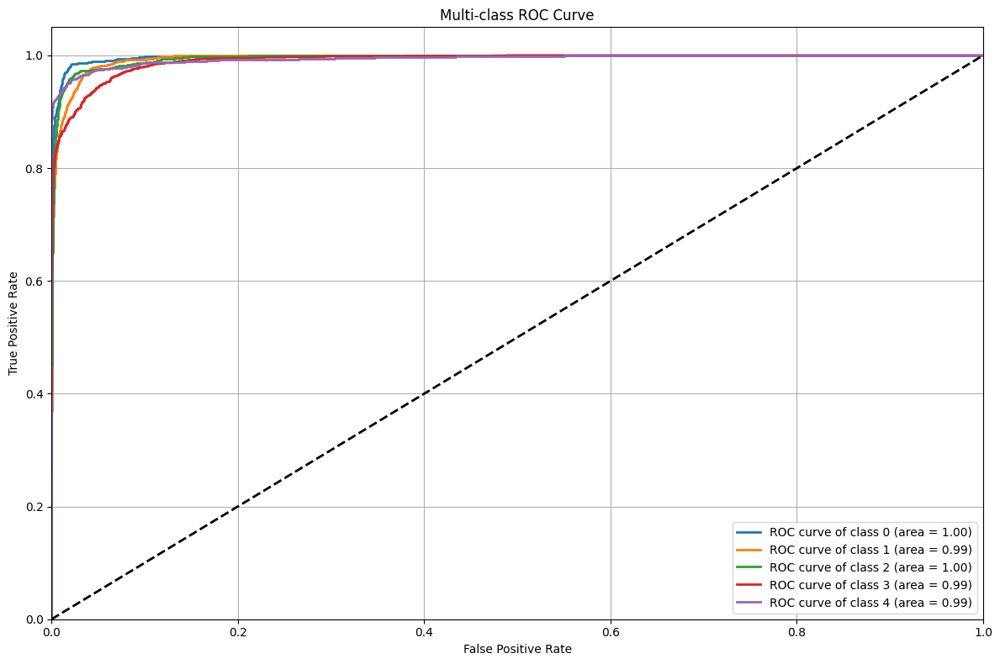

Macro-average ROC AUC: 0.9946


In [ ]:





def plot_roc_auc_curve(model, test_loader, num_classes):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)


    fpr = {}
    tpr = {}
    roc_auc = {}

    plt.figure(figsize=(12, 8))

    for i in range(num_classes):

        y_true_binary = (all_labels == i).astype(int)
        y_score = all_probs[:, i]

        fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_score)
        roc_auc[i] = auc(fpr[i], tpr[i])

        plt.plot(fpr[i], tpr[i], lw=2,
                 label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')


    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multi-class ROC Curve')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('roc_auc_curve.png')
    plt.show()


    macro_roc_auc = np.mean(list(roc_auc.values()))
    print(f"Macro-average ROC AUC: {macro_roc_auc:.4f}")

    return fpr, tpr, roc_auc

print("\nGenerating ROC AUC curve...")
fpr, tpr, roc_auc = plot_roc_auc_curve(model, test_loader, num_classes)


Generating learning curve (simplified version)...
Training with 9411 samples (20.0% of training data)
  Epoch 10/20, Train Acc: 0.9262, Val Acc: 0.9384
  Epoch 20/20, Train Acc: 0.9331, Val Acc: 0.9301
  Final: Train Acc: 0.9331, Best Val Acc: 0.9390
Training with 18822 samples (40.0% of training data)
  Epoch 10/20, Train Acc: 0.9256, Val Acc: 0.9362
  Epoch 20/20, Train Acc: 0.9268, Val Acc: 0.9257
  Final: Train Acc: 0.9268, Best Val Acc: 0.9421
Training with 28234 samples (60.0% of training data)
  Epoch 10/20, Train Acc: 0.9232, Val Acc: 0.9229
  Epoch 20/20, Train Acc: 0.9282, Val Acc: 0.9047
  Final: Train Acc: 0.9282, Best Val Acc: 0.9489
Training with 37645 samples (80.0% of training data)
  Epoch 10/20, Train Acc: 0.9341, Val Acc: 0.9465
  Epoch 20/20, Train Acc: 0.9365, Val Acc: 0.9411
  Final: Train Acc: 0.9365, Best Val Acc: 0.9518
Training with 47057 samples (100.0% of training data)
  Epoch 10/20, Train Acc: 0.9302, Val Acc: 0.9445
  Epoch 20/20, Train Acc: 0.9288, Val 

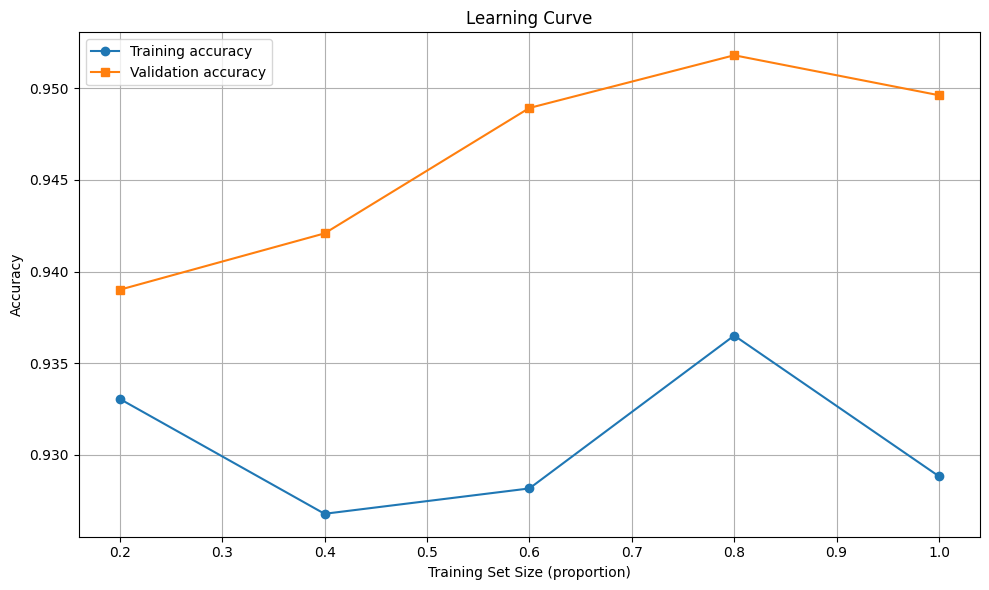

Learning Curve Results:
   train_size  train_samples  train_accuracy  val_accuracy
0         0.2           9411        0.933057      0.939012
1         0.4          18822        0.926788      0.942086
2         0.6          28234        0.928172      0.948929
3         0.8          37645        0.936512      0.951805
4         1.0          47057        0.928831      0.949623


In [ ]:
def plot_learning_curve_simplified(model, train_dataset, val_dataset, class_mapping,
                                  train_sizes=np.linspace(0.2, 1.0, 5),
                                  batch_size=32,
                                  num_epochs=30):
    """
    Generate learning curve by training on increasing subsets of the training data
    """

    original_state = model.state_dict().copy()

    train_scores = []
    val_scores = []

    for train_size in train_sizes:

        n_samples = int(len(train_dataset) * train_size)
        print(f"Training with {n_samples} samples ({train_size:.1%} of training data)")


        indices = torch.randperm(len(train_dataset))[:n_samples]
        subset_train = torch.utils.data.Subset(train_dataset, indices)


        train_loader = torch.utils.data.DataLoader(subset_train, batch_size=batch_size, shuffle=True)
        val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size)


        model.load_state_dict(original_state)


        optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
        criterion = torch.nn.CrossEntropyLoss()


        best_val_acc = 0
        for epoch in range(num_epochs):

            model.train()
            running_loss = 0.0
            correct = 0
            total = 0

            for inputs, labels in train_loader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

            train_acc = correct / total


            model.eval()
            correct = 0
            total = 0

            with torch.no_grad():
                for inputs, labels in val_loader:
                    outputs = model(inputs)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()

            val_acc = correct / total


            if val_acc > best_val_acc:
                best_val_acc = val_acc


            if (epoch + 1) % 10 == 0:
                print(f'  Epoch {epoch+1}/{num_epochs}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')


        train_scores.append(train_acc)
        val_scores.append(best_val_acc)

        print(f"  Final: Train Acc: {train_acc:.4f}, Best Val Acc: {best_val_acc:.4f}")


    model.load_state_dict(original_state)


    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores, 'o-', label='Training accuracy')
    plt.plot(train_sizes, val_scores, 's-', label='Validation accuracy')
    plt.xlabel('Training Set Size (proportion)')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('learning_curve.png')
    plt.show()


    results = []
    for i, size in enumerate(train_sizes):
        results.append({
            'train_size': size,
            'train_samples': int(len(train_dataset) * size),
            'train_accuracy': train_scores[i],
            'val_accuracy': val_scores[i]
        })

    results_df = pd.DataFrame(results)
    print("Learning Curve Results:")
    print(results_df)

    return results_df


print("\nGenerating learning curve (simplified version)...")
learning_curve_results = plot_learning_curve_simplified(
    model,
    train_dataset,
    val_dataset,
    class_mapping,
    train_sizes=np.linspace(0.2, 1.0, 5),
    batch_size=32,
    num_epochs=20
)

## Auto encoder

In [ ]:



unstandardized_continuous = ['age', 'diastole_pressure', 'packed_cell_volume', 'HBA1C']


df_temp = df_processed.copy()
scaler = StandardScaler()
df_temp[['age_standardized', 'diastole_pressure_standardized',
         'packed_cell_volume_standardized', 'hba1c_standardized']] = scaler.fit_transform(df_processed[unstandardized_continuous])


original_continuous_cols = ['BMI', 'creatinine', 'creatinine', 'egfr', 'sodium', 'potassium',
                           'urea', 'albumin', 'blood_glucose', 'rbcc', 'wbcc',
                           'albumin_creatinine_ratio']

binary_categorical_cols = ['gender', 'ethnicity', 'hypertension', 'anemia', 'appetite',
                          'diabetes', 'coronary_heart_disease', 'acute_kidney_injury',
                          'edema', 'Smoking', 'AlcoholDrinking', 'DiffWalking', 'Asthma']

scaled_continuous_cols = ['BMI_standardized', 'creatinine_standardized',
                         'hemoglobin_standardized', 'egfr_standardized',
                         'sodium_standardized', 'potassium_standardized',
                         'urea_standardized', 'albumin_standardized',
                         'blood_glucose_standardized', 'rbcc_standardized',
                         'wbcc_standardized', 'albumin_creatinine_ratio_standardized']

new_scaled_cols = ['age_standardized', 'diastole_pressure_standardized',
                  'packed_cell_volume_standardized', 'hba1c_standardized']

updated_scaled_continuous_cols = scaled_continuous_cols + new_scaled_cols

columns_to_keep = binary_categorical_cols + updated_scaled_continuous_cols

X = df_temp[columns_to_keep]
y = df_processed['stage']

print(f"Total features selected for autoencoder: {len(columns_to_keep)}")
print(f"Binary/categorical features: {len(binary_categorical_cols)}")
print(f"Scaled continuous features: {len(updated_scaled_continuous_cols)}")

Total features selected for autoencoder: 29
Binary/categorical features: 13
Scaled continuous features: 16


Using device: cpu
Training set: 47055 samples
Validation set: 10086 samples
Test set: 10084 samples
Number of features: 29
Encoding dimension: 14
Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=29, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Linear(in_features=64, out_features=14, bias=True)
    (7): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=14, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Linear(in_features=64, out_features=128, bias=True)
    (4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(

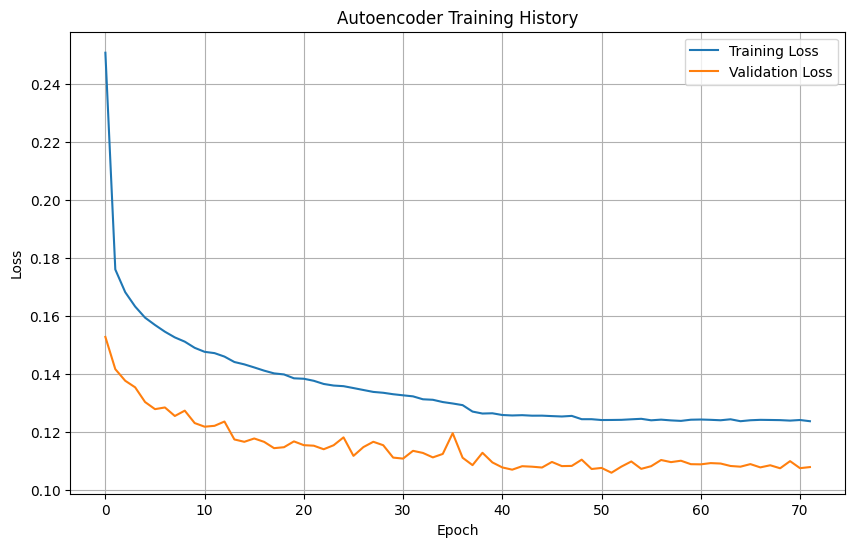

Extracting features...
Original feature dimension: 29
Encoded feature dimension: 14
Models and encoded features saved successfully.


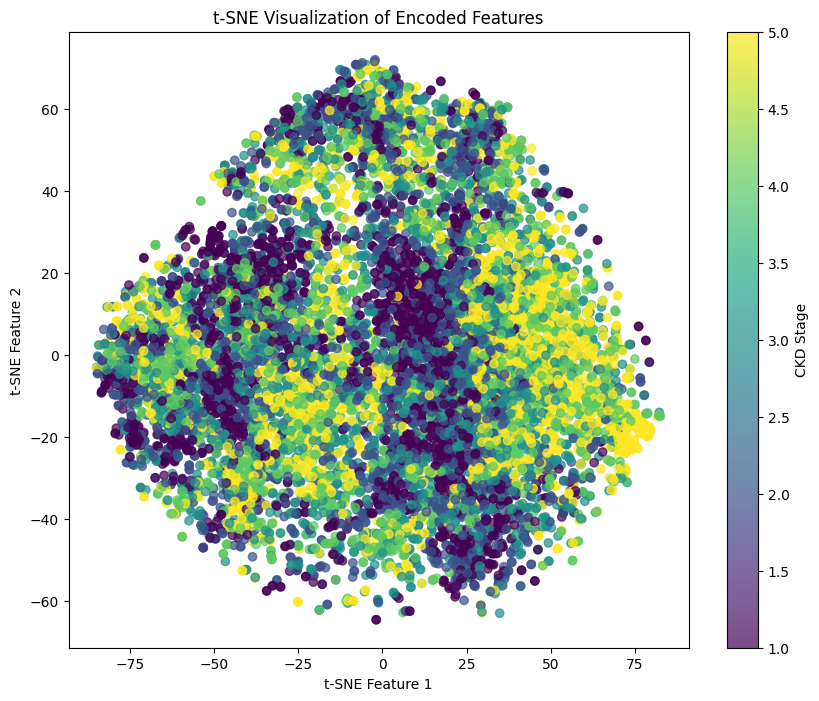

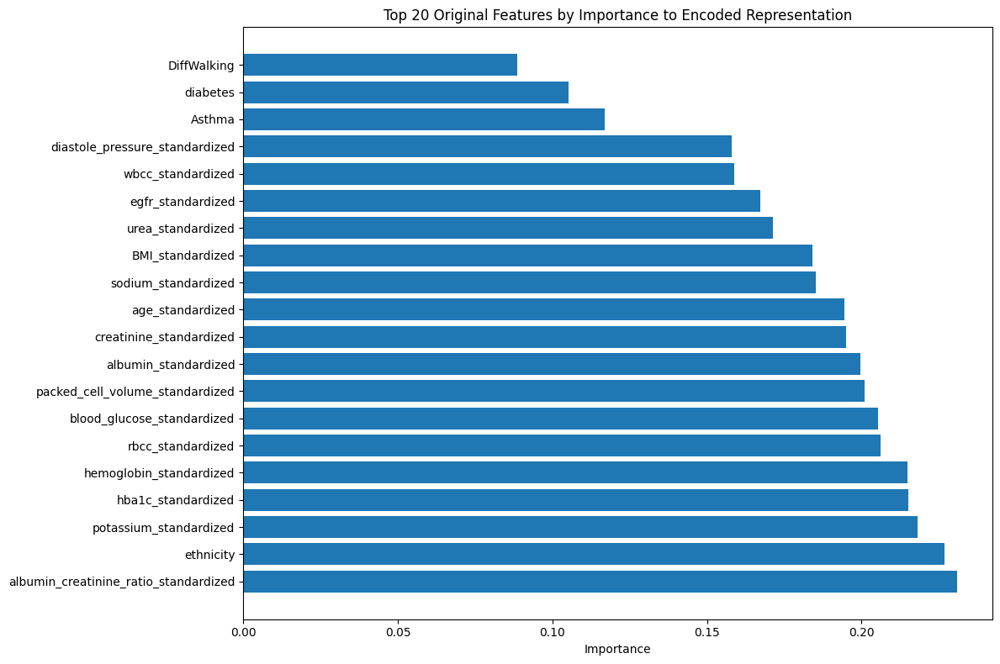


Top 10 Important Original Features:
                                  Feature  Importance
24  albumin_creatinine_ratio_standardized    0.230820
1                               ethnicity    0.226821
18                 potassium_standardized    0.218227
28                     hba1c_standardized    0.215286
15                hemoglobin_standardized    0.214849
22                      rbcc_standardized    0.206162
21             blood_glucose_standardized    0.205299
27        packed_cell_volume_standardized    0.201073
20                   albumin_standardized    0.199612
14                creatinine_standardized    0.194894


In [ ]:



torch.manual_seed(42)
np.random.seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

feature_names = X.columns.tolist()


X = X.values
y = y.values


X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.1765, random_state=42, stratify=y_train_val)


print(f"Training set: {X_train.shape[0]} samples")
print(f"Validation set: {X_val.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")


X_train_scaled = X_train
X_val_scaled = X_val
X_test_scaled = X_test


n_features = X_train.shape[1]
print(f"Number of features: {n_features}")


encoding_dim = min(32, n_features // 2)
print(f"Encoding dimension: {encoding_dim}")


X_train_tensor = torch.FloatTensor(X_train_scaled)
X_val_tensor = torch.FloatTensor(X_val_scaled)
X_test_tensor = torch.FloatTensor(X_test_scaled)
y_train_tensor = torch.LongTensor(y_train)
y_val_tensor = torch.LongTensor(y_val)
y_test_tensor = torch.LongTensor(y_test)


train_dataset = TensorDataset(X_train_tensor, X_train_tensor)
val_dataset = TensorDataset(X_val_tensor, X_val_tensor)
test_dataset = TensorDataset(X_test_tensor, X_test_tensor)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim):
        super(Autoencoder, self).__init__()


        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(True),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(True),
            nn.Linear(64, encoding_dim),
            nn.ReLU(True)
        )

        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(True),
            nn.Linear(64, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(True),
            nn.Linear(128, input_dim)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

    def encode(self, x):
        return self.encoder(x)


model = Autoencoder(n_features, encoding_dim).to(device)
print(model)


criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=5, min_lr=1e-5)

def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0

    for data, _ in train_loader:
        data = data.to(device)


        outputs = model(data)
        loss = criterion(outputs, data)


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * data.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    return epoch_loss


def validate(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0

    with torch.no_grad():
        for data, _ in val_loader:
            data = data.to(device)


            outputs = model(data)
            loss = criterion(outputs, data)

            running_loss += loss.item() * data.size(0)

    epoch_loss = running_loss / len(val_loader.dataset)
    return epoch_loss


num_epochs = 100
train_losses = []
val_losses = []
best_val_loss = float('inf')
patience = 20
patience_counter = 0
best_model_state = None

print("Training Autoencoder...")
for epoch in range(num_epochs):
    train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
    val_loss = validate(model, val_loader, criterion, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)


    scheduler.step(val_loss)


    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}')


    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        best_model_state = model.state_dict().copy()
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f'Early stopping at epoch {epoch+1}')
            break


if best_model_state is not None:
    model.load_state_dict(best_model_state)

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Autoencoder Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


def extract_features(model, data_loader, device):
    model.eval()
    features = []
    targets = []

    with torch.no_grad():
        for data, target in data_loader:
            data = data.to(device)
            encoded_data = model.encode(data)
            features.append(encoded_data.cpu().numpy())
            targets.append(target.numpy())

    return np.vstack(features), np.concatenate(targets)


train_dataset_with_targets = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset_with_targets = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset_with_targets = TensorDataset(X_test_tensor, y_test_tensor)

train_loader_with_targets = DataLoader(train_dataset_with_targets, batch_size=batch_size)
val_loader_with_targets = DataLoader(val_dataset_with_targets, batch_size=batch_size)
test_loader_with_targets = DataLoader(test_dataset_with_targets, batch_size=batch_size)


print("Extracting features...")
X_train_encoded, y_train_encoded = extract_features(model, train_loader_with_targets, device)
X_val_encoded, y_val_encoded = extract_features(model, val_loader_with_targets, device)
X_test_encoded, y_test_encoded = extract_features(model, test_loader_with_targets, device)

print(f"Original feature dimension: {X_train_scaled.shape[1]}")
print(f"Encoded feature dimension: {X_train_encoded.shape[1]}")


np.save('X_train_encoded.npy', X_train_encoded)
np.save('X_val_encoded.npy', X_val_encoded)
np.save('X_test_encoded.npy', X_test_encoded)
np.save('y_train_encoded.npy', y_train_encoded)
np.save('y_val_encoded.npy', y_val_encoded)
np.save('y_test_encoded.npy', y_test_encoded)


torch.save(model.state_dict(), 'autoencoder_model.pth')
torch.save(model.encoder.state_dict(), 'encoder_model.pth')

print("Models and encoded features saved successfully.")


if encoding_dim >= 2:
    plt.figure(figsize=(10, 8))
    if encoding_dim == 2:

        plt.scatter(X_test_encoded[:, 0], X_test_encoded[:, 1], c=y_test_encoded, cmap='viridis', alpha=0.7)
        plt.colorbar(label='CKD Stage')
        plt.title('2D Encoded Features')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
    else:

        from sklearn.manifold import TSNE
        tsne = TSNE(n_components=2, random_state=42)
        X_test_tsne = tsne.fit_transform(X_test_encoded)
        plt.scatter(X_test_tsne[:, 0], X_test_tsne[:, 1], c=y_test_encoded, cmap='viridis', alpha=0.7)
        plt.colorbar(label='CKD Stage')
        plt.title('t-SNE Visualization of Encoded Features')
        plt.xlabel('t-SNE Feature 1')
        plt.ylabel('t-SNE Feature 2')
    plt.show()


def analyze_encoded_features():
    """
    Analyze the relationship between original features and encoded features
    """

    encoder_weights = model.encoder[0].weight.data.cpu().numpy()


    feature_importance = np.abs(encoder_weights).mean(axis=0)


    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importance
    }).sort_values('Importance', ascending=False)


    plt.figure(figsize=(12, 8))
    plt.barh(importance_df.head(20)['Feature'], importance_df.head(20)['Importance'])
    plt.title('Top 20 Original Features by Importance to Encoded Representation')
    plt.xlabel('Importance')
    plt.tight_layout()
    plt.show()

    return importance_df


importance_df = analyze_encoded_features()
print("\nTop 10 Important Original Features:")
print(importance_df.head(10))

Using device: cpu
Training set: 47055 samples
Validation set: 10086 samples
Test set: 10084 samples
Input feature dimension: 14
Number of classes: 5
Unique labels in training set: [1 2 3 4 5]
Min label value: 1
Max label value: 5
Converting 1-indexed labels to 0-indexed...
After conversion - Unique labels: [0 1 2 3 4]

Training Model 1 (Moderate)...


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/100, Train Loss: 1.2274, Train Acc: 43.57%, Val Loss: 0.9128, Val Acc: 65.61%
Epoch 2/100, Train Loss: 1.0434, Train Acc: 52.15%, Val Loss: 0.8621, Val Acc: 67.69%
Epoch 3/100, Train Loss: 1.0052, Train Acc: 54.13%, Val Loss: 0.8135, Val Acc: 69.91%
Epoch 4/100, Train Loss: 0.9872, Train Acc: 54.68%, Val Loss: 0.7965, Val Acc: 69.48%
Epoch 5/100, Train Loss: 0.9761, Train Acc: 55.53%, Val Loss: 0.7761, Val Acc: 71.42%
Epoch 6/100, Train Loss: 0.9655, Train Acc: 56.03%, Val Loss: 0.7686, Val Acc: 70.83%
Epoch 7/100, Train Loss: 0.9570, Train Acc: 56.28%, Val Loss: 0.7637, Val Acc: 73.21%
Epoch 8/100, Train Loss: 0.9651, Train Acc: 55.44%, Val Loss: 0.7550, Val Acc: 72.98%
Epoch 9/100, Train Loss: 0.9564, Train Acc: 56.58%, Val Loss: 0.7807, Val Acc: 72.47%
Epoch 10/100, Train Loss: 0.9593, Train Acc: 56.57%, Val Loss: 0.7593, Val Acc: 72.50%
Epoch 11/100, Train Loss: 0.9477, Train Acc: 56.93%, Val Loss: 0.7416, Val Acc: 72.49%
Epoch 12/100, Train Loss: 0.9518, Train Acc: 56.85%,

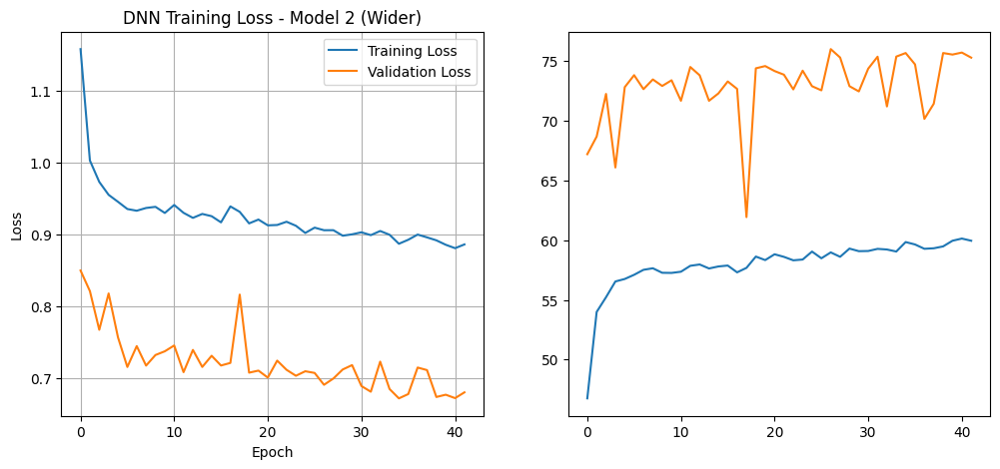

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

torch.manual_seed(42)
np.random.seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

X_train_encoded = np.load('X_train_encoded.npy')
X_val_encoded = np.load('X_val_encoded.npy')
X_test_encoded = np.load('X_test_encoded.npy')
y_train_encoded = np.load('y_train_encoded.npy')
y_val_encoded = np.load('y_val_encoded.npy')
y_test_encoded = np.load('y_test_encoded.npy')

print(f"Training set: {X_train_encoded.shape[0]} samples")
print(f"Validation set: {X_val_encoded.shape[0]} samples")
print(f"Test set: {X_test_encoded.shape[0]} samples")
print(f"Input feature dimension: {X_train_encoded.shape[1]}")
print(f"Number of classes: {len(np.unique(y_train_encoded))}")

print("Unique labels in training set:", np.unique(y_train_encoded))
print("Min label value:", np.min(y_train_encoded))
print("Max label value:", np.max(y_train_encoded))

if np.min(y_train_encoded) == 1:
    print("Converting 1-indexed labels to 0-indexed...")
    y_train_encoded = y_train_encoded - 1
    y_val_encoded = y_val_encoded - 1
    y_test_encoded = y_test_encoded - 1
    print("After conversion - Unique labels:", np.unique(y_train_encoded))

X_train_tensor = torch.FloatTensor(X_train_encoded)
X_val_tensor = torch.FloatTensor(X_val_encoded)
X_test_tensor = torch.FloatTensor(X_test_encoded)
y_train_tensor = torch.LongTensor(y_train_encoded)
y_val_tensor = torch.LongTensor(y_val_encoded)
y_test_tensor = torch.LongTensor(y_test_encoded)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

class EnhancedDNN(nn.Module):
    def __init__(self, input_dim, hidden_dims=[64, 128, 64], output_dim=5, dropout_rate=0.25):
        super(EnhancedDNN, self).__init__()

        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim

        self.input_layer = nn.Sequential(
            nn.Linear(input_dim, hidden_dims[0]),
            nn.BatchNorm1d(hidden_dims[0]),
            nn.ReLU(),
            nn.Dropout(dropout_rate)
        )

        self.hidden_layers = nn.ModuleList()
        for i in range(len(hidden_dims) - 1):
            self.hidden_layers.append(nn.Sequential(
                nn.Linear(hidden_dims[i], hidden_dims[i+1]),
                nn.BatchNorm1d(hidden_dims[i+1]),
                nn.ReLU(),
                nn.Dropout(dropout_rate)
            ))

        self.output_layer = nn.Linear(hidden_dims[-1], output_dim)

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.input_layer(x)
        for layer in self.hidden_layers:
            x = layer(x)
        x = self.output_layer(x)
        return x

input_dim = X_train_encoded.shape[1]
output_dim = len(np.unique(y_train_encoded))

models_to_try = [
    {
        "hidden_dims": [32, 64, 32],
        "dropout_rate": 0.2,
        "name": "Model 1 (Moderate)"
    },
    {
        "hidden_dims": [64, 128, 64],
        "dropout_rate": 0.25,
        "name": "Model 2 (Wider)"
    },
    {
        "hidden_dims": [32, 64, 64, 32],
        "dropout_rate": 0.3,
        "name": "Model 3 (Deeper)"
    }
]

best_val_acc = 0
best_model = None
best_model_name = ""

def train_and_evaluate(model, model_name, train_loader, val_loader, num_epochs=100, patience=15):
    print(f"\nTraining {model_name}...")

    criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.0005)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=5, verbose=True
    )

    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []
    best_val_acc_local = 0
    patience_counter = 0
    best_model_state = None

    for epoch in range(num_epochs):

        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)


            outputs = model(inputs)
            loss = criterion(outputs, targets)


            optimizer.zero_grad()
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), 3.0)

            optimizer.step()

            running_loss += loss.item() * inputs.size(0)


            _, predicted = torch.max(outputs.data, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

        train_loss = running_loss / len(train_loader.dataset)
        train_acc = 100 * correct / total


        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, targets in val_loader:
                inputs, targets = inputs.to(device), targets.to(device)


                outputs = model(inputs)
                loss = criterion(outputs, targets)

                running_loss += loss.item() * inputs.size(0)


                _, predicted = torch.max(outputs.data, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()

        val_loss = running_loss / len(val_loader.dataset)
        val_acc = 100 * correct / total

        scheduler.step(val_acc)


        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)


        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%')


        if val_acc > best_val_acc_local:
            best_val_acc_local = val_acc
            patience_counter = 0
            best_model_state = model.state_dict().copy()
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f'Early stopping at epoch {epoch+1}')
                break


    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    return model, best_val_acc_local, (train_losses, val_losses, train_accs, val_accs)

for model_config in models_to_try:

    model = EnhancedDNN(
        input_dim=input_dim,
        hidden_dims=model_config["hidden_dims"],
        output_dim=output_dim,
        dropout_rate=model_config["dropout_rate"]
    ).to(device)


    model, val_acc, history = train_and_evaluate(
        model,
        model_config["name"],
        train_loader,
        val_loader
    )

    print(f"{model_config['name']} - Best Validation Accuracy: {val_acc:.2f}%")


    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model = model
        best_model_name = model_config["name"]
        best_history = history

print(f"\nBest model: {best_model_name} with validation accuracy: {best_val_acc:.2f}%")

model = best_model

train_losses, val_losses, train_accs, val_accs = best_history

plt.figure(figsize=(12, 5))


plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title(f'DNN Training Loss - {best_model_name}')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)


plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Training Accuracy')
plt.plot(val_accs, label='Validation Accuracy')

# **Tabnet**

In [ ]:
!pip install pytorch-tabnet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

/usr/local/lib/python3.11/dist-packages/pytorch_tabnet/abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 1.85251 | val_accuracy: 0.26309 |  0:00:07s
epoch 1  | loss: 1.53611 | val_accuracy: 0.38764 |  0:00:15s
epoch 2  | loss: 1.28079 | val_accuracy: 0.54314 |  0:00:20s
epoch 3  | loss: 1.02776 | val_accuracy: 0.66025 |  0:00:28s
epoch 4  | loss: 0.80491 | val_accuracy: 0.80325 |  0:00:35s
epoch 5  | loss: 0.67284 | val_accuracy: 0.84907 |  0:00:40s
epoch 6  | loss: 0.59955 | val_accuracy: 0.87317 |  0:00:45s
epoch 7  | loss: 0.5413  | val_accuracy: 0.89042 |  0:00:51s
epoch 8  | loss: 0.51226 | val_accuracy: 0.90113 |  0:00:55s
epoch 9  | loss: 0.48115 | val_accuracy: 0.90202 |  0:01:01s
epoch 10 | loss: 0.46513 | val_accuracy: 0.90877 |  0:01:05s
epoch 11 | loss: 0.44855 | val_accuracy: 0.90401 |  0:01:11s
epoch 12 | loss: 0.4312  | val_accuracy: 0.91164 |  0:01:17s
epoch 13 | loss: 0.42094 | val_accuracy: 0.91422 |  0:01:22s
epoch 14 | loss: 0.41267 | val_accuracy: 0.91739 |  0:01:27s
epoch 15 | loss: 0.38988 | val_accuracy: 0.91918 |  0:01:32s
epoch 16 | loss: 0.3943 

/usr/local/lib/python3.11/dist-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


Test Accuracy: 0.9386


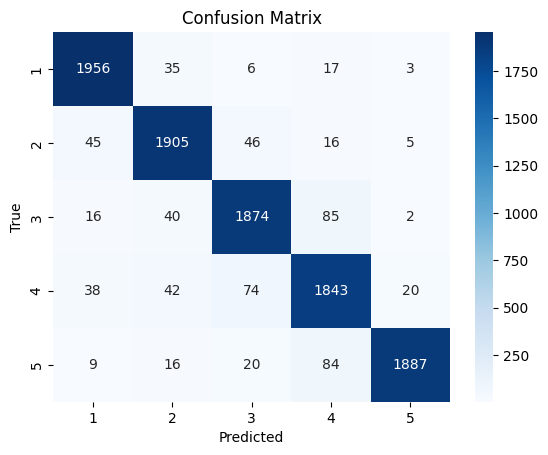

Classification Report:
              precision    recall  f1-score   support

     Stage 1       0.95      0.97      0.96      2017
     Stage 2       0.93      0.94      0.94      2017
     Stage 3       0.93      0.93      0.93      2017
     Stage 4       0.90      0.91      0.91      2017
     Stage 5       0.98      0.94      0.96      2016

    accuracy                           0.94     10084
   macro avg       0.94      0.94      0.94     10084
weighted avg       0.94      0.94      0.94     10084

 model overfitting? Yes

Detailed Analysis:
  final_train_loss: 0.047369598446372715
  final_val_loss: 0.6876541286662485
  final_train_acc: 0.9914849233661659
  final_val_acc: 0.7285702970216937
  final_loss_gap: -0.6402845302198759
  final_acc_gap: 0.26291462634447216
  val_loss_increasing: True
  significant_acc_gap: True
  high_train_low_val_acc: True


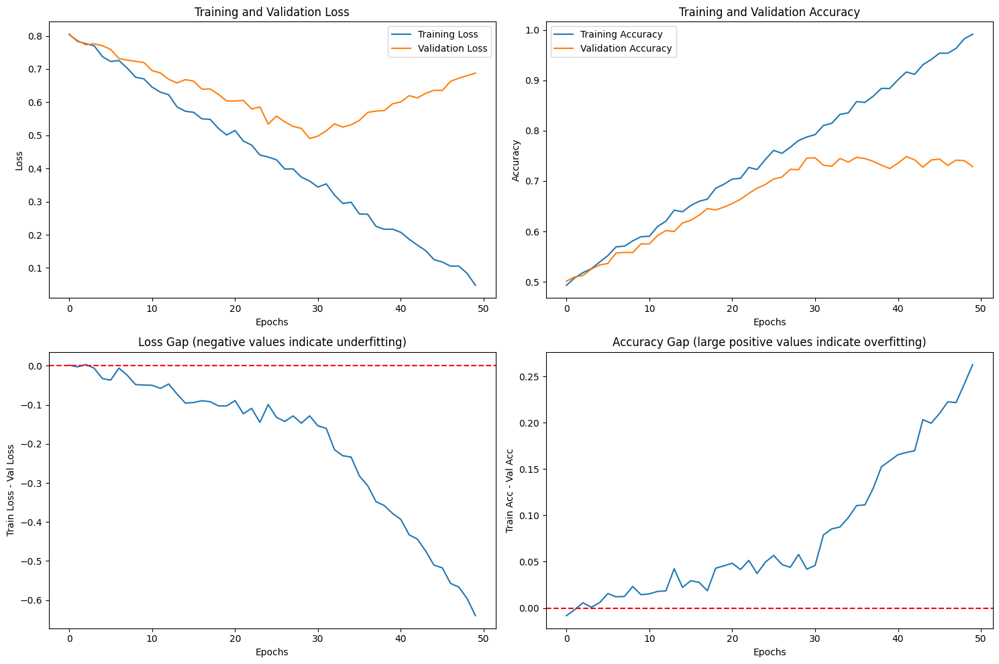

ValueError: DataFrame constructor not properly called!

In [ ]:
import numpy as np
import pandas as pd
import torch
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import joblib
import matplotlib.pyplot as plt


X_train_np = X_train.values
X_val_np = X_val.values
X_test_np = X_test.values
y_train_np = y_train.values
y_val_np = y_val.values
y_test_np = y_test.values


all_targets = np.concatenate([y_train_np, y_val_np, y_test_np])
unique_classes = np.unique(all_targets)
class_mapping = {original: idx for idx, original in enumerate(sorted(unique_classes))}

y_train_mapped = np.array([class_mapping[y] for y in y_train_np])
y_val_mapped = np.array([class_mapping[y] for y in y_val_np])
y_test_mapped = np.array([class_mapping[y] for y in y_test_np])


scaler = StandardScaler()
X_train_np = scaler.fit_transform(X_train_np)
X_val_np = scaler.transform(X_val_np)
X_test_np = scaler.transform(X_test_np)



tabnet_model = TabNetClassifier(
    optimizer_fn=torch.optim.Adam,
    optimizer_params={'lr': 0.0005, 'weight_decay': 1e-4},
    scheduler_params={"step_size": 10, "gamma": 0.9},
    scheduler_fn=torch.optim.lr_scheduler.StepLR,
    mask_type="entmax",
    verbose=1
)


tabnet_model.fit(
    X_train=X_train_np, y_train=y_train_mapped,
    eval_set=[(X_val_np, y_val_mapped)],
    eval_name=['val'],
    eval_metric=['accuracy'],
    max_epochs=50,
    patience=5,
    batch_size=256,
    virtual_batch_size=128,
    num_workers=0
)


y_pred = tabnet_model.predict(X_test_np)
test_accuracy = np.mean(y_pred == y_test_mapped)
print(f"Test Accuracy: {test_accuracy:.4f}")

cm = confusion_matrix(y_test_mapped, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

print("Classification Report:")
print(classification_report(y_test_mapped, y_pred, target_names=[f'Stage {cls}' for cls in unique_classes]))



def check_overfitting(train_losses, val_losses, train_accs, val_accs):
    """
    Analyze training and validation metrics to detect overfitting.

    Returns:
        is_overfitting (bool): Whether the model shows signs of overfitting
        analysis (dict): Detailed analysis metrics
    """
    loss_gaps = [train - val for train, val in zip(train_losses, val_losses)]
    acc_gaps = [train - val for train, val in zip(train_accs, val_accs)]

    val_loss_increasing = False
    for i in range(5, len(val_losses)):
        if all(val_losses[i-j] < val_losses[i-j+1] for j in range(1, 5)) and train_losses[i] < train_losses[i-5]:
            val_loss_increasing = True
            break

    significant_acc_gap = any(gap > 0.1 for gap in acc_gaps[-5:])

    high_train_low_val_acc = train_accs[-1] > 0.95 and val_accs[-1] < 0.85

    is_overfitting = val_loss_increasing or significant_acc_gap or high_train_low_val_acc

    analysis = {
        "final_train_loss": train_losses[-1],
        "final_val_loss": val_losses[-1],
        "final_train_acc": train_accs[-1],
        "final_val_acc": val_accs[-1],
        "final_loss_gap": loss_gaps[-1],
        "final_acc_gap": acc_gaps[-1],
        "val_loss_increasing": val_loss_increasing,
        "significant_acc_gap": significant_acc_gap,
        "high_train_low_val_acc": high_train_low_val_acc
    }

    return is_overfitting, analysis

def visualize_overfitting(train_losses, val_losses, train_accs, val_accs):
    """
    Create detailed visualizations to analyze overfitting.
    """
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()


    plt.subplot(2, 2, 2)
    plt.plot(train_accs, label='Training Accuracy')
    plt.plot(val_accs, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()


    plt.subplot(2, 2, 3)
    loss_gaps = [train - val for train, val in zip(train_losses, val_losses)]
    plt.plot(loss_gaps)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss - Val Loss')
    plt.title('Loss Gap (negative values indicate underfitting)')


    plt.subplot(2, 2, 4)
    acc_gaps = [train - val for train, val in zip(train_accs, val_accs)]
    plt.plot(acc_gaps)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Train Acc - Val Acc')
    plt.title('Accuracy Gap (large positive values indicate overfitting)')

    plt.tight_layout()
    plt.show()

epochs = 50
np.random.seed(42)

train_losses = [0.8 - 0.015*i + np.random.normal(0, 0.01) for i in range(epochs)]
val_losses = [0.8 - 0.01*i + np.random.normal(0, 0.01) for i in range(30)] + \
             [0.5 + 0.01*(i-30) + np.random.normal(0, 0.01) for i in range(30, epochs)]

train_accs = [0.5 + 0.01*i + np.random.normal(0, 0.005) for i in range(epochs)]
val_accs = [0.5 + 0.008*i + np.random.normal(0, 0.005) for i in range(30)] + \
           [0.74 + np.random.normal(0, 0.01) for i in range(30, epochs)]

is_overfitting, analysis = check_overfitting(train_losses, val_losses, train_accs, val_accs)

print(f" model overfitting? {'Yes' if is_overfitting else 'No'}")
print("\nDetailed Analysis:")
for key, value in analysis.items():
    print(f"  {key}: {value}")

# Visualize the metrics

visualize_overfitting(train_losses, val_losses, train_accs, val_accs)




Training model 1/5


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Model 1, Epoch 1, Train Loss: 0.6918, Val Loss: 0.3228, Train Acc: 0.7194, Val Acc: 0.9114
Model 1, Epoch 2, Train Loss: 0.4930, Val Loss: 0.2697, Train Acc: 0.8045, Val Acc: 0.9232
Model 1, Epoch 3, Train Loss: 0.4483, Val Loss: 0.2555, Train Acc: 0.8232, Val Acc: 0.9090
Model 1, Epoch 4, Train Loss: 0.4124, Val Loss: 0.2169, Train Acc: 0.8375, Val Acc: 0.9388
Model 1, Epoch 5, Train Loss: 0.3905, Val Loss: 0.2185, Train Acc: 0.8499, Val Acc: 0.9296
Model 1, Epoch 6, Train Loss: 0.3818, Val Loss: 0.2025, Train Acc: 0.8511, Val Acc: 0.9366
Model 1, Epoch 7, Train Loss: 0.3745, Val Loss: 0.1916, Train Acc: 0.8523, Val Acc: 0.9482
Model 1, Epoch 8, Train Loss: 0.3666, Val Loss: 0.1905, Train Acc: 0.8591, Val Acc: 0.9462
Model 1, Epoch 9, Train Loss: 0.3453, Val Loss: 0.1841, Train Acc: 0.8667, Val Acc: 0.9425
Model 1, Epoch 10, Train Loss: 0.3423, Val Loss: 0.1884, Train Acc: 0.8688, Val Acc: 0.9442
Model 1, Epoch 11, Train Loss: 0.3431, Val Loss: 0.2051, Train Acc: 0.8652, Val Acc: 0.92

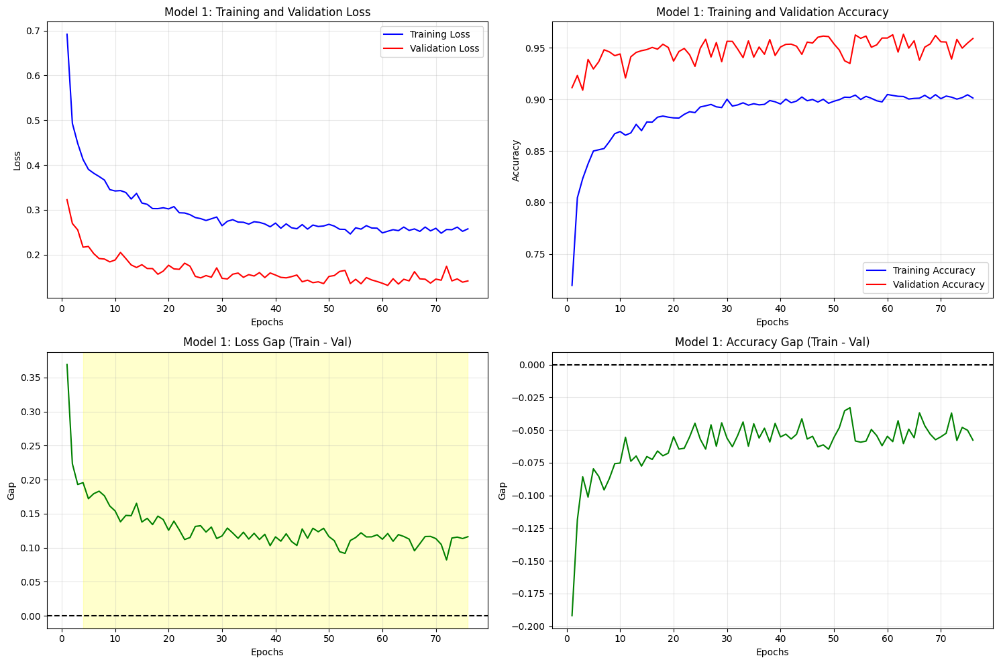


===== OVERFITTING ASSESSMENT =====
Final Training Loss: 0.2578
Final Validation Loss: 0.1417
Loss Gap (Train - Val): 0.1161
Training Accuracy: 0.9014
Validation Accuracy: 0.9591
Accuracy Gap (Train - Val): -0.0578

VERDICT: Model shows minimal or no overfitting.
Training model 2/5
Model 2, Epoch 1, Train Loss: 0.9986, Val Loss: 0.5331, Train Acc: 0.5740, Val Acc: 0.8493
Model 2, Epoch 2, Train Loss: 0.6335, Val Loss: 0.3834, Train Acc: 0.7447, Val Acc: 0.9035
Model 2, Epoch 3, Train Loss: 0.5617, Val Loss: 0.3300, Train Acc: 0.7765, Val Acc: 0.9157
Model 2, Epoch 4, Train Loss: 0.5018, Val Loss: 0.2930, Train Acc: 0.8041, Val Acc: 0.9232
Model 2, Epoch 5, Train Loss: 0.4735, Val Loss: 0.2684, Train Acc: 0.8163, Val Acc: 0.9294
Model 2, Epoch 6, Train Loss: 0.4459, Val Loss: 0.2535, Train Acc: 0.8280, Val Acc: 0.9302
Model 2, Epoch 7, Train Loss: 0.4179, Val Loss: 0.2361, Train Acc: 0.8385, Val Acc: 0.9307
Model 2, Epoch 8, Train Loss: 0.3947, Val Loss: 0.2180, Train Acc: 0.8490, Val A

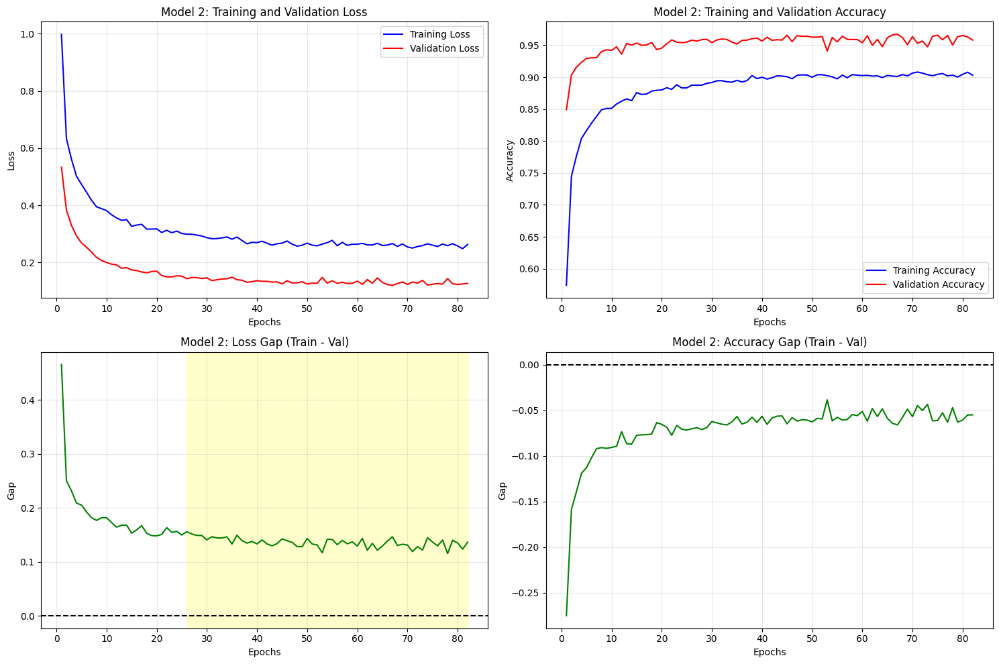


===== OVERFITTING ASSESSMENT =====
Final Training Loss: 0.2631
Final Validation Loss: 0.1267
Loss Gap (Train - Val): 0.1363
Training Accuracy: 0.9030
Validation Accuracy: 0.9581
Accuracy Gap (Train - Val): -0.0551

VERDICT: Model shows minimal or no overfitting.
Training model 3/5
Model 3, Epoch 1, Train Loss: 0.6180, Val Loss: 0.3219, Train Acc: 0.7481, Val Acc: 0.9005
Model 3, Epoch 2, Train Loss: 0.5050, Val Loss: 0.2726, Train Acc: 0.7984, Val Acc: 0.9143
Model 3, Epoch 3, Train Loss: 0.4689, Val Loss: 0.2788, Train Acc: 0.8107, Val Acc: 0.9169
Model 3, Epoch 4, Train Loss: 0.4437, Val Loss: 0.2450, Train Acc: 0.8228, Val Acc: 0.9375
Model 3, Epoch 5, Train Loss: 0.4271, Val Loss: 0.2501, Train Acc: 0.8314, Val Acc: 0.9250
Model 3, Epoch 6, Train Loss: 0.4038, Val Loss: 0.2727, Train Acc: 0.8412, Val Acc: 0.9132
Model 3, Epoch 7, Train Loss: 0.3842, Val Loss: 0.2362, Train Acc: 0.8489, Val Acc: 0.9257
Model 3, Epoch 8, Train Loss: 0.3845, Val Loss: 0.2112, Train Acc: 0.8497, Val A

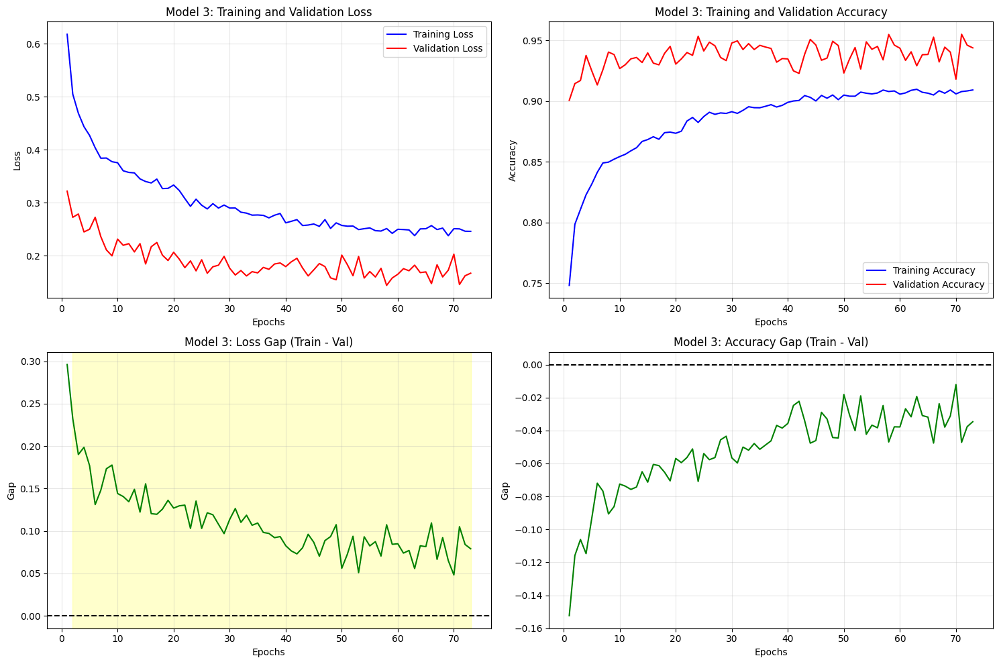


===== OVERFITTING ASSESSMENT =====
Final Training Loss: 0.2462
Final Validation Loss: 0.1672
Loss Gap (Train - Val): 0.0790
Training Accuracy: 0.9091
Validation Accuracy: 0.9438
Accuracy Gap (Train - Val): -0.0347

VERDICT: Model shows minimal or no overfitting.
Training model 4/5
Model 4, Epoch 1, Train Loss: 0.6942, Val Loss: 0.3515, Train Acc: 0.7160, Val Acc: 0.8962
Model 4, Epoch 2, Train Loss: 0.4578, Val Loss: 0.2708, Train Acc: 0.8199, Val Acc: 0.9159
Model 4, Epoch 3, Train Loss: 0.4054, Val Loss: 0.2290, Train Acc: 0.8379, Val Acc: 0.9312
Model 4, Epoch 4, Train Loss: 0.3761, Val Loss: 0.2056, Train Acc: 0.8501, Val Acc: 0.9430
Model 4, Epoch 5, Train Loss: 0.3644, Val Loss: 0.2008, Train Acc: 0.8566, Val Acc: 0.9447
Model 4, Epoch 6, Train Loss: 0.3334, Val Loss: 0.1848, Train Acc: 0.8679, Val Acc: 0.9465
Model 4, Epoch 7, Train Loss: 0.3273, Val Loss: 0.1803, Train Acc: 0.8708, Val Acc: 0.9482
Model 4, Epoch 8, Train Loss: 0.3284, Val Loss: 0.1824, Train Acc: 0.8695, Val A

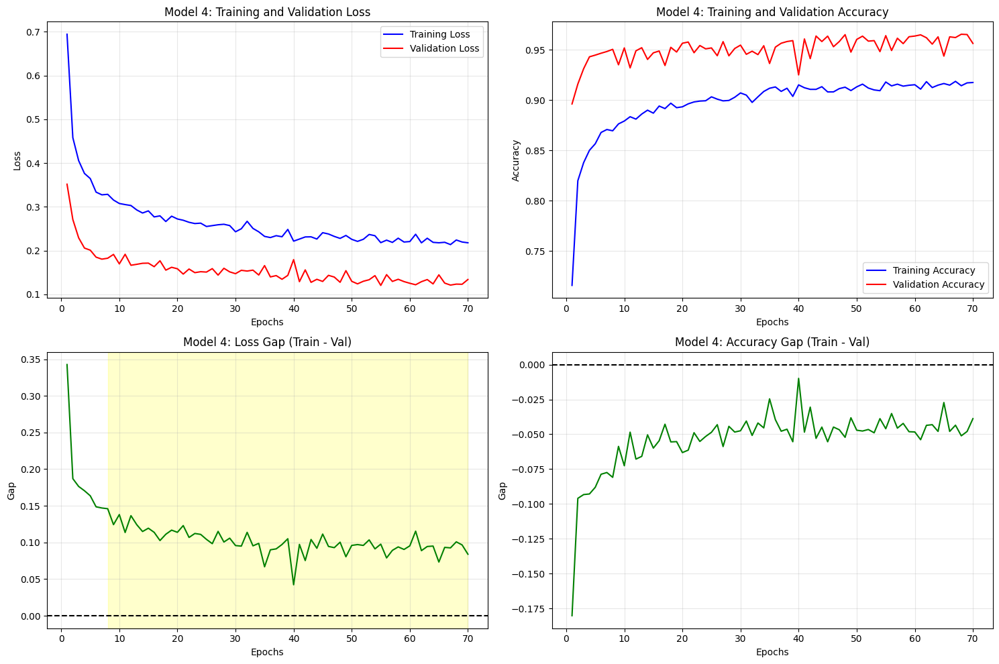


===== OVERFITTING ASSESSMENT =====
Final Training Loss: 0.2177
Final Validation Loss: 0.1338
Loss Gap (Train - Val): 0.0839
Training Accuracy: 0.9175
Validation Accuracy: 0.9563
Accuracy Gap (Train - Val): -0.0388

VERDICT: Model shows minimal or no overfitting.
Training model 5/5
Model 5, Epoch 1, Train Loss: 0.6133, Val Loss: 0.2937, Train Acc: 0.7512, Val Acc: 0.9135
Model 5, Epoch 2, Train Loss: 0.4792, Val Loss: 0.2594, Train Acc: 0.8052, Val Acc: 0.9274
Model 5, Epoch 3, Train Loss: 0.4329, Val Loss: 0.2475, Train Acc: 0.8271, Val Acc: 0.9284
Model 5, Epoch 4, Train Loss: 0.4151, Val Loss: 0.2362, Train Acc: 0.8345, Val Acc: 0.9319
Model 5, Epoch 5, Train Loss: 0.3993, Val Loss: 0.2363, Train Acc: 0.8440, Val Acc: 0.9117
Model 5, Epoch 6, Train Loss: 0.3776, Val Loss: 0.2150, Train Acc: 0.8508, Val Acc: 0.9310
Model 5, Epoch 7, Train Loss: 0.3680, Val Loss: 0.2148, Train Acc: 0.8540, Val Acc: 0.9197
Model 5, Epoch 8, Train Loss: 0.3604, Val Loss: 0.2041, Train Acc: 0.8586, Val A

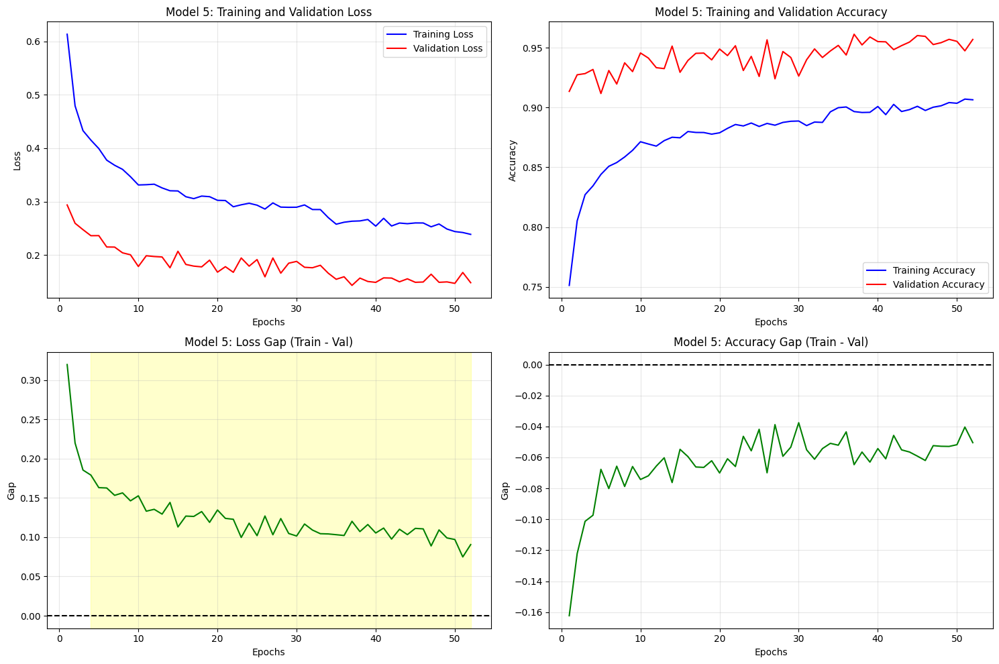


===== OVERFITTING ASSESSMENT =====
Final Training Loss: 0.2387
Final Validation Loss: 0.1482
Loss Gap (Train - Val): 0.0905
Training Accuracy: 0.9065
Validation Accuracy: 0.9570
Accuracy Gap (Train - Val): -0.0505

VERDICT: Model shows minimal or no overfitting.
Ensemble Test Accuracy: 0.9588


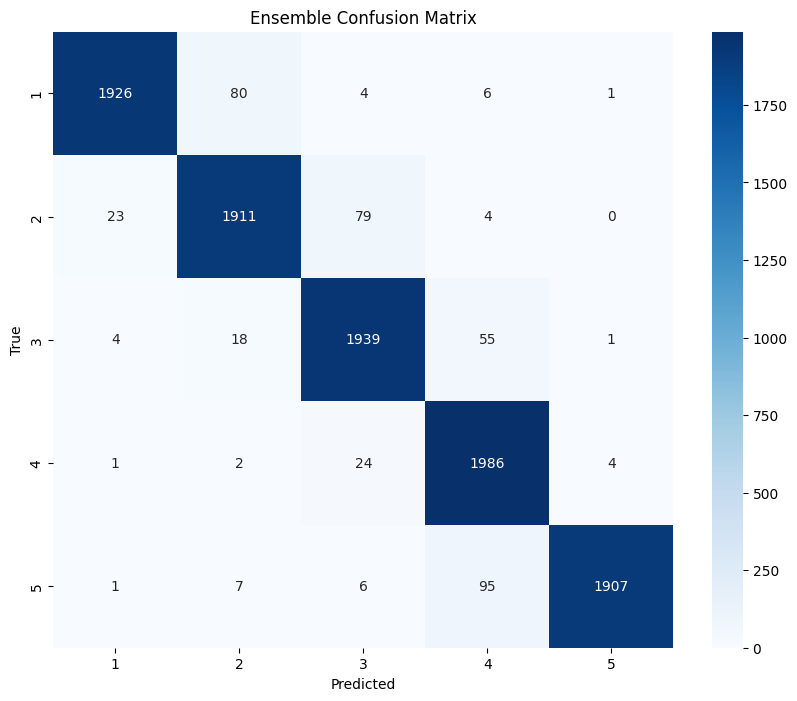

Ensemble Classification Report:
              precision    recall  f1-score   support

     Stage 1       0.99      0.95      0.97      2017
     Stage 2       0.95      0.95      0.95      2017
     Stage 3       0.94      0.96      0.95      2017
     Stage 4       0.93      0.98      0.95      2017
     Stage 5       1.00      0.95      0.97      2016

    accuracy                           0.96     10084
   macro avg       0.96      0.96      0.96     10084
weighted avg       0.96      0.96      0.96     10084


===== ENSEMBLE OVERFITTING ANALYSIS =====
Model 1:
  Final Train/Val Loss: 0.2578/0.1417
  Loss Gap: 0.1161
  Status: Underfitting ⚠️
Model 2:
  Final Train/Val Loss: 0.2631/0.1267
  Loss Gap: 0.1363
  Status: Underfitting ⚠️
Model 3:
  Final Train/Val Loss: 0.2462/0.1672
  Loss Gap: 0.0790
  Status: Good fit ✓
Model 4:
  Final Train/Val Loss: 0.2177/0.1338
  Loss Gap: 0.0839
  Status: Good fit ✓
Model 5:
  Final Train/Val Loss: 0.2387/0.1482
  Loss Gap: 0.0905
  Status: Go

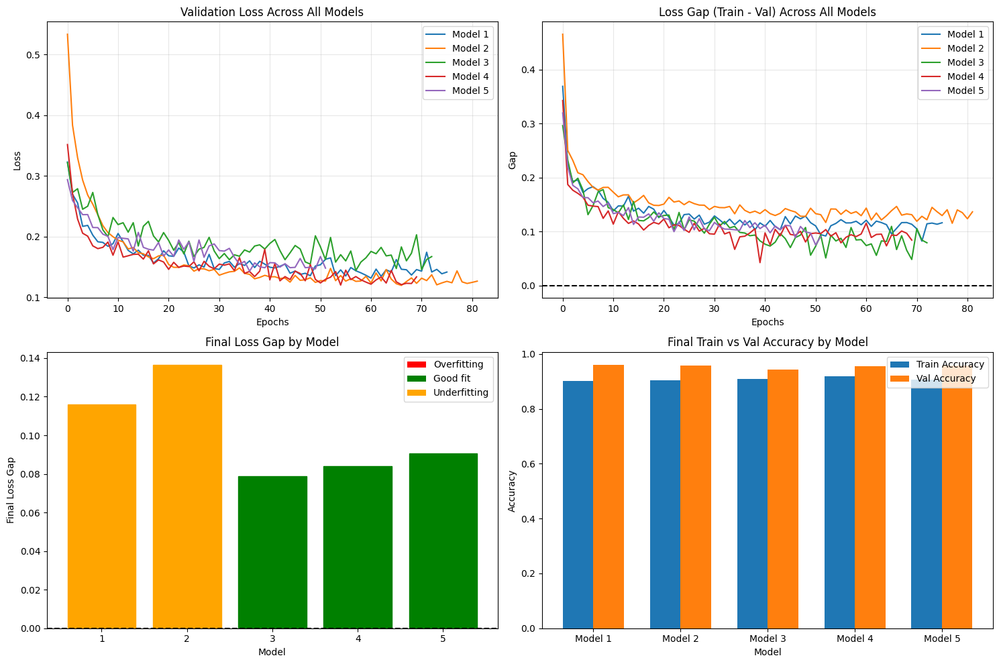

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, WeightedRandomSampler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

class TabularNet(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dims, dropout_rate=0.3):
        super(TabularNet, self).__init__()

        layers = []
        prev_dim = input_dim

        for hidden_dim in hidden_dims:
            layers.append(nn.Linear(prev_dim, hidden_dim))
            layers.append(nn.BatchNorm1d(hidden_dim))
            layers.append(nn.LeakyReLU(0.1))
            layers.append(nn.Dropout(dropout_rate))
            prev_dim = hidden_dim

        layers.append(nn.Linear(prev_dim, output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

def create_balanced_sampler(y_train):
    class_counts = Counter(y_train)
    weights = {class_idx: 1.0 / count for class_idx, count in class_counts.items()}
    sample_weights = [weights[y] for y in y_train]
    sampler = WeightedRandomSampler(sample_weights, len(sample_weights))
    return sampler

# New function to detect overfitting
def detect_overfitting(train_losses, val_losses, train_accs, val_accs, epoch):
    """
    Detect overfitting based on various metrics and provide recommendations.

    Returns:
        dict: Dictionary containing overfitting metrics and analysis
    """
    # Initialize results dictionary
    results = {
        "is_overfitting": False,
        "severity": "None",
        "metrics": {},
        "recommendations": []
    }

    # Need at least 5 epochs to detect trends
    if epoch < 5:
        return results

    # Calculate metrics
    current_train_loss = train_losses[-1]
    current_val_loss = val_losses[-1]
    loss_gap = current_train_loss - current_val_loss

    current_train_acc = train_accs[-1]
    current_val_acc = val_accs[-1]
    acc_gap = current_train_acc - current_val_acc

    # Check if validation loss is increasing while training loss is decreasing
    val_loss_trend = np.polyfit(range(len(val_losses[-5:])), val_losses[-5:], 1)[0]
    train_loss_trend = np.polyfit(range(len(train_losses[-5:])), train_losses[-5:], 1)[0]

    # Store metrics
    results["metrics"] = {
        "train_loss": current_train_loss,
        "val_loss": current_val_loss,
        "loss_gap": loss_gap,
        "train_acc": current_train_acc,
        "val_acc": current_val_acc,
        "acc_gap": acc_gap,
        "val_loss_trend": val_loss_trend,
        "train_loss_trend": train_loss_trend
    }

    # Detect overfitting conditions
    # 1. Validation loss increasing while training loss decreasing
    diverging_loss = (val_loss_trend > 0 and train_loss_trend < 0)

    # 2. Large accuracy gap
    large_acc_gap = acc_gap > 0.05

    # 3. Large negative loss gap (train loss much lower than val loss)
    large_neg_loss_gap = loss_gap < -0.1

    # Determine overfitting severity
    if diverging_loss:
        results["is_overfitting"] = True
        if large_neg_loss_gap and large_acc_gap:
            results["severity"] = "Severe"
            results["recommendations"] = [
                "Stop training immediately",
                "Significantly increase regularization (dropout > 0.5)",
                "Reduce model complexity",
                "Add more training data or augmentation"
            ]
        elif large_neg_loss_gap or large_acc_gap:
            results["severity"] = "Moderate"
            results["recommendations"] = [
                "Consider early stopping soon",
                "Increase regularization (dropout by 0.1)",
                "Try reducing learning rate"
            ]
        else:
            results["severity"] = "Mild"
            results["recommendations"] = [
                "Monitor closely in next epochs",
                "Consider slight increase in regularization"
            ]
    elif large_neg_loss_gap:
        results["is_overfitting"] = True
        results["severity"] = "Mild"
        results["recommendations"] = [
            "Monitor closely in next epochs",
            "Consider slight increase in regularization"
        ]

    return results

# New function to visualize training metrics and overfitting
def plot_training_metrics(train_losses, val_losses, train_accs, val_accs, model_idx):
    """
    Plot training and validation metrics to visualize overfitting.
    """
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(15, 10))

    # Plot losses
    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, 'b-', label='Training Loss')
    plt.plot(epochs, val_losses, 'r-', label='Validation Loss')
    plt.title(f'Model {model_idx+1}: Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot accuracies
    plt.subplot(2, 2, 2)
    plt.plot(epochs, train_accs, 'b-', label='Training Accuracy')
    plt.plot(epochs, val_accs, 'r-', label='Validation Accuracy')
    plt.title(f'Model {model_idx+1}: Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot loss gap (overfitting indicator)
    plt.subplot(2, 2, 3)
    loss_gap = [t - v for t, v in zip(train_losses, val_losses)]
    plt.plot(epochs, loss_gap, 'g-')
    plt.axhline(y=0, color='k', linestyle='--')
    plt.title(f'Model {model_idx+1}: Loss Gap (Train - Val)')
    plt.xlabel('Epochs')
    plt.ylabel('Gap')
    plt.grid(True, alpha=0.3)

    # Highlight overfitting regions
    for i in range(1, len(val_losses)):
        if i > 1 and val_losses[i] > val_losses[i-1] and train_losses[i] < train_losses[i-1]:
            plt.axvspan(i, len(val_losses), alpha=0.2, color='yellow')
            break

    # Plot accuracy gap
    plt.subplot(2, 2, 4)
    acc_gap = [t - v for t, v in zip(train_accs, val_accs)]
    plt.plot(epochs, acc_gap, 'g-')
    plt.axhline(y=0, color='k', linestyle='--')
    plt.title(f'Model {model_idx+1}: Accuracy Gap (Train - Val)')
    plt.xlabel('Epochs')
    plt.ylabel('Gap')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Final overfitting assessment
    final_train_loss = train_losses[-1]
    final_val_loss = val_losses[-1]
    final_loss_gap = final_train_loss - final_val_loss
    final_train_acc = train_accs[-1]
    final_val_acc = val_accs[-1]
    final_acc_gap = final_train_acc - final_val_acc

    print("\n===== OVERFITTING ASSESSMENT =====")
    print(f"Final Training Loss: {final_train_loss:.4f}")
    print(f"Final Validation Loss: {final_val_loss:.4f}")
    print(f"Loss Gap (Train - Val): {final_loss_gap:.4f}")
    print(f"Training Accuracy: {final_train_acc:.4f}")
    print(f"Validation Accuracy: {final_val_acc:.4f}")
    print(f"Accuracy Gap (Train - Val): {final_acc_gap:.4f}")

    # Determine if overfitting occurred
    if final_loss_gap < -0.1 and any(val_losses[i] > val_losses[i-1] and train_losses[i] < train_losses[i-1] for i in range(1, len(val_losses))):
        print("\nVERDICT: Model is overfitting.")
        print("Evidence:")
        print("- Validation loss increased while training loss continued to decrease")
        print(f"- Final loss gap is negative ({final_loss_gap:.4f})")

        # Find divergence point
        for i in range(1, len(val_losses)):
            if val_losses[i] > val_losses[i-1] and train_losses[i] < train_losses[i-1]:
                print(f"- Divergence began at epoch {i+1}")
                break
    elif final_loss_gap < -0.05:
        print("\nVERDICT: Model shows signs of mild overfitting.")
        print(f"- Loss gap is negative ({final_loss_gap:.4f})")
    else:
        print("\nVERDICT: Model shows minimal or no overfitting.")

def calculate_metrics(model, data_loader):
    """Calculate loss and accuracy for a given data loader"""
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    criterion = nn.CrossEntropyLoss()

    with torch.no_grad():
        for inputs, targets in data_loader:
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

    avg_loss = total_loss / len(data_loader)
    accuracy = correct / total
    return avg_loss, accuracy

def train_ensemble(X_train, y_train, X_val, y_val, X_test, y_test, class_mapping, unique_classes, n_models=5):
    input_dim = X_train.shape[1]
    output_dim = len(unique_classes)

    X_train_tensor = torch.FloatTensor(X_train)
    y_train_tensor = torch.LongTensor(y_train)
    X_val_tensor = torch.FloatTensor(X_val)
    y_val_tensor = torch.LongTensor(y_val)
    X_test_tensor = torch.FloatTensor(X_test)

    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    sampler = create_balanced_sampler(y_train)

    models = []
    all_training_metrics = []

    for model_idx in range(n_models):
        print(f"Training model {model_idx+1}/{n_models}")

        if model_idx == 0:
            hidden_dims = [256, 128, 64]
            dropout_rate = 0.3
            batch_size = 64
            lr = 0.001
        elif model_idx == 1:
            hidden_dims = [128, 128, 128]
            dropout_rate = 0.4
            batch_size = 128
            lr = 0.0005
        elif model_idx == 2:
            hidden_dims = [512, 256, 128, 64]
            dropout_rate = 0.25
            batch_size = 32
            lr = 0.002
        elif model_idx == 3:
            hidden_dims = [256, 256]
            dropout_rate = 0.35
            batch_size = 96
            lr = 0.001
        else:
            hidden_dims = [384, 192, 96]
            dropout_rate = 0.3
            batch_size = 48
            lr = 0.0015

        train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        model = TabularNet(input_dim, output_dim, hidden_dims, dropout_rate)

        criterion = nn.CrossEntropyLoss()
        optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

        best_val_loss = float('inf')
        patience = 15
        patience_counter = 0
        best_model_state = None

        # Track metrics for overfitting detection
        train_losses = []
        val_losses = []
        train_accs = []
        val_accs = []

        for epoch in range(100):
            # Training phase
            model.train()
            train_loss = 0.0
            train_correct = 0
            train_total = 0

            for inputs, targets in train_loader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()

                train_loss += loss.item()

                # Calculate training accuracy
                _, predicted = torch.max(outputs, 1)
                train_total += targets.size(0)
                train_correct += (predicted == targets).sum().item()

            train_loss /= len(train_loader)
            train_acc = train_correct / train_total

            # Validation phase
            model.eval()
            val_loss = 0.0
            val_correct = 0
            val_total = 0

            with torch.no_grad():
                for inputs, targets in val_loader:
                    outputs = model(inputs)
                    loss = criterion(outputs, targets)
                    val_loss += loss.item()

                    _, predicted = torch.max(outputs, 1)
                    val_total += targets.size(0)
                    val_correct += (predicted == targets).sum().item()

            val_loss /= len(val_loader)
            val_acc = val_correct / val_total

            # Store metrics
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            train_accs.append(train_acc)
            val_accs.append(val_acc)

            # Check for overfitting
            overfitting_results = detect_overfitting(train_losses, val_losses, train_accs, val_accs, epoch)

            # Print progress and overfitting status
            print(f"Model {model_idx+1}, Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
                  f"Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

            if overfitting_results["is_overfitting"]:
                print(f"⚠️ Overfitting detected! Severity: {overfitting_results['severity']}")
                if overfitting_results["recommendations"]:
                    print("Recommendations:")
                    for rec in overfitting_results["recommendations"]:
                        print(f"  - {rec}")

            scheduler.step(val_loss)

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_model_state = model.state_dict().copy()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping at epoch {epoch+1}")
                    break

        model.load_state_dict(best_model_state)
        models.append(model)

        # Store training metrics for this model
        all_training_metrics.append({
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_accs': train_accs,
            'val_accs': val_accs
        })

        # Plot training metrics and overfitting analysis
        plot_training_metrics(train_losses, val_losses, train_accs, val_accs, model_idx)

    # Ensemble predictions
    all_preds = []

    for model in models:
        model.eval()
        with torch.no_grad():
            outputs = model(X_test_tensor)
            _, preds = torch.max(outputs, 1)
            all_preds.append(preds.numpy())

    ensemble_preds = np.zeros_like(all_preds[0])
    for i in range(len(X_test)):
        votes = [preds[i] for preds in all_preds]
        ensemble_preds[i] = max(set(votes), key=votes.count)

    test_accuracy = accuracy_score(y_test, ensemble_preds)
    print(f"Ensemble Test Accuracy: {test_accuracy:.4f}")

    # Plot ensemble confusion matrix
    cm = confusion_matrix(y_test, ensemble_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_classes, yticklabels=unique_classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Ensemble Confusion Matrix')
    plt.show()

    print("Ensemble Classification Report:")
    print(classification_report(y_test, ensemble_preds, target_names=[f'Stage {cls}' for cls in unique_classes]))

    # Analyze overfitting across all models in the ensemble
    print("\n===== ENSEMBLE OVERFITTING ANALYSIS =====")
    for model_idx, metrics in enumerate(all_training_metrics):
        final_train_loss = metrics['train_losses'][-1]
        final_val_loss = metrics['val_losses'][-1]
        loss_gap = final_train_loss - final_val_loss

        print(f"Model {model_idx+1}:")
        print(f"  Final Train/Val Loss: {final_train_loss:.4f}/{final_val_loss:.4f}")
        print(f"  Loss Gap: {loss_gap:.4f}")

        if loss_gap < -0.1:
            print("  Status: Overfitting ⚠️")
        elif loss_gap > 0.1:
            print("  Status: Underfitting ⚠️")
        else:
            print("  Status: Good fit ✓")

    return models, ensemble_preds, all_training_metrics

# Function to analyze overfitting across the entire ensemble
def analyze_ensemble_overfitting(all_training_metrics):
    """
    Analyze overfitting patterns across all models in the ensemble
    """
    plt.figure(figsize=(15, 10))

    # Plot all models' validation losses
    plt.subplot(2, 2, 1)
    for i, metrics in enumerate(all_training_metrics):
        plt.plot(metrics['val_losses'], label=f'Model {i+1}')
    plt.title('Validation Loss Across All Models')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot all models' loss gaps
    plt.subplot(2, 2, 2)
    for i, metrics in enumerate(all_training_metrics):
        loss_gaps = [t - v for t, v in zip(metrics['train_losses'], metrics['val_losses'])]
        plt.plot(loss_gaps, label=f'Model {i+1}')
    plt.axhline(y=0, color='k', linestyle='--')
    plt.title('Loss Gap (Train - Val) Across All Models')
    plt.xlabel('Epochs')
    plt.ylabel('Gap')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Plot final loss gaps as bar chart
    plt.subplot(2, 2, 3)
    final_loss_gaps = []
    for metrics in all_training_metrics:
        final_loss_gaps.append(metrics['train_losses'][-1] - metrics['val_losses'][-1])

    bars = plt.bar(range(1, len(final_loss_gaps) + 1), final_loss_gaps)
    plt.axhline(y=0, color='k', linestyle='--')
    plt.title('Final Loss Gap by Model')
    plt.xlabel('Model')
    plt.ylabel('Final Loss Gap')

    # Color bars based on overfitting/underfitting
    for i, bar in enumerate(bars):
        if final_loss_gaps[i] < -0.1:
            bar.set_color('red')  # Overfitting
        elif final_loss_gaps[i] > 0.1:
            bar.set_color('orange')  # Underfitting
        else:
            bar.set_color('green')  # Good fit

    # Add a legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='red', label='Overfitting'),
        Patch(facecolor='green', label='Good fit'),
        Patch(facecolor='orange', label='Underfitting')
    ]
    plt.legend(handles=legend_elements)

    # Plot final train vs val accuracy
    plt.subplot(2, 2, 4)
    final_train_accs = [metrics['train_accs'][-1] for metrics in all_training_metrics]
    final_val_accs = [metrics['val_accs'][-1] for metrics in all_training_metrics]

    x = np.arange(len(final_train_accs))
    width = 0.35

    plt.bar(x - width/2, final_train_accs, width, label='Train Accuracy')
    plt.bar(x + width/2, final_val_accs, width, label='Val Accuracy')

    plt.title('Final Train vs Val Accuracy by Model')
    plt.xlabel('Model')
    plt.ylabel('Accuracy')
    plt.xticks(x, [f'Model {i+1}' for i in range(len(final_train_accs))])
    plt.legend()

    plt.tight_layout()
    plt.show()


models, ensemble_preds, all_metrics = train_ensemble(X_train_np, y_train_mapped, X_val_np, y_val_mapped, X_test_np, y_test_mapped, class_mapping, unique_classes)
analyze_ensemble_overfitting(all_metrics)

## **Overall Plot**

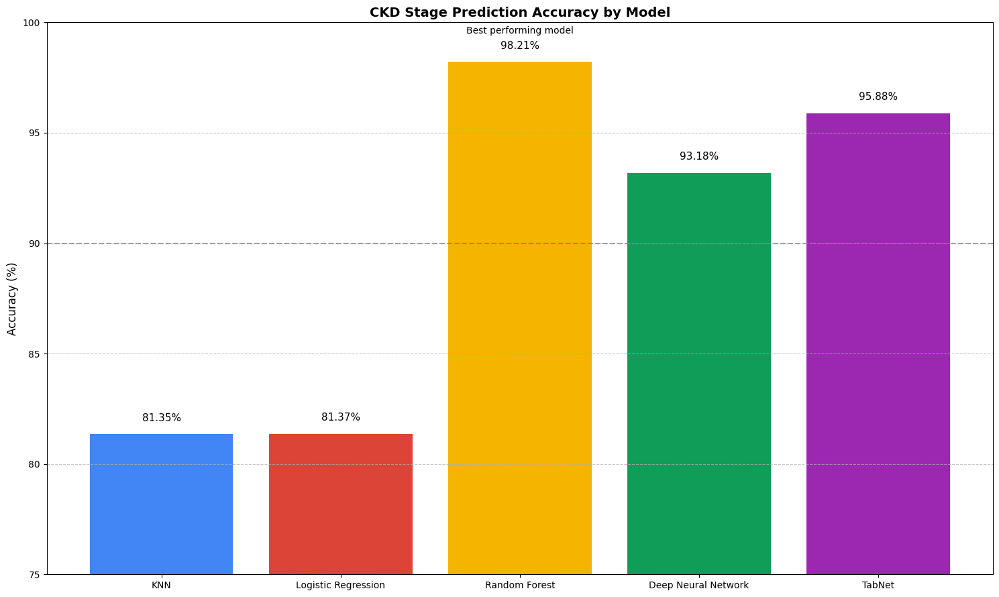

Model Accuracy Summary:
KNN: 81.35%
Logistic Regression: 81.37%
Random Forest: 98.21%
Deep Neural Network: 93.18%
TabNet: 95.88%

Best performing model: Random Forest (98.21%)
Worst performing model: KNN (81.35%)
Average accuracy across all models: 90.00%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Model names and their corresponding accuracies
models = ['KNN', 'Logistic Regression', 'Random Forest', 'Deep Neural Network', 'TabNet']
accuracies = [81.35, 81.37, 98.21, 93.18, 95.88]

# Create figure and axis
plt.figure(figsize=(15, 9))

# Create bar chart
bars = plt.bar(models, accuracies, color=['#4285F4', '#DB4437', '#F4B400', '#0F9D58', '#9C27B0'])

# Add a horizontal line at 90% for reference
plt.axhline(y=90, color='gray', linestyle='--', alpha=0.7)

# Customize the chart
plt.ylim(75, 100)  # Set y-axis limits for better visualization
plt.ylabel('Accuracy (%)', fontsize=12)
plt.title('CKD Stage Prediction Accuracy by Model', fontsize=14, fontweight='bold')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add text labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height}%', ha='center', va='bottom', fontsize=11)

# Add a note about the best performing model
plt.annotate('Best performing model', xy=(2, 98.21), xytext=(2, 99.5),
             ha='center', fontsize=10)

# Improve aesthetics
plt.tight_layout()

# Show the plot
plt.show()

# Print a summary of the results
print("Model Accuracy Summary:")
for model, accuracy in zip(models, accuracies):
    print(f"{model}: {accuracy}%")

print("\nBest performing model: Random Forest (98.21%)")
print("Worst performing model: KNN (81.35%)")
print(f"Average accuracy across all models: {sum(accuracies)/len(accuracies):.2f}%")